#Medical Insurance Cost Prediction
##Traditional Regression Vs Quantile Regression

Here, We will explore a dataset consists of patients data for medical cost. The cost of medical treatment depends on many factors: number of diseases, diseases, bmi, , diagbosis, number of childeren, city of residence, age and so on. We have data which can help us to find patterns or draw conclusion about health of patients and their medical costs. But we dont have personal data like diseases and diagnosis.
Let's jump into data and explore it.

### Importing necessary libraries

In [ ]:
#!pip install deap

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import xgboost as xgb

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
import statsmodels.api as sm
from statsmodels.formula.api import ols
from statsmodels.stats.anova import anova_lm
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.preprocessing import OneHotEncoder
from sklearn.feature_selection import RFECV
from sklearn.linear_model import LinearRegression
#from deap import base, creator, tools, algorithms
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from sklearn.feature_selection import SelectKBest, chi2
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from scipy.stats import norm
import matplotlib as mpl
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import Ridge, Lasso, LinearRegression

Importing Data

In [ ]:
# Load the dataset
file_path = 'https://raw.githubusercontent.com/shubhamvm/Kaggle/main/Final%20Project/Datasets/insurance.csv'
data = pd.read_csv(file_path)
data.head()

,age,sex,bmi,children,smoker,region,charges
0,19,female,27.900,0,yes,southwest,16884.92400
1,18,male,33.770,1,no,southeast,1725.55230
2,28,male,33.000,3,no,southeast,4449.46200
3,33,male,22.705,0,no,northwest,21984.47061
4,32,male,28.880,0,no,northwest,3866.85520


In [ ]:
# Check for missing values
missing_values = data.isnull().sum()
print("Missing Values in Each Column:")
print(missing_values)

Missing Values in Each Column:
age         0
sex         0
bmi         0
children    0
smoker      0
region      0
charges     0
dtype: int64


In [ ]:
# Check data types
data_types = data.dtypes
print("\nData Types of Each Column:")
print(data_types)


Data Types of Each Column:
age           int64
sex          object
bmi         float64
children      int64
smoker       object
region       object
charges     float64
dtype: object


In [ ]:
# Summary statistics for all columns
summary_stats = data.describe(include='all')
print("\nSummary Statistics:")
print(summary_stats)



Summary Statistics:
                age   sex          bmi     children smoker     region  \
count   1338.000000  1338  1338.000000  1338.000000   1338       1338   
unique          NaN     2          NaN          NaN      2          4   
top             NaN  male          NaN          NaN     no  southeast   
freq            NaN   676          NaN          NaN   1064        364   
mean      39.207025   NaN    30.663397     1.094918    NaN        NaN   
std       14.049960   NaN     6.098187     1.205493    NaN        NaN   
min       18.000000   NaN    15.960000     0.000000    NaN        NaN   
25%       27.000000   NaN    26.296250     0.000000    NaN        NaN   
50%       39.000000   NaN    30.400000     1.000000    NaN        NaN   
75%       51.000000   NaN    34.693750     2.000000    NaN        NaN   
max       64.000000   NaN    53.130000     5.000000    NaN        NaN   

             charges  
count    1338.000000  
unique           NaN  
top              NaN  
freq      

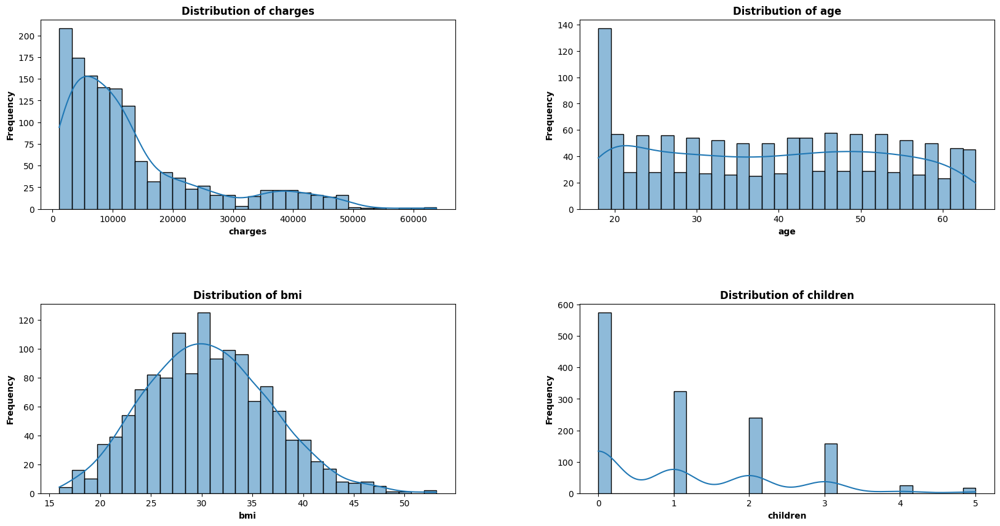

In [ ]:
# Define the numerical features
numerical_cols = ['charges', 'age', 'bmi', 'children']

# Set up the figure and axes
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(20, 10))
axes = axes.flatten()

# Plot the distributions
for i, col in enumerate(numerical_cols):
    sns.histplot(data=data, x=col, bins=30, kde=True, ax=axes[i])
    axes[i].set_title(f'Distribution of {col}', fontweight='bold')
    axes[i].set_xlabel(col, fontweight='semibold')
    axes[i].set_ylabel('Frequency', fontweight='semibold')

# Adjust spacing between subplots
plt.subplots_adjust(hspace=0.5, wspace=0.3)

# Display the plot
plt.show()

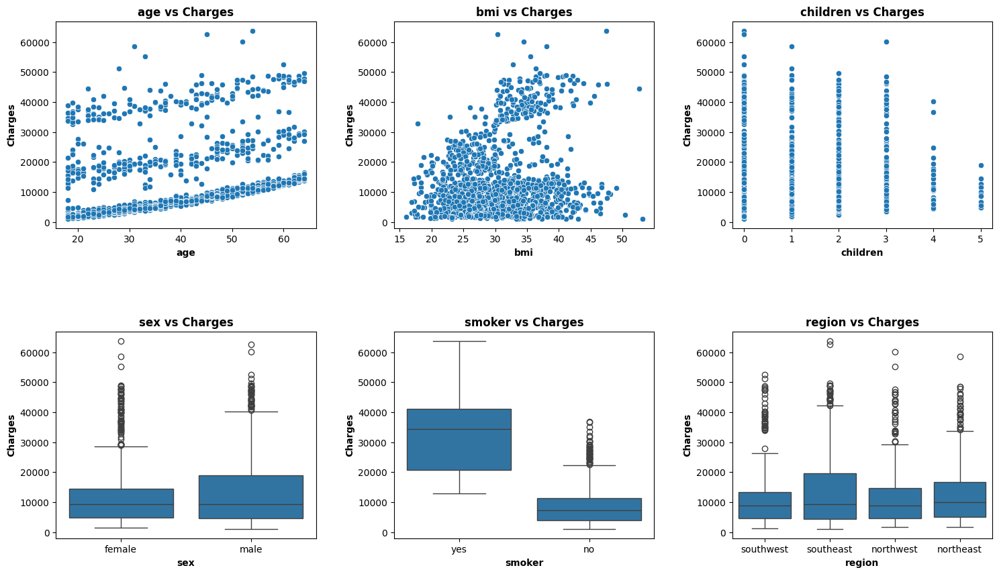

In [ ]:
# Define the numerical and categorical features
numerical_cols = ['age', 'bmi', 'children']
categorical_cols = ['sex', 'smoker', 'region']

# Set up the figure and axes
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(18, 10))
axes = axes.flatten()

# Scatter plots for numerical variables vs. charges
for i, col in enumerate(numerical_cols):
    if col != 'charges':
        sns.scatterplot(x=data[col], y=data['charges'], ax=axes[i])
        axes[i].set_title(f'{col} vs Charges', fontweight='bold')
        axes[i].set_xlabel(col, fontweight='semibold')
        axes[i].set_ylabel('Charges', fontweight='semibold')

# Box plots for categorical variables vs. charges
for i, col in enumerate(categorical_cols, start=len(numerical_cols)):
    sns.boxplot(x=data[col], y=data['charges'], ax=axes[i])
    axes[i].set_title(f'{col} vs Charges', fontweight='bold')
    axes[i].set_xlabel(col, fontweight='semibold')
    axes[i].set_ylabel('Charges', fontweight='semibold')

# Adjust spacing between subplots
plt.subplots_adjust(hspace=0.5, wspace=0.3)

# Display the plot
plt.show()


In [ ]:
# Convert categorical variables to numerical codes
data_numeric = data.copy()
data_numeric['sex'] = data_numeric['sex'].astype('category').cat.codes
data_numeric['smoker'] = data_numeric['smoker'].astype('category').cat.codes
data_numeric['region'] = data_numeric['region'].astype('category').cat.codes

# Display the first few rows of the resulting dataframe
data_numeric.head()

,age,sex,bmi,children,smoker,region,charges
0,19,0,27.900,0,1,3,16884.92400
1,18,1,33.770,1,0,2,1725.55230
2,28,1,33.000,3,0,2,4449.46200
3,33,1,22.705,0,0,1,21984.47061
4,32,1,28.880,0,0,1,3866.85520


region: northwest = 1, southeast = 2, southwest = 3, northeast = 4

sex: female = 0, male = 1

smoker: smoker = 1, non-smoker = 0

               age       sex       bmi  children    smoker    region   charges
age       1.000000 -0.020856  0.109272  0.042469 -0.025019  0.002127  0.299008
sex      -0.020856  1.000000  0.046371  0.017163  0.076185  0.004588  0.057292
bmi       0.109272  0.046371  1.000000  0.012759  0.003750  0.157566  0.198341
children  0.042469  0.017163  0.012759  1.000000  0.007673  0.016569  0.067998
smoker   -0.025019  0.076185  0.003750  0.007673  1.000000 -0.002181  0.787251
region    0.002127  0.004588  0.157566  0.016569 -0.002181  1.000000 -0.006208
charges   0.299008  0.057292  0.198341  0.067998  0.787251 -0.006208  1.000000


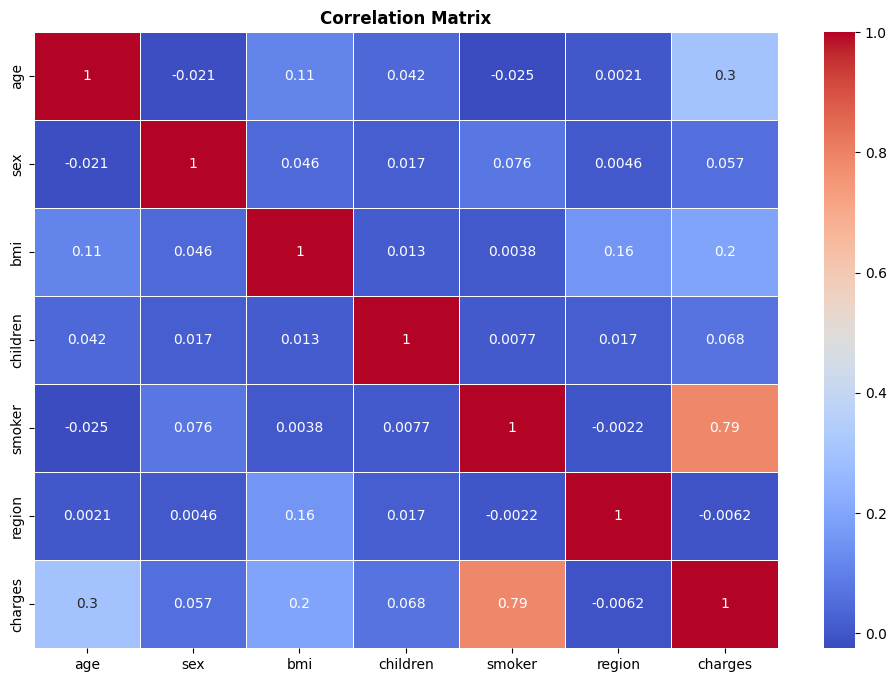

In [ ]:
# Compute the correlation matrix
correlation_matrix = data_numeric.corr()

# Display the correlation matrix
print(correlation_matrix)

# Plot the correlation matrix
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', linewidths=0.5)
plt.title('Correlation Matrix', fontweight='bold')
plt.show()

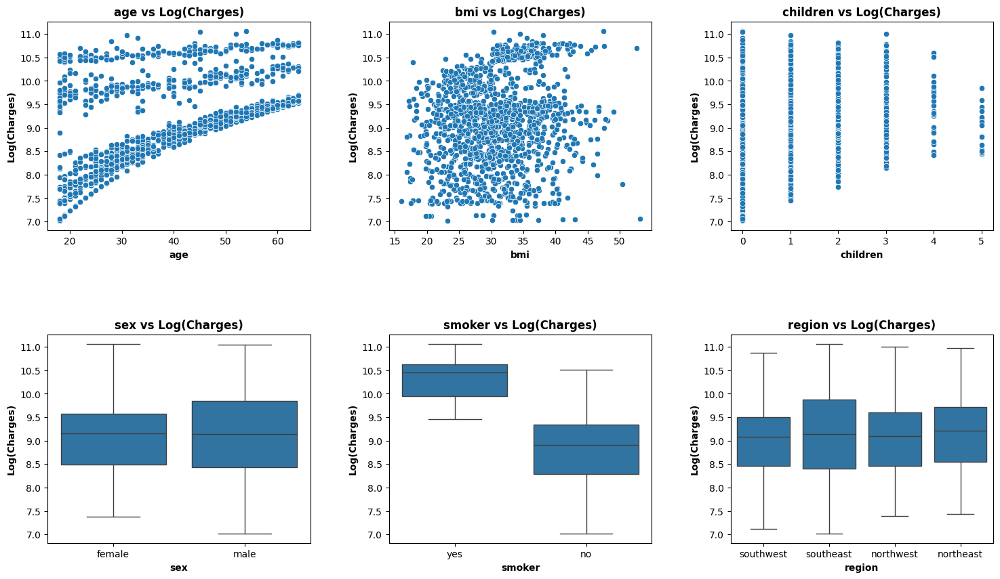

In [ ]:
# Define the numerical and categorical features
numerical_cols = ['age', 'bmi', 'children']
categorical_cols = ['sex', 'smoker', 'region']

# Take log of 'charges' column
data['log_charges'] = np.log(data['charges'])

# Set up the figure and axes
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(18, 10))
axes = axes.flatten()

# Scatter plots for numerical variables vs. charges
for i, col in enumerate(numerical_cols):
    if col != 'charges':
        sns.scatterplot(x=data[col], y=data['log_charges'], ax=axes[i])
        axes[i].set_title(f'{col} vs Log(Charges)', fontweight='bold')
        axes[i].set_xlabel(col, fontweight='semibold')
        axes[i].set_ylabel('Log(Charges)', fontweight='semibold')

# Box plots for categorical variables vs. charges
for i, col in enumerate(categorical_cols, start=len(numerical_cols)):
    sns.boxplot(x=data[col], y=data['log_charges'], ax=axes[i])
    axes[i].set_title(f'{col} vs Log(Charges)', fontweight='bold')
    axes[i].set_xlabel(col, fontweight='semibold')
    axes[i].set_ylabel('Log(Charges)', fontweight='semibold')

# Adjust spacing between subplots
plt.subplots_adjust(hspace=0.5, wspace=0.3)

# Display the plot
plt.show()


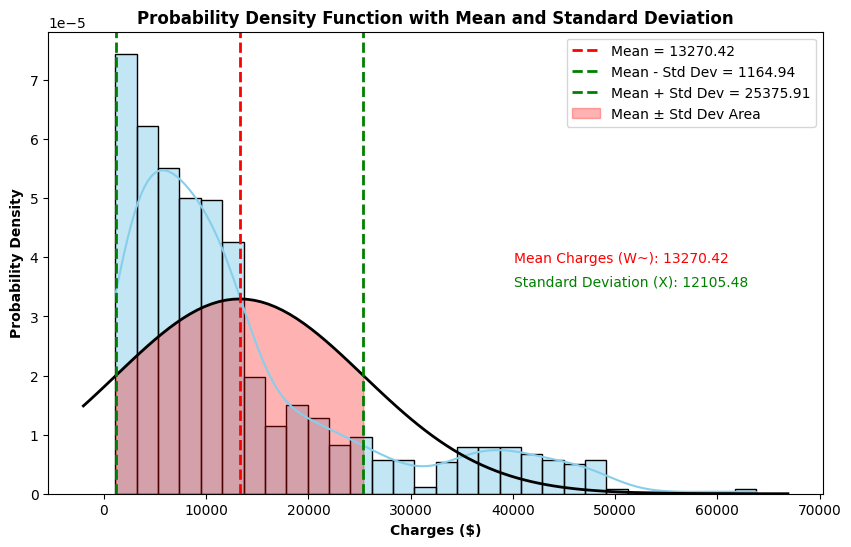

In [ ]:
# Define the numerical feature
numerical_col = 'charges'

# Plot the histogram and kernel density estimate
plt.figure(figsize=(10, 6))
sns.histplot(data=data, x=numerical_col, kde=True, stat="density", bins=30, color="skyblue")

# Create a range of values for the x-axis
xmin, xmax = plt.xlim()
ymin, ymax = plt.ylim()
x = np.linspace(xmin, xmax, 100)

# Fit the data to a normal distribution
mean_value, std_dev = norm.fit(data[numerical_col])

# Plot the PDF using the normal distribution
pdf = norm.pdf(x, mean_value, std_dev)
plt.plot(x, pdf, 'k', linewidth=2)

# Plot mean and standard deviation lines
plt.axvline(mean_value, color='red', linestyle='dashed', linewidth=2, label=f'Mean = {mean_value:.2f}')
plt.axvline(mean_value - std_dev, color='green', linestyle='dashed', linewidth=2, label=f'Mean - Std Dev = {(mean_value - std_dev):.2f}')
plt.axvline(mean_value + std_dev, color='green', linestyle='dashed', linewidth=2, label=f'Mean + Std Dev = {(mean_value + std_dev):.2f}')

# Fill the area between mean - std_dev and mean + std_dev with color
x_fill = np.linspace(mean_value - std_dev, mean_value + std_dev, 100)
y_fill = np.exp(-(x_fill - mean_value)**2 / (2 * std_dev**2)) / (std_dev * np.sqrt(2 * np.pi))
plt.fill_between(x_fill, y_fill, color='red', alpha=0.3, label='Mean ± Std Dev Area')

# Add text annotations
plt.text(xmax * 0.6, ymax * 0.5, f'Mean Charges (W~): {mean_value:.2f}', fontsize=10, color='red')
plt.text(xmax * 0.6, ymax * 0.45, f'Standard Deviation (X): {std_dev:.2f}', fontsize=10, color='green')

# Set plot labels and title
plt.xlabel('Charges ($)', fontweight='bold')
plt.ylabel('Probability Density', fontweight='bold')
plt.title('Probability Density Function with Mean and Standard Deviation', fontweight='bold')

# Add legend
plt.legend()

# Display the plot
plt.show()

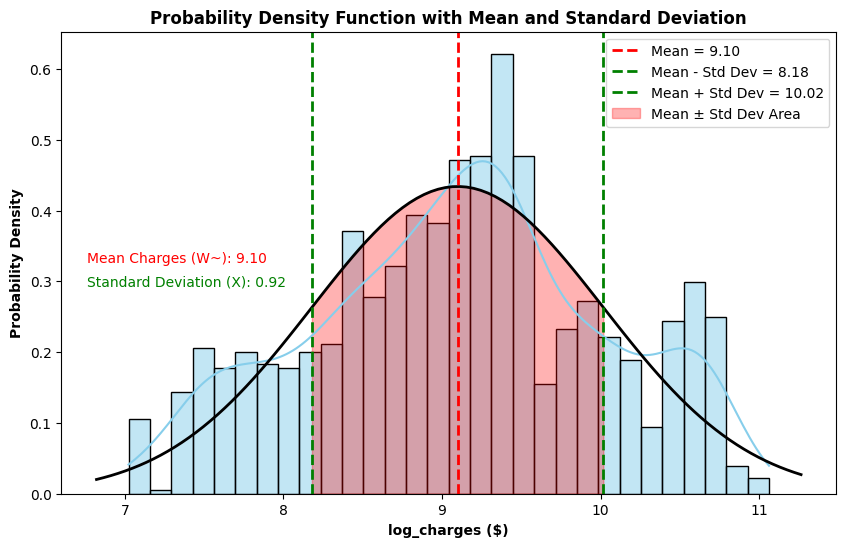

In [ ]:
# Define the numerical feature
numerical_col = 'log_charges'

# Plot the histogram and kernel density estimate
plt.figure(figsize=(10, 6))
sns.histplot(data=data, x=numerical_col, kde=True, stat="density", bins=30, color="skyblue")

# Create a range of values for the x-axis
xmin, xmax = plt.xlim()
ymin, ymax = plt.ylim()
x = np.linspace(xmin, xmax, 100)

# Fit the data to a normal distribution
mean_value, std_dev = norm.fit(data[numerical_col])

# Plot the PDF using the normal distribution
pdf = norm.pdf(x, mean_value, std_dev)
plt.plot(x, pdf, 'k', linewidth=2)

# Plot mean and standard deviation lines
plt.axvline(mean_value, color='red', linestyle='dashed', linewidth=2, label=f'Mean = {mean_value:.2f}')
plt.axvline(mean_value - std_dev, color='green', linestyle='dashed', linewidth=2, label=f'Mean - Std Dev = {(mean_value - std_dev):.2f}')
plt.axvline(mean_value + std_dev, color='green', linestyle='dashed', linewidth=2, label=f'Mean + Std Dev = {(mean_value + std_dev):.2f}')

# Fill the area between mean - std_dev and mean + std_dev with color
x_fill = np.linspace(mean_value - std_dev, mean_value + std_dev, 100)
y_fill = np.exp(-(x_fill - mean_value)**2 / (2 * std_dev**2)) / (std_dev * np.sqrt(2 * np.pi))
plt.fill_between(x_fill, y_fill, color='red', alpha=0.3, label='Mean ± Std Dev Area')

# Add text annotations
plt.text(xmax * 0.6, ymax * 0.5, f'Mean Charges (W~): {mean_value:.2f}', fontsize=10, color='red')
plt.text(xmax * 0.6, ymax * 0.45, f'Standard Deviation (X): {std_dev:.2f}', fontsize=10, color='green')

# Set plot labels and title
plt.xlabel('log_charges ($)', fontweight='bold')
plt.ylabel('Probability Density', fontweight='bold')
plt.title('Probability Density Function with Mean and Standard Deviation', fontweight='bold')

# Add legend
plt.legend()

# Display the plot
plt.show()

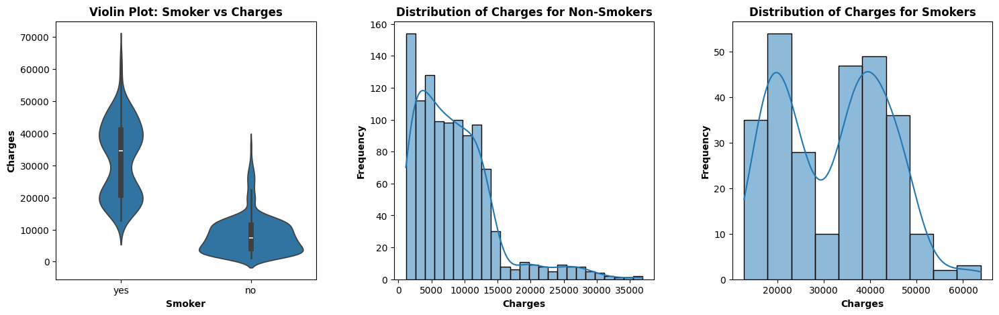

In [ ]:
# Set up the figure and axes
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(18, 5))

# Violin plot for all smokers vs charges
sns.violinplot(x='smoker', y='charges', data=data, ax=axes[0])
axes[0].set_title('Violin Plot: Smoker vs Charges', fontweight='bold')
axes[0].set_xlabel('Smoker', fontweight='semibold')
axes[0].set_ylabel('Charges', fontweight='semibold')

# Distribution plot of charges for non-smokers
non_smokers = data[data['smoker'] == 'no']
sns.histplot(non_smokers['charges'], kde=True, ax=axes[1])
axes[1].set_title('Distribution of Charges for Non-Smokers', fontweight='bold')
axes[1].set_xlabel('Charges', fontweight='semibold')
axes[1].set_ylabel('Frequency', fontweight='semibold')

# Distribution plot of charges for smokers
smokers = data[data['smoker'] == 'yes']
sns.histplot(smokers['charges'], kde=True, ax=axes[2])
axes[2].set_title('Distribution of Charges for Smokers', fontweight='bold')
axes[2].set_xlabel('Charges', fontweight='semibold')
axes[2].set_ylabel('Frequency', fontweight='semibold')

# Adjust spacing between subplots
plt.subplots_adjust(wspace=0.3)

# Display the plot
plt.show()

Smoking patients spend more on health rather than non smokers. Let's see if charges depends on more variables or not.

<Figure size 1000x600 with 0 Axes>

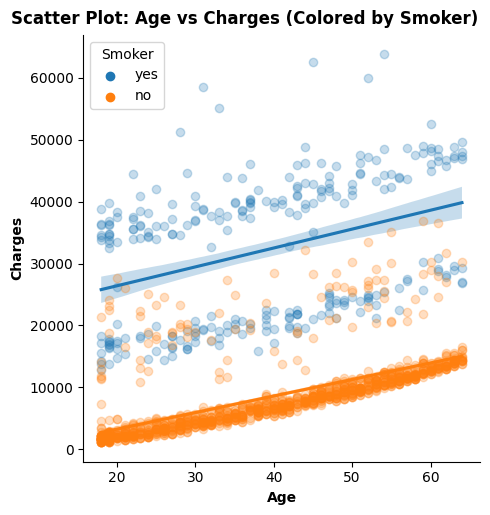

In [ ]:
# Set up the figure and axis
plt.figure(figsize=(10, 6))

# Scatter plot with regression lines for smokers and non-smokers
g = sns.lmplot(x='age', y='charges', hue='smoker', data=data, legend=False)

# Set plot labels and title
g.fig.suptitle('Scatter Plot: Age vs Charges (Colored by Smoker)', fontweight='bold', y=1.02)
g.set_axis_labels('Age', 'Charges', fontweight='semibold')

# Make the visibility of each dot 50%
for artist in g.ax.collections:
    artist.set_alpha(0.25)

# Add legend on the left
leg = g.ax.legend(title='Smoker', title_fontsize='medium', loc='upper left')
for lh in leg.legend_handles:
    lh.set_alpha(1)  # Make legend markers opaque

# Display the plot
plt.show()

<ipython-input-16-6fe9a30e843a>:6: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_data = data.groupby(['age_group', 'smoker'])['charges'].mean().reset_index()


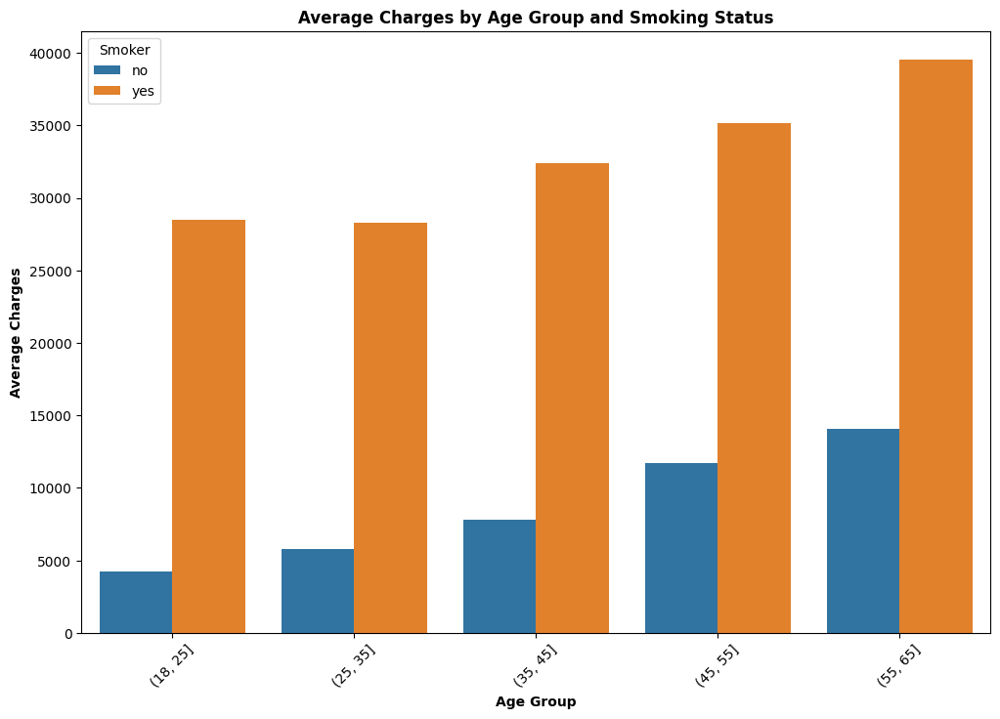

In [ ]:
# Define the age bins
age_bins = [18, 25, 35, 45, 55, 65]
data['age_group'] = pd.cut(data['age'], bins=age_bins)

# Group by age group and smoker status and calculate average charges
grouped_data = data.groupby(['age_group', 'smoker'])['charges'].mean().reset_index()

# Plot the results
plt.figure(figsize=(12, 8))
sns.barplot(x='age_group', y='charges', hue='smoker', data=grouped_data)
plt.title('Average Charges by Age Group and Smoking Status', fontweight='bold')
plt.xlabel('Age Group', fontweight='semibold')
plt.ylabel('Average Charges', fontweight='semibold')
plt.legend(title='Smoker')
plt.xticks(rotation=45)
plt.show()

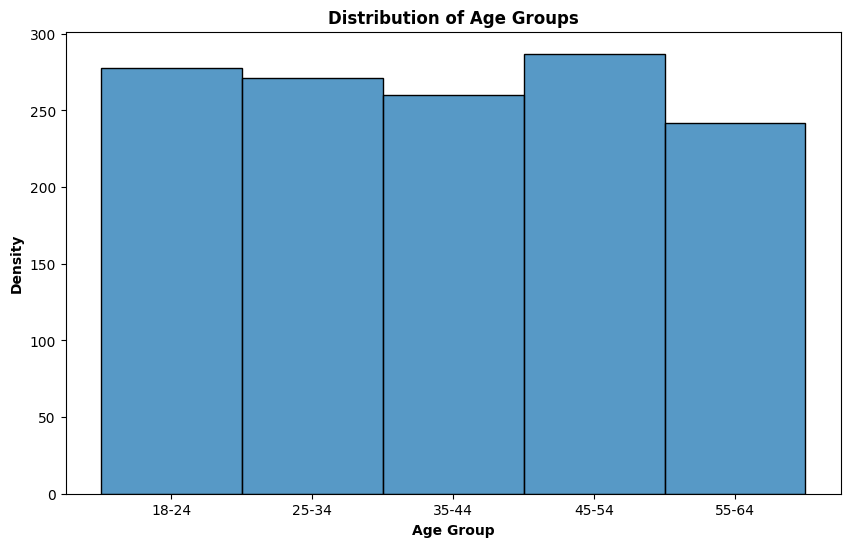

In [ ]:
# Define the age bins
age_bins = [18, 25, 35, 45, 55, 65]
age_labels = ['18-24', '25-34', '35-44', '45-54', '55-64']
data['age_group'] = pd.cut(data['age'], bins=age_bins, labels=age_labels, right=False)

# Create a distribution plot for the age groups
plt.figure(figsize=(10, 6))
sns.histplot(data=data, x='age_group', discrete=True)
plt.title('Distribution of Age Groups', fontweight='bold')
plt.xlabel('Age Group', fontweight='semibold')
plt.ylabel('Density', fontweight='semibold')
plt.show()

<Figure size 1000x600 with 0 Axes>

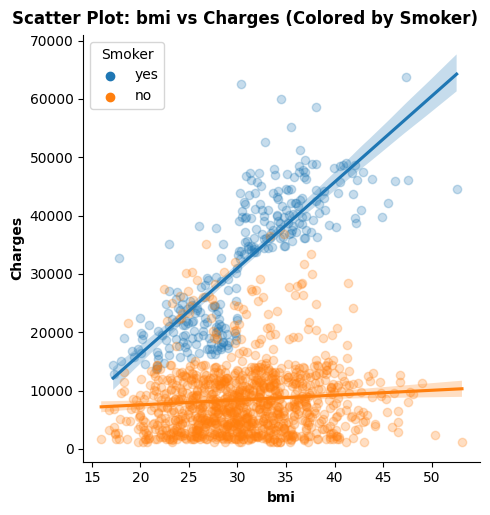

In [ ]:
# Set up the figure and axis
plt.figure(figsize=(10, 6))

# Scatter plot with regression lines for smokers and non-smokers
g = sns.lmplot(x='bmi', y='charges', hue='smoker', data=data, legend=False)

# Set plot labels and title
g.fig.suptitle('Scatter Plot: bmi vs Charges (Colored by Smoker)', fontweight='bold', y=1.02)
g.set_axis_labels('bmi', 'Charges', fontweight='semibold')

# Make the visibility of each dot 50%
for artist in g.ax.collections:
    artist.set_alpha(0.25)

# Add legend on the left
leg = g.ax.legend(title='Smoker', title_fontsize='medium', loc='upper left')
for lh in leg.legend_handles:
    lh.set_alpha(1)  # Make legend markers opaque

# Display the plot
plt.show()

<Figure size 1000x600 with 0 Axes>

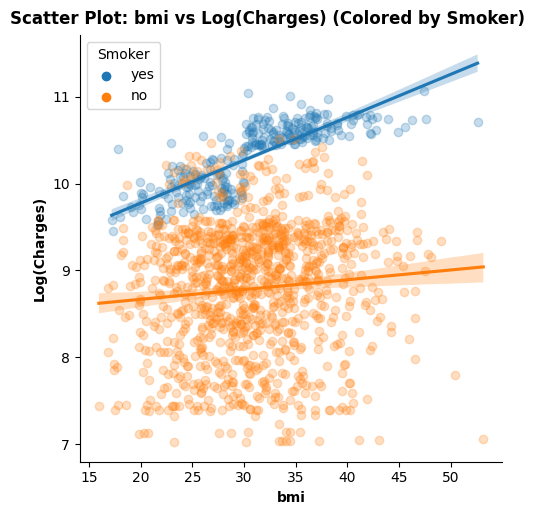

In [ ]:
# Set up the figure and axis
plt.figure(figsize=(10, 6))

# Scatter plot with regression lines for smokers and non-smokers
g = sns.lmplot(x='bmi', y='log_charges', hue='smoker', data=data, legend=False)

# Set plot labels and title
g.fig.suptitle('Scatter Plot: bmi vs Log(Charges) (Colored by Smoker)', fontweight='bold', y=1.02)
g.set_axis_labels('bmi', 'Log(Charges)', fontweight='semibold')

# Make the visibility of each dot 50%
for artist in g.ax.collections:
    artist.set_alpha(0.25)

# Add legend on the left
leg = g.ax.legend(title='Smoker', title_fontsize='medium', loc='upper left')
for lh in leg.legend_handles:
    lh.set_alpha(1)  # Make legend markers opaque

# Display the plot
plt.show()

<Figure size 1000x600 with 0 Axes>

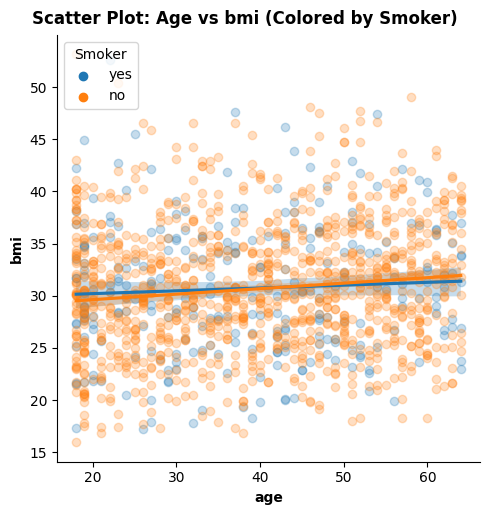

In [ ]:
# Set up the figure and axis
plt.figure(figsize=(10, 6))

# Scatter plot with regression lines for smokers and non-smokers
g = sns.lmplot(x='age', y='bmi', hue='smoker', data=data, legend=False)

# Set plot labels and title
g.fig.suptitle('Scatter Plot: Age vs bmi (Colored by Smoker)', fontweight='bold', y=1.02)
g.set_axis_labels('age', 'bmi', fontweight='semibold')

# Make the visibility of each dot 50%
for artist in g.ax.collections:
    artist.set_alpha(0.25)

# Add legend on the left
leg = g.ax.legend(title='Smoker', title_fontsize='medium', loc='upper left')
for lh in leg.legend_handles:
    lh.set_alpha(1)  # Make legend markers opaque

# Display the plot
plt.show()

Interesting findings, if bmi increases of non-smoker, charges doesn't go much higher but for smokers, it exponentially increases.

In [ ]:
# Convert categorical variables to numerical codes
data_num = data.copy()
data_num['sex'] = data_num['sex'].astype('category').cat.codes
data_num['smoker'] = data_num['smoker'].astype('category').cat.codes
data_num = data_num.drop(['log_charges', 'age_group'], axis=1)
# One-hot encode the 'region' column with 0/1 values
data_encoded = pd.get_dummies(data_num, columns=['region'], dtype='uint8')

# Display the first few rows of the resulting dataframe
data_encoded.head()

,age,sex,bmi,children,smoker,charges,region_northeast,region_northwest,region_southeast,region_southwest
0,19,0,27.900,0,1,16884.92400,0,0,0,1
1,18,1,33.770,1,0,1725.55230,0,0,1,0
2,28,1,33.000,3,0,4449.46200,0,0,1,0
3,33,1,22.705,0,0,21984.47061,0,1,0,0
4,32,1,28.880,0,0,3866.85520,0,1,0,0


Feature Selection

VIF

In [ ]:
X = data_encoded.drop('charges', axis=1)

# Add a constant term to the independent variable matrix
X = sm.add_constant(X)

vif = pd.DataFrame()
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['feature'] = X.columns

# Sort the VIF values in ascending order
vif = vif.sort_values('VIF', ascending=True)

print(vif)

        VIF           feature
0  0.000000             const
4  1.004011          children
2  1.008900               sex
5  1.012074            smoker
1  1.016822               age
3  1.106630               bmi
6       inf  region_northeast
7       inf  region_northwest
8       inf  region_southeast
9       inf  region_southwest


/usr/local/lib/python3.10/dist-packages/statsmodels/regression/linear_model.py:1783: RuntimeWarning: divide by zero encountered in scalar divide
  return 1 - self.ssr/self.centered_tss
/usr/local/lib/python3.10/dist-packages/statsmodels/stats/outliers_influence.py:197: RuntimeWarning: divide by zero encountered in scalar divide
  vif = 1. / (1. - r_squared_i)


ANOVA (Analysis of Variance)

In [ ]:

# Assuming 'data_encoded' is your DataFrame with independent variables
X = data_encoded.drop('charges', axis=1)
y = data_encoded['charges']

anova_results = {}

for feature in X.columns:
    groups = X[feature].unique()
    data_groups = [y[X[feature] == group] for group in groups]

    f_value, p_value = f_oneway(*data_groups)
    anova_results[feature] = p_value

anova_results = pd.DataFrame.from_dict(anova_results, orient='index', columns=['p_value'])
anova_results = anova_results.sort_values(by='p_value', ascending=True)

print(anova_results)

                        p_value
smoker            8.271436e-283
age                1.060528e-16
children           5.785681e-03
region_southeast   6.782699e-03
sex                3.613272e-02
bmi                8.372451e-02
region_southwest   1.141466e-01
region_northwest   1.445970e-01
region_northeast   8.165264e-01


RFECV (Recursive Feature Elimination with Cross-Validation):
RFECV is a method that recursively removes features and evaluates the model performance using cross-validation.

Optimal number of features: 6
Selected features: Index(['age', 'sex', 'bmi', 'children', 'smoker', 'region'], dtype='object')


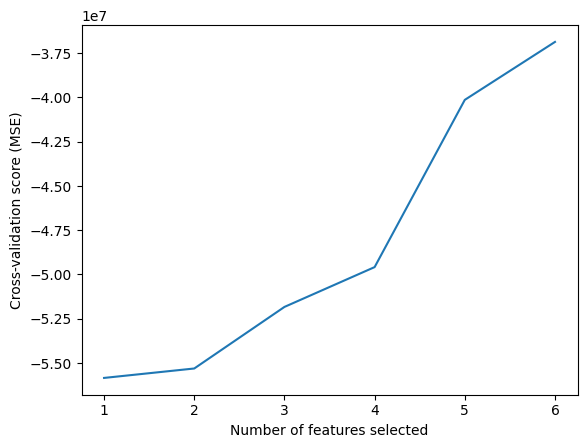

In [ ]:
X = data_numeric.drop('charges', axis=1)
y = data_numeric['charges']

model = LinearRegression()
rfecv = RFECV(estimator=model, step=1, cv=5, scoring='neg_mean_squared_error')
rfecv.fit(X, y)

print("Optimal number of features: {}".format(rfecv.n_features_))
print("Selected features: {}".format(X.columns[rfecv.support_]))
# Plot number of features vs. cross-validation scores
plt.figure()
plt.xlabel("Number of features selected")
plt.ylabel("Cross-validation score (MSE)")
plt.plot(range(1, len(rfecv.cv_results_['mean_test_score']) + 1), rfecv.cv_results_['mean_test_score'])
plt.show()

**Random Forest Importance:**
Random Forest models can provide feature importance scores, which can be used for feature selection.

In [ ]:
from sklearn.ensemble import RandomForestRegressor

rf = RandomForestRegressor(n_estimators=100, random_state=42)
rf.fit(X, y)

importances = pd.DataFrame({'feature': X.columns, 'importance': rf.feature_importances_})
importances = importances.sort_values(by='importance', ascending=False)

print(importances)

    feature  importance
4    smoker    0.619903
2       bmi    0.209326
0       age    0.131076
3  children    0.019766
5    region    0.014146
1       sex    0.005782


Pearson Correlation Coefficient:
The Pearson Correlation Coefficient measures the linear relationship between two variables. You can calculate the correlation between each independent variable and the target variable to identify the most relevant features.

In [ ]:
corr_coefficients = X.corrwith(y)
corr_coefficients = corr_coefficients.sort_values(ascending=False)

print(corr_coefficients)

smoker      0.787251
age         0.299008
bmi         0.198341
children    0.067998
sex         0.057292
region     -0.006208
dtype: float64


In [ ]:
from sklearn.cluster import KMeans

# Select the features for clustering
features = data[['age', 'charges']]

# Perform K-means clustering
kmeans = KMeans(n_clusters=3, random_state=42)
cluster_labels = kmeans.fit_predict(features)

# Add cluster labels to the original dataframe
data['cluster'] = cluster_labels

# Create separate dataframes for each cluster
cluster_0 = data[data['cluster'] == 0]
cluster_1 = data[data['cluster'] == 1]
cluster_2 = data[data['cluster'] == 2]

# Print the size of each cluster
print("Cluster 0 size:", len(cluster_0))
print("Cluster 1 size:", len(cluster_1))
print("Cluster 2 size:", len(cluster_2))

# Display the first few rows of each cluster
print("\nCluster 0:")
print(cluster_0.head())
print("\nCluster 1:")
print(cluster_1.head())
print("\nCluster 2:")
print(cluster_2.head())
data.head()

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


Cluster 0 size: 803
Cluster 1 size: 366
Cluster 2 size: 169

Cluster 0:
   age     sex    bmi  children smoker     region    charges  log_charges  \
1   18    male  33.77         1     no  southeast  1725.5523     7.453302   
2   28    male  33.00         3     no  southeast  4449.4620     8.400538   
4   32    male  28.88         0     no  northwest  3866.8552     8.260197   
5   31  female  25.74         0     no  southeast  3756.6216     8.231275   
6   46  female  33.44         1     no  southeast  8240.5896     9.016827   

  age_group  cluster  
1     18-24        0  
2     25-34        0  
4     25-34        0  
5     25-34        0  
6     45-54        0  

Cluster 1:
    age     sex     bmi  children smoker     region      charges  log_charges  \
0    19  female  27.900         0    yes  southwest  16884.92400     9.734176   
3    33    male  22.705         0     no  northwest  21984.47061     9.998092   
11   62  female  26.290         0    yes  southeast  27808.72510    10.2

,age,sex,bmi,children,smoker,region,charges,log_charges,age_group,cluster
0,19,female,27.900,0,yes,southwest,16884.92400,9.734176,18-24,1
1,18,male,33.770,1,no,southeast,1725.55230,7.453302,18-24,0
2,28,male,33.000,3,no,southeast,4449.46200,8.400538,25-34,0
3,33,male,22.705,0,no,northwest,21984.47061,9.998092,25-34,1
4,32,male,28.880,0,no,northwest,3866.85520,8.260197,25-34,0


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


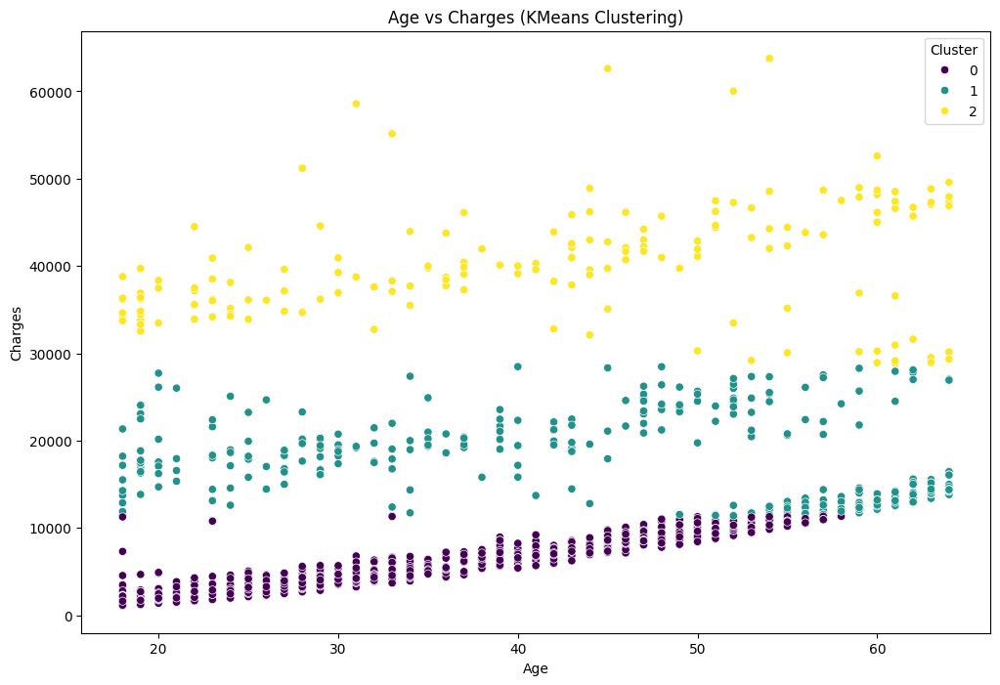

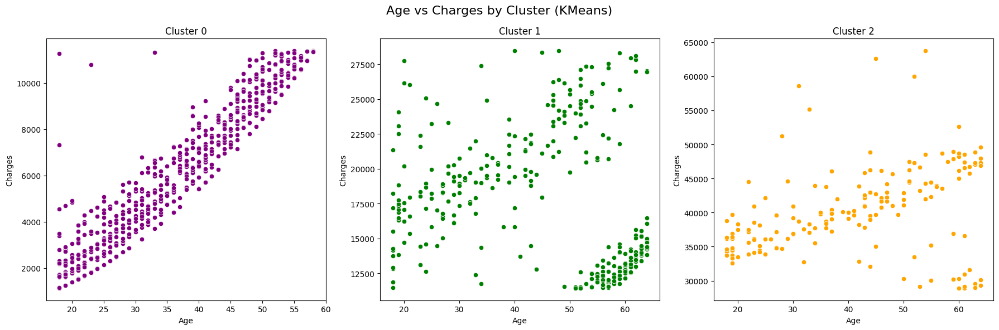

Cluster 0 size: 803
Cluster 1 size: 366
Cluster 2 size: 169


,age,sex,bmi,children,smoker,region,charges,log_charges,age_group,cluster
0,19,female,27.900,0,yes,southwest,16884.92400,9.734176,18-24,1
1,18,male,33.770,1,no,southeast,1725.55230,7.453302,18-24,0
2,28,male,33.000,3,no,southeast,4449.46200,8.400538,25-34,0
3,33,male,22.705,0,no,northwest,21984.47061,9.998092,25-34,1
4,32,male,28.880,0,no,northwest,3866.85520,8.260197,25-34,0


In [ ]:
# Select the features for clustering
cl_features = data[['age', 'charges']]

# Perform K-means clustering
kmeans = KMeans(n_clusters=3, random_state=42)
cluster_labels = kmeans.fit_predict(cl_features)

# Create a new DataFrame with the original data and cluster labels
clustered_data = data_numeric.copy()
clustered_data['cluster'] = cluster_labels

# Plot the original scatter plot with clusters
plt.figure(figsize=(12, 8))
sns.scatterplot(x='age', y='charges', hue='cluster', data=clustered_data, palette='viridis')
plt.title('Age vs Charges (KMeans Clustering)')
plt.xlabel('Age')
plt.ylabel('Charges')
plt.legend(title='Cluster')
plt.show()

# Create separate dataframes for each cluster
cluster_0 = data[data['cluster'] == 0]
cluster_1 = data[data['cluster'] == 1]
cluster_2 = data[data['cluster'] == 2]

# Plot separate graphs for each cluster
fig, axs = plt.subplots(1, 3, figsize=(18, 6))
fig.suptitle('Age vs Charges by Cluster (KMeans)', fontsize=16)

sns.scatterplot(x='age', y='charges', data=cluster_0, ax=axs[0], color='purple')
axs[0].set_title('Cluster 0')

sns.scatterplot(x='age', y='charges', data=cluster_1, ax=axs[1], color='green')
axs[1].set_title('Cluster 1')

sns.scatterplot(x='age', y='charges', data=cluster_2, ax=axs[2], color='orange')
axs[2].set_title('Cluster 2')

for ax in axs:
    ax.set_xlabel('Age')
    ax.set_ylabel('Charges')

plt.tight_layout()
plt.show()

# Print cluster sizes
for i in range(3):
    print(f"Cluster {i} size:", len(data[data['cluster'] == i]))

data.head()

In [ ]:
# Summary statistics of each cluster
cluster_summary = clustered_data.groupby('cluster').mean()
print(cluster_summary)


               age       sex        bmi  children    smoker    region  \
cluster                                                                 
0        35.250311  0.506849  30.435399  1.094645  0.000000  1.560399   
1        46.959016  0.450820  29.360423  1.076503  0.319672  1.387978   
2        41.218935  0.615385  34.568550  1.136095  0.928994  1.579882   

              charges  
cluster                
0         5836.673075  
1        17108.525310  
2        40279.622768  


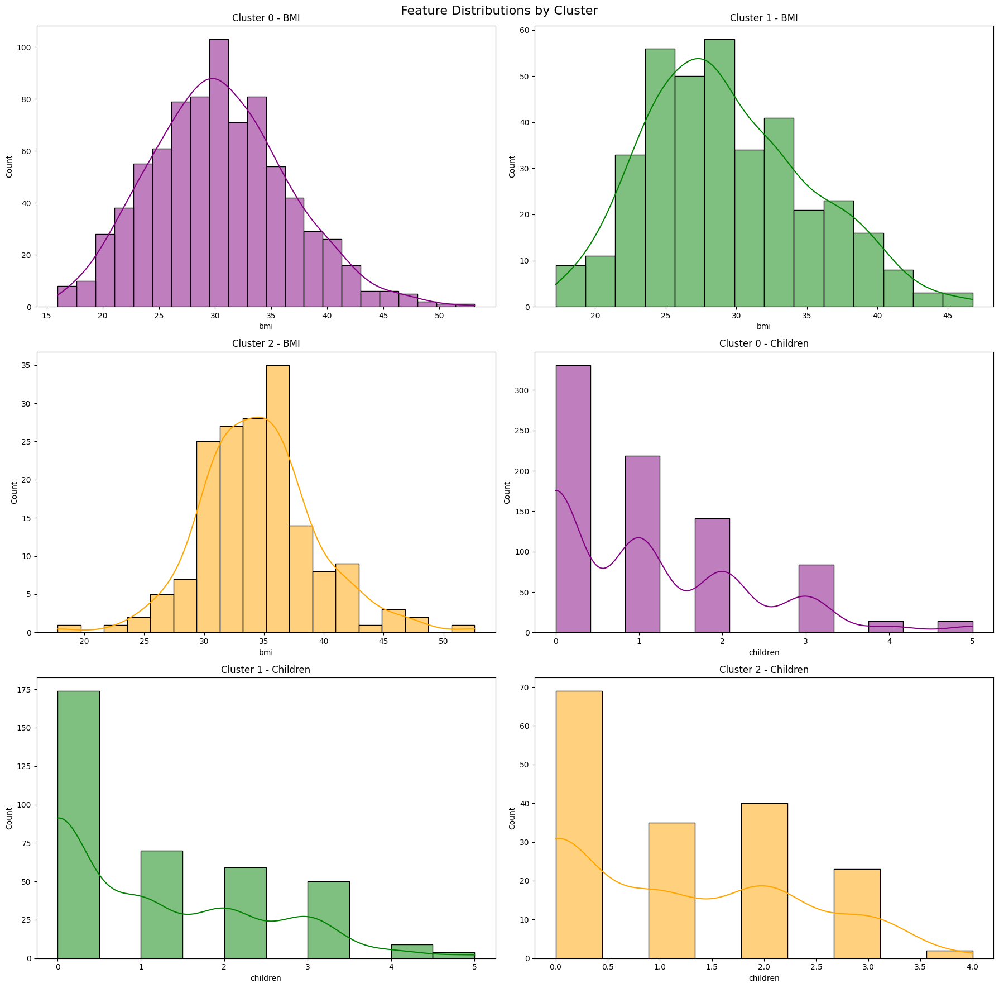

In [ ]:
# Plot distributions of other features for each cluster
fig, axs = plt.subplots(3, 2, figsize=(18, 18))
fig.suptitle('Feature Distributions by Cluster', fontsize=16)

sns.histplot(clustered_data[clustered_data['cluster'] == 0]['bmi'], ax=axs[0, 0], color='purple', kde=True)
axs[0, 0].set_title('Cluster 0 - BMI')

sns.histplot(clustered_data[clustered_data['cluster'] == 1]['bmi'], ax=axs[0, 1], color='green', kde=True)
axs[0, 1].set_title('Cluster 1 - BMI')

sns.histplot(clustered_data[clustered_data['cluster'] == 2]['bmi'], ax=axs[1, 0], color='orange', kde=True)
axs[1, 0].set_title('Cluster 2 - BMI')

sns.histplot(clustered_data[clustered_data['cluster'] == 0]['children'], ax=axs[1, 1], color='purple', kde=True)
axs[1, 1].set_title('Cluster 0 - Children')

sns.histplot(clustered_data[clustered_data['cluster'] == 1]['children'], ax=axs[2, 0], color='green', kde=True)
axs[2, 0].set_title('Cluster 1 - Children')

sns.histplot(clustered_data[clustered_data['cluster'] == 2]['children'], ax=axs[2, 1], color='orange', kde=True)
axs[2, 1].set_title('Cluster 2 - Children')

plt.tight_layout()
plt.show()


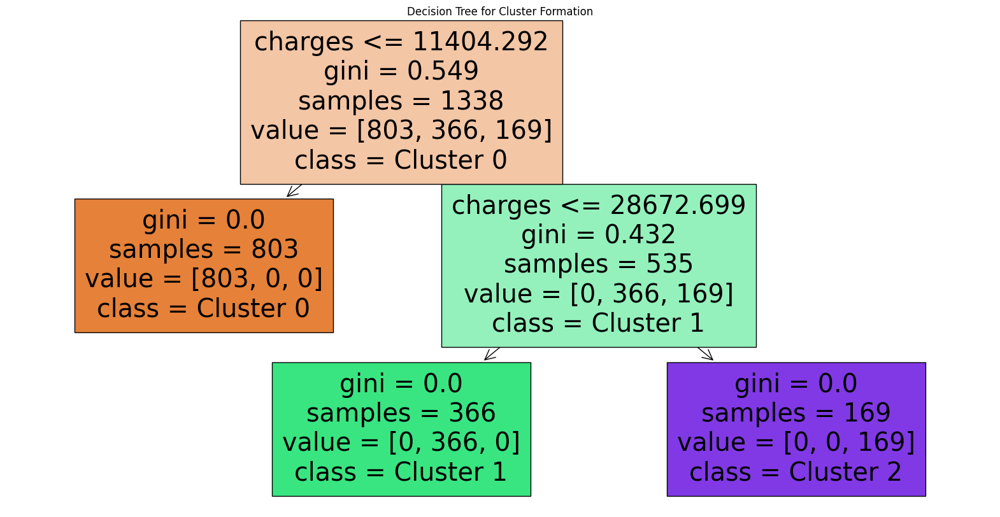

In [ ]:
from sklearn.tree import DecisionTreeClassifier, plot_tree

# Select relevant features
features = ['age', 'charges', 'bmi', 'children', 'smoker', 'region']
X = data_numeric[features]
y = clustered_data['cluster']

# Train a decision tree classifier
clf = DecisionTreeClassifier(max_depth=3, random_state=0)
clf.fit(X, y)

# Plot the decision tree
plt.figure(figsize=(20, 10))
plot_tree(clf, feature_names=features, class_names=['Cluster 0', 'Cluster 1', 'Cluster 2'], filled=True)
plt.title('Decision Tree for Cluster Formation')
plt.show()


In [ ]:
# Add cluster labels to the original dataframe
data['cluster'] = cluster_labels\

# Display the first few rows of each cluster
print("\nCluster 0:")
cluster_0.head()


Cluster 0:


,age,sex,bmi,children,smoker,region,charges,log_charges,age_group,cluster
1,18,male,33.77,1,no,southeast,1725.5523,7.453302,18-24,0
2,28,male,33.00,3,no,southeast,4449.4620,8.400538,25-34,0
4,32,male,28.88,0,no,northwest,3866.8552,8.260197,25-34,0
5,31,female,25.74,0,no,southeast,3756.6216,8.231275,25-34,0
6,46,female,33.44,1,no,southeast,8240.5896,9.016827,45-54,0


In [ ]:
print("\nCluster 1:")
cluster_1.head()


Cluster 1:


,age,sex,bmi,children,smoker,region,charges,log_charges,age_group,cluster
0,19,female,27.900,0,yes,southwest,16884.92400,9.734176,18-24,1
3,33,male,22.705,0,no,northwest,21984.47061,9.998092,25-34,1
11,62,female,26.290,0,yes,southeast,27808.72510,10.233105,55-64,1
20,60,female,36.005,0,no,northeast,13228.84695,9.490155,55-64,1
25,59,female,27.720,3,no,southeast,14001.13380,9.546894,55-64,1


In [ ]:
print("\nCluster 2:")
cluster_2.head()


Cluster 2:


,age,sex,bmi,children,smoker,region,charges,log_charges,age_group,cluster
9,60,female,25.84,0,no,northwest,28923.13692,10.272397,55-64,2
14,27,male,42.13,0,yes,southeast,39611.75770,10.586881,25-34,2
19,30,male,35.30,0,yes,southwest,36837.46700,10.514271,25-34,2
23,34,female,31.92,1,yes,northeast,37701.87680,10.537465,25-34,2
29,31,male,36.30,2,yes,southwest,38711.00000,10.563879,25-34,2


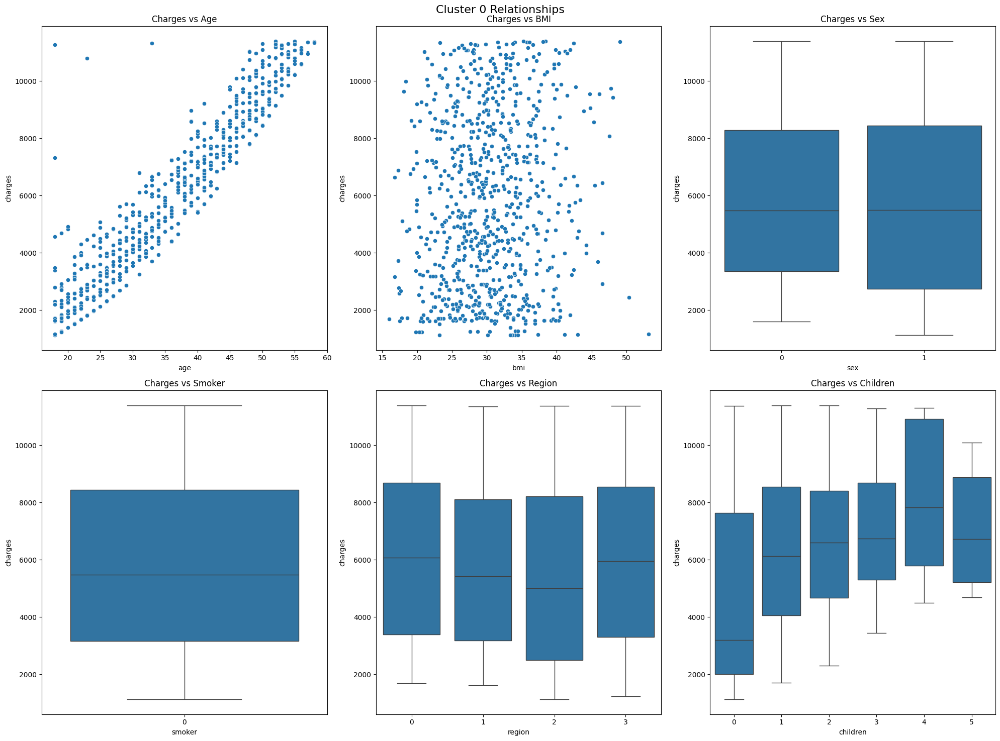

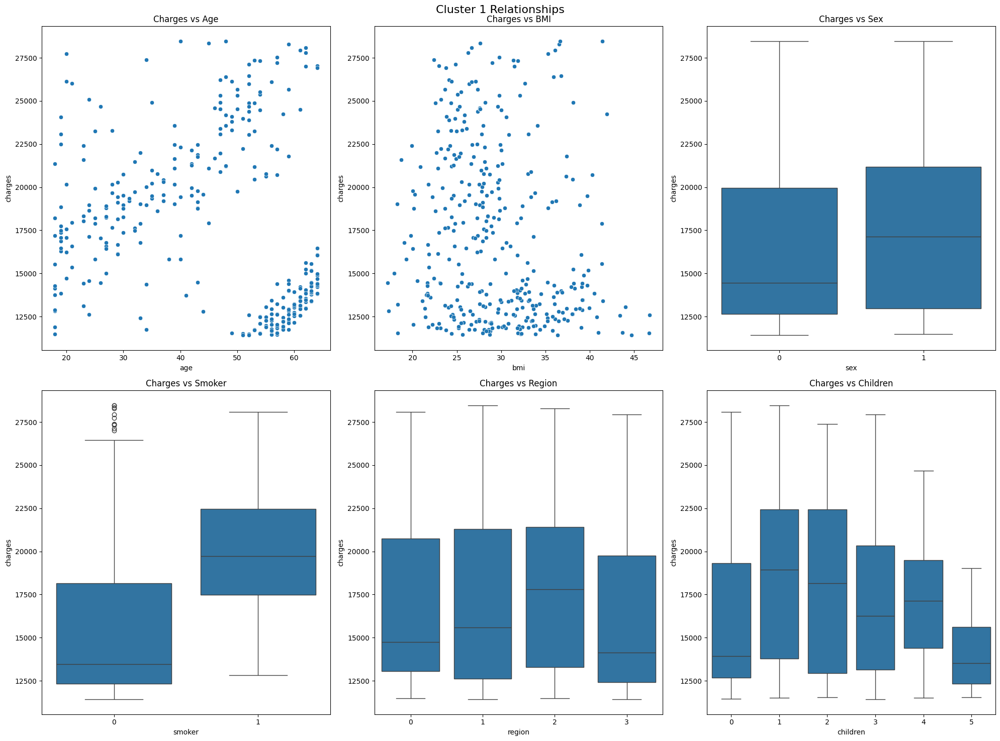

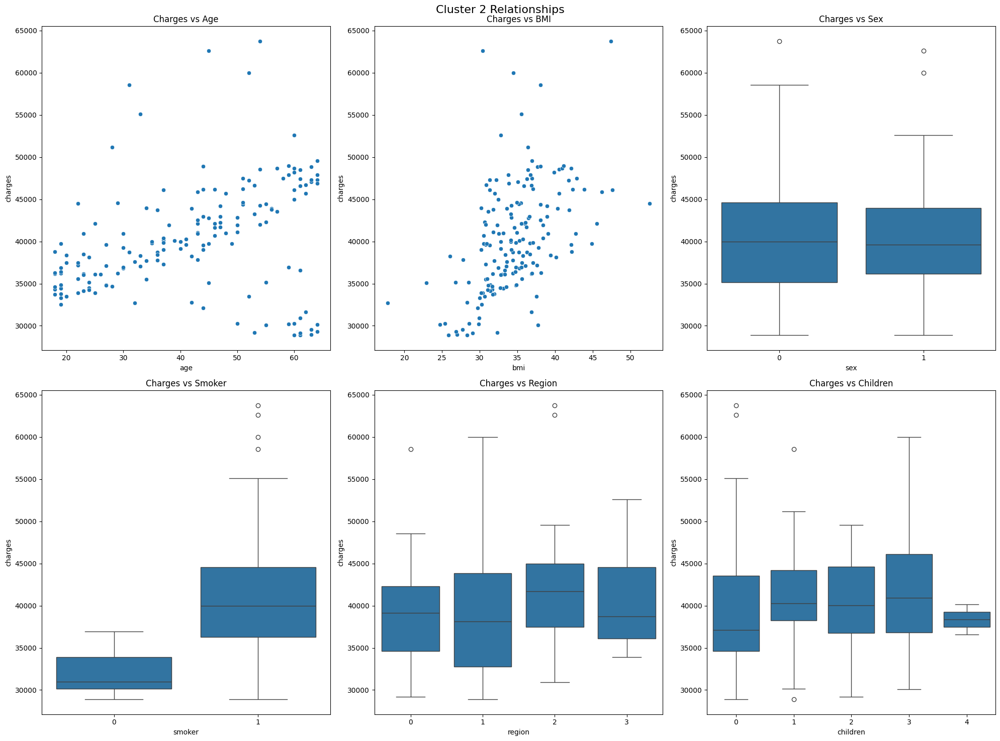

Cluster 0 size: 803
Cluster 1 size: 366
Cluster 2 size: 169


In [ ]:

# Function to create subplots for each cluster
def plot_cluster_subplots(cluster_data, cluster_num):
    fig, axs = plt.subplots(2, 3, figsize=(20, 15))
    fig.suptitle(f'Cluster {cluster_num} Relationships', fontsize=16)

    # Charges vs Age
    sns.scatterplot(x='age', y='charges', data=cluster_data, ax=axs[0, 0])
    axs[0, 0].set_title('Charges vs Age')

    # Charges vs BMI
    sns.scatterplot(x='bmi', y='charges', data=cluster_data, ax=axs[0, 1])
    axs[0, 1].set_title('Charges vs BMI')

    # Charges vs Sex
    sns.boxplot(x='sex', y='charges', data=cluster_data, ax=axs[0, 2])
    axs[0, 2].set_title('Charges vs Sex')

    # Charges vs Smoker
    sns.boxplot(x='smoker', y='charges', data=cluster_data, ax=axs[1, 0])
    axs[1, 0].set_title('Charges vs Smoker')

    # Charges vs Region
    sns.boxplot(x='region', y='charges', data=cluster_data, ax=axs[1, 1])
    axs[1, 1].set_title('Charges vs Region')

    # Charges vs Children
    sns.boxplot(x='children', y='charges', data=cluster_data, ax=axs[1, 2])
    axs[1, 2].set_title('Charges vs Children')

    plt.tight_layout()
    plt.show()

# Plot subplots for each cluster
for i in range(3):
    cluster_data = clustered_data[clustered_data['cluster'] == i]
    plot_cluster_subplots(cluster_data, i)

# Print cluster sizes
for i in range(3):
    print(f"Cluster {i} size:", len(clustered_data[clustered_data['cluster'] == i]))

Traditional Regression

In [ ]:
data.head()

,age,sex,bmi,children,smoker,region,charges,log_charges,age_group,cluster
0,19,female,27.900,0,yes,southwest,16884.92400,9.734176,18-24,1
1,18,male,33.770,1,no,southeast,1725.55230,7.453302,18-24,0
2,28,male,33.000,3,no,southeast,4449.46200,8.400538,25-34,0
3,33,male,22.705,0,no,northwest,21984.47061,9.998092,25-34,1
4,32,male,28.880,0,no,northwest,3866.85520,8.260197,25-34,0


In [ ]:
data_encoded.head()

,age,sex,bmi,children,smoker,charges,region_northeast,region_northwest,region_southeast,region_southwest
0,19,0,27.900,0,1,16884.92400,0,0,0,1
1,18,1,33.770,1,0,1725.55230,0,0,1,0
2,28,1,33.000,3,0,4449.46200,0,0,1,0
3,33,1,22.705,0,0,21984.47061,0,1,0,0
4,32,1,28.880,0,0,3866.85520,0,1,0,0


In [ ]:
data_numeric.head()

,age,sex,bmi,children,smoker,region,charges
0,19,0,27.900,0,1,3,16884.92400
1,18,1,33.770,1,0,2,1725.55230
2,28,1,33.000,3,0,2,4449.46200
3,33,1,22.705,0,0,1,21984.47061
4,32,1,28.880,0,0,1,3866.85520


In [ ]:
# Split the data
X = data_numeric[['age', 'bmi', 'sex', 'smoker', 'region', 'children']]
y = data_numeric['charges']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)

# Function to evaluate and print model performance
def evaluate_model(y_true, y_pred, model_name):
    mse = mean_squared_error(y_true, y_pred)
    rmse = np.sqrt(mse)
    r2 = r2_score(y_true, y_pred)
    print(f"{model_name}:")
    print(f"MSE: {mse:.2f}")
    print(f"RMSE: {rmse:.2f}")
    print(f"R2 Score: {r2:.4f}")
    print()

# Function to plot predicted vs actual values
def plot_predictions(y_true, y_pred, model_name):
    plt.figure(figsize=(10, 6))
    plt.scatter(y_true, y_pred, alpha=0.5, label='Predicted vs Actual')
    plt.plot([y_true.min(), y_true.max()], [y_true.min(), y_true.max()], '--r', label='Prediction')
    plt.xlabel('Actual Charges')
    plt.ylabel('Predicted Charges')
    plt.title(f'{model_name} - Predicted vs Actual')
    plt.legend()  # Ensure legend is shown with labels
    plt.show()

In [ ]:
# Create and fit the model
linear_reg = LinearRegression()
linear_reg.fit(X_train, y_train)

# Predict and evaluate
y_pred_train = linear_reg.predict(X_train)
y_pred_test = linear_reg.predict(X_test)

evaluate_model(y_train, y_pred_train, "Linear Regression (Train)")
evaluate_model(y_test, y_pred_test, "Linear Regression (Test)")

Linear Regression (Train):
MSE: 37011292.58
RMSE: 6083.69
R2 Score: 0.7449

Linear Regression (Test):
MSE: 35174149.33
RMSE: 5930.78
R2 Score: 0.7669



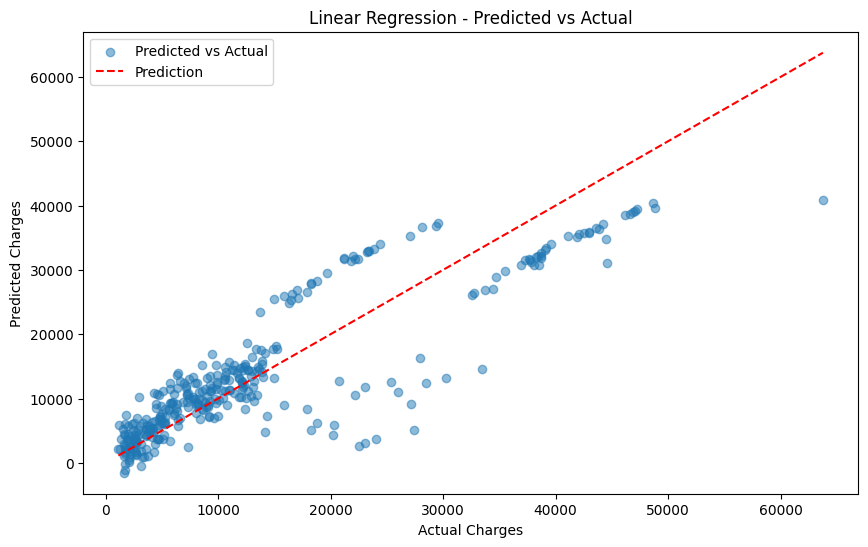

In [ ]:
# Linear Regression
plot_predictions(y_test, linear_reg.predict(X_test), "Linear Regression")

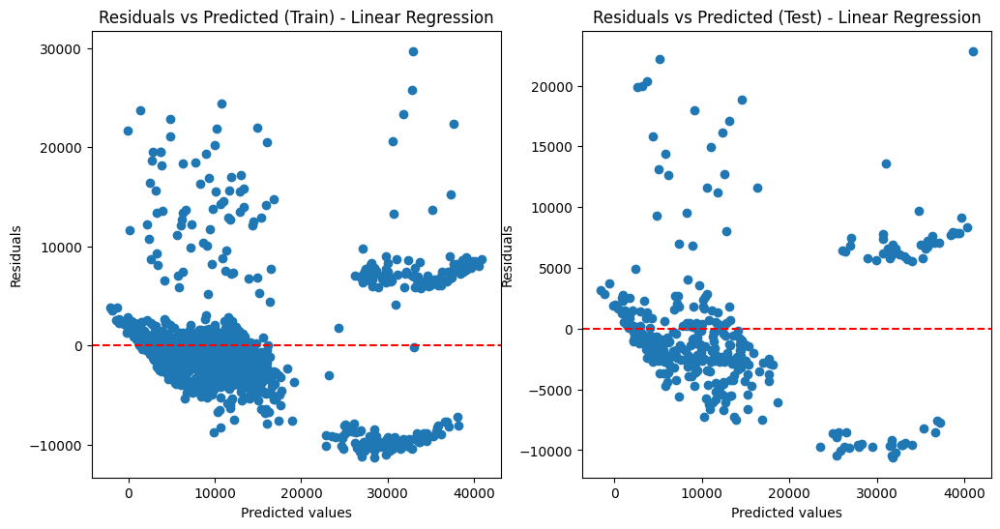

In [ ]:
# Calculate residuals
residuals_train_linear = y_train - y_pred_train
residuals_test_linear = y_test - y_pred_test

# Plot residuals
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.scatter(y_pred_train, residuals_train_linear)
plt.axhline(y=0, color='r', linestyle='--')
plt.title('Residuals vs Predicted (Train) - Linear Regression')
plt.xlabel('Predicted values')
plt.ylabel('Residuals')

plt.subplot(1, 2, 2)
plt.scatter(y_pred_test, residuals_test_linear)
plt.axhline(y=0, color='r', linestyle='--')
plt.title('Residuals vs Predicted (Test) - Linear Regression')
plt.xlabel('Predicted values')
plt.ylabel('Residuals')

plt.show()


In [ ]:
# Transform to polynomial features
poly = PolynomialFeatures(degree=2)
X_train_poly = poly.fit_transform(X_train)
X_test_poly = poly.transform(X_test)

# Create and fit the model
poly_reg = LinearRegression()
poly_reg.fit(X_train_poly, y_train)

# Predict and evaluate
y_pred_train = poly_reg.predict(X_train_poly)
y_pred_test = poly_reg.predict(X_test_poly)

evaluate_model(y_train, y_pred_train, "Polynomial Regression (Train)")
evaluate_model(y_test, y_pred_test, "Polynomial Regression (Test)")

Polynomial Regression (Train):
MSE: 22823747.90
RMSE: 4777.42
R2 Score: 0.8427

Polynomial Regression (Test):
MSE: 21676723.59
RMSE: 4655.83
R2 Score: 0.8563



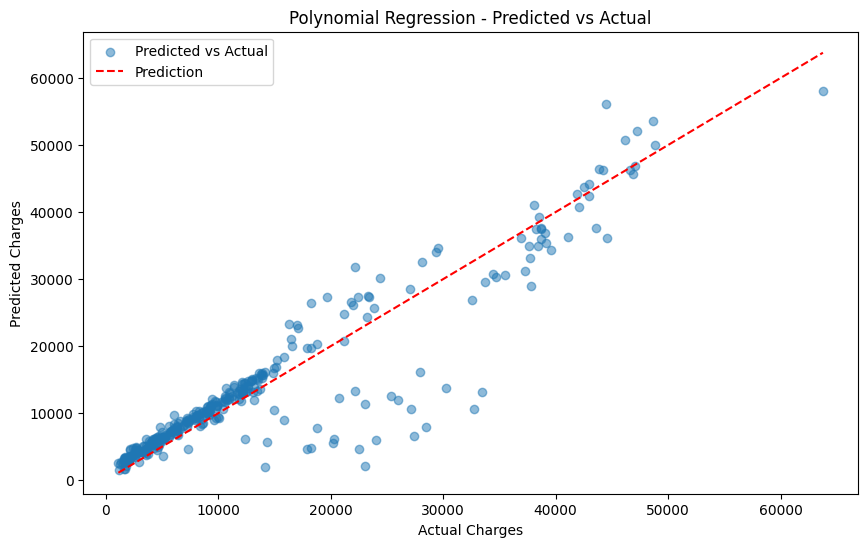

In [ ]:
plot_predictions(y_test, poly_reg.predict(poly.transform(X_test)), "Polynomial Regression")

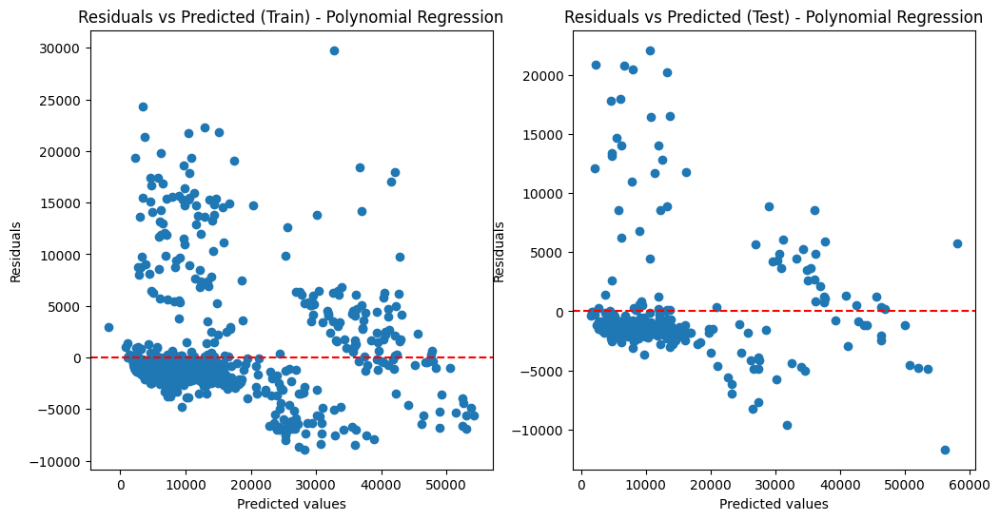

In [ ]:
# Calculate residuals
residuals_train_poly = y_train - y_pred_train
residuals_test_poly = y_test - y_pred_test

# Plot residuals
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.scatter(y_pred_train, residuals_train_poly)
plt.axhline(y=0, color='r', linestyle='--')
plt.title('Residuals vs Predicted (Train) - Polynomial Regression')
plt.xlabel('Predicted values')
plt.ylabel('Residuals')

plt.subplot(1, 2, 2)
plt.scatter(y_pred_test, residuals_test_poly)
plt.axhline(y=0, color='r', linestyle='--')
plt.title('Residuals vs Predicted (Test) - Polynomial Regression')
plt.xlabel('Predicted values')
plt.ylabel('Residuals')

plt.show()


In [ ]:
# Create and fit the model
ridge_reg = Ridge(alpha=1.0)
ridge_reg.fit(X_train, y_train)

# Predict and evaluate
y_pred_train = ridge_reg.predict(X_train)
y_pred_test = ridge_reg.predict(X_test)

evaluate_model(y_train, y_pred_train, "Ridge Regression (Train)")
evaluate_model(y_test, y_pred_test, "Ridge Regression (Test)")

Ridge Regression (Train):
MSE: 37014665.68
RMSE: 6083.97
R2 Score: 0.7449

Ridge Regression (Test):
MSE: 35212846.09
RMSE: 5934.04
R2 Score: 0.7666



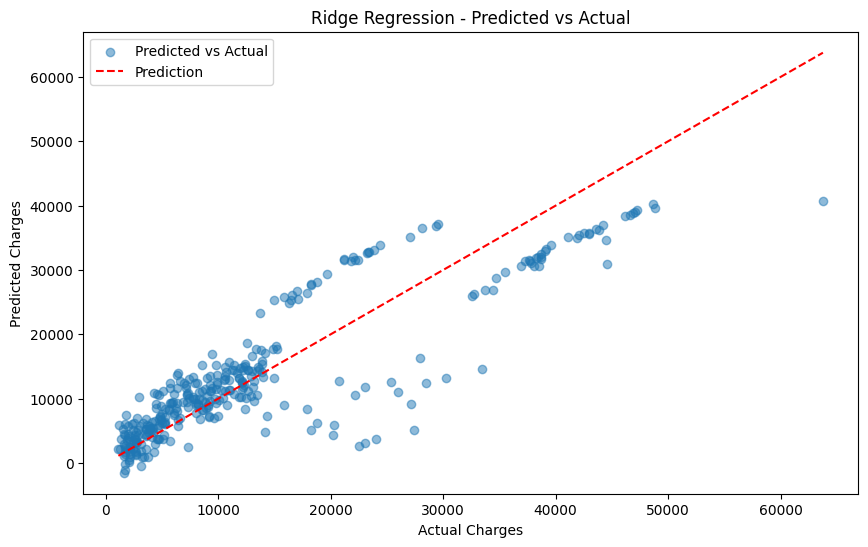

In [ ]:
plot_predictions(y_test, ridge_reg.predict(X_test), "Ridge Regression")


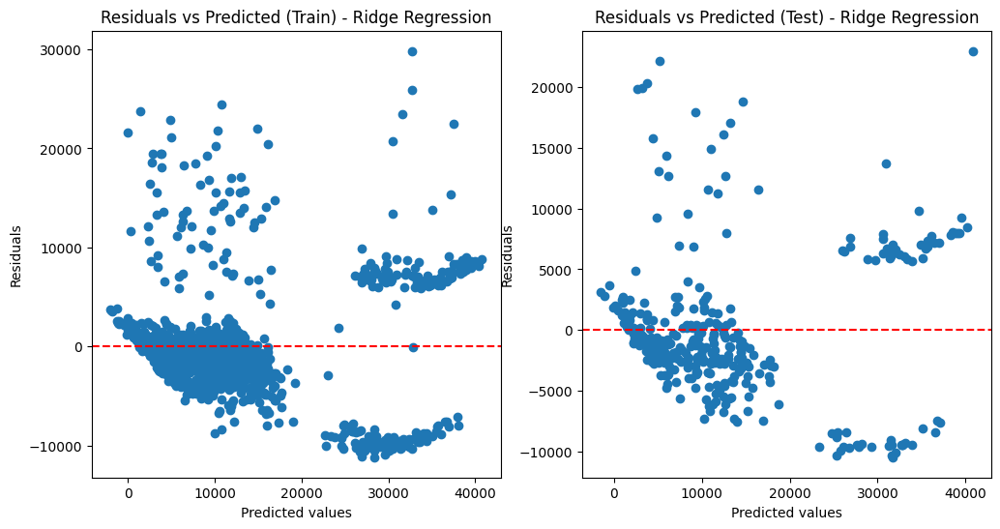

In [ ]:
# Calculate residuals
residuals_train_ridge = y_train - y_pred_train
residuals_test_ridge = y_test - y_pred_test

# Plot residuals
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.scatter(y_pred_train, residuals_train_ridge)
plt.axhline(y=0, color='r', linestyle='--')
plt.title('Residuals vs Predicted (Train) - Ridge Regression')
plt.xlabel('Predicted values')
plt.ylabel('Residuals')

plt.subplot(1, 2, 2)
plt.scatter(y_pred_test, residuals_test_ridge)
plt.axhline(y=0, color='r', linestyle='--')
plt.title('Residuals vs Predicted (Test) - Ridge Regression')
plt.xlabel('Predicted values')
plt.ylabel('Residuals')

plt.show()


In [ ]:
# Create and fit the model
lasso_reg = Lasso(alpha=1.0)
lasso_reg.fit(X_train, y_train)

# Predict and evaluate
y_pred_train = lasso_reg.predict(X_train)
y_pred_test = lasso_reg.predict(X_test)

evaluate_model(y_train, y_pred_train, "Lasso Regression (Train)")
evaluate_model(y_test, y_pred_test, "Lasso Regression (Test)")

Lasso Regression (Train):
MSE: 37011303.50
RMSE: 6083.69
R2 Score: 0.7449

Lasso Regression (Test):
MSE: 35174968.92
RMSE: 5930.85
R2 Score: 0.7669



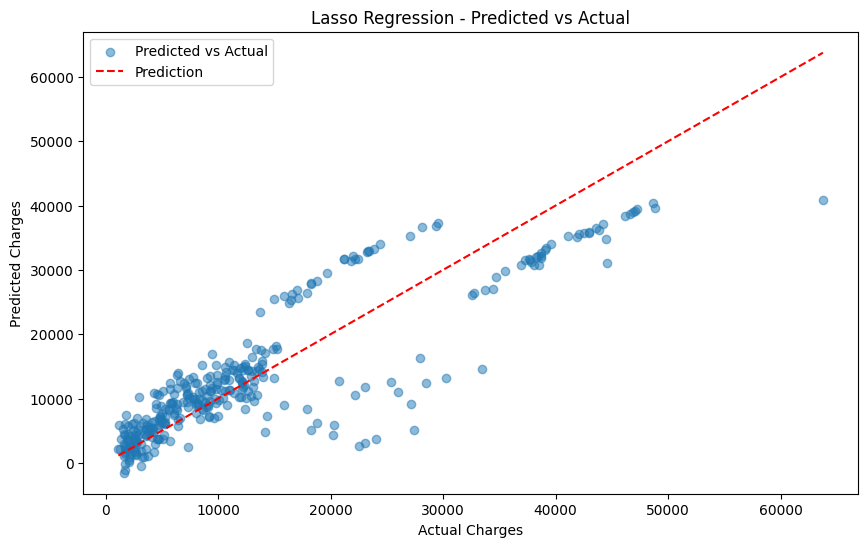

In [ ]:
plot_predictions(y_test, lasso_reg.predict(X_test), "Lasso Regression")


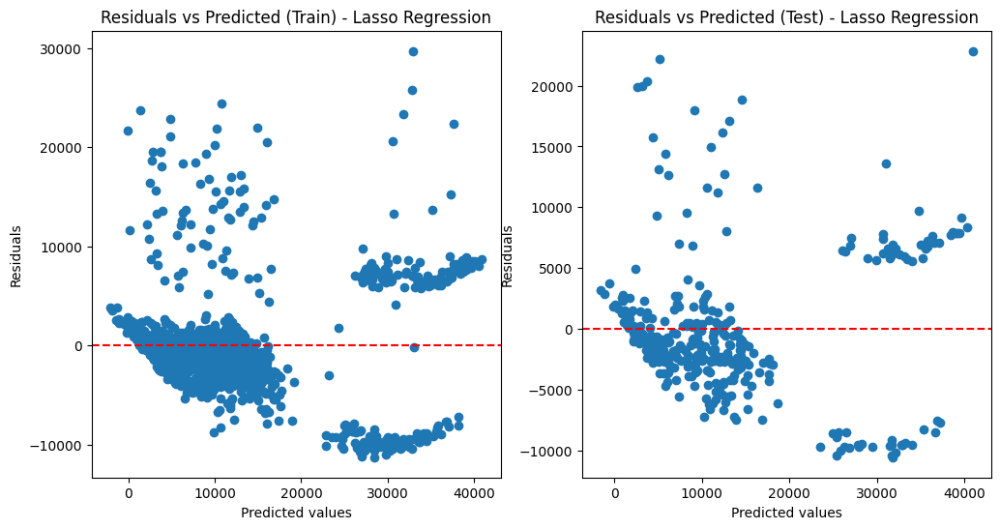

In [ ]:
# Calculate residuals
residuals_train_lasso = y_train - y_pred_train
residuals_test_lasso = y_test - y_pred_test

# Plot residuals
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.scatter(y_pred_train, residuals_train_lasso)
plt.axhline(y=0, color='r', linestyle='--')
plt.title('Residuals vs Predicted (Train) - Lasso Regression')
plt.xlabel('Predicted values')
plt.ylabel('Residuals')

plt.subplot(1, 2, 2)
plt.scatter(y_pred_test, residuals_test_lasso)
plt.axhline(y=0, color='r', linestyle='--')
plt.title('Residuals vs Predicted (Test) - Lasso Regression')
plt.xlabel('Predicted values')
plt.ylabel('Residuals')

plt.show()


Polynomial Regression has the best performance among the models in terms of MSE, RMSE, and R² scores for both training and testing data:

It has the lowest MSE and RMSE values, indicating it has the smallest errors.
It has the highest R² score, indicating it explains the most variance in the target variable.

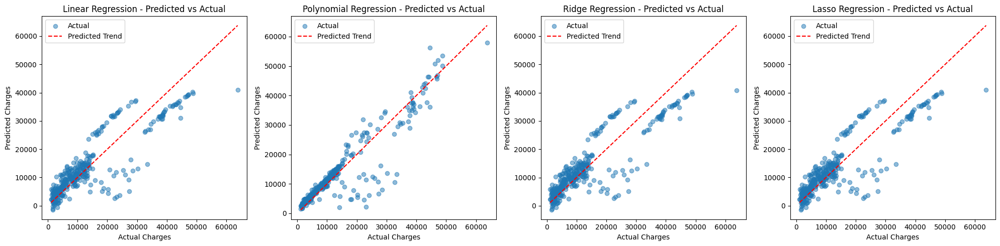

In [ ]:
# Function to plot predicted vs actual values
def plot_predictions(ax, y_true, y_pred, model_name):
    ax.scatter(y_true, y_pred, alpha=0.5, label='Actual')
    ax.plot([y_true.min(), y_true.max()], [y_true.min(), y_true.max()], '--r', label='Predicted Trend')
    ax.set_xlabel('Actual Charges')
    ax.set_ylabel('Predicted Charges')
    ax.set_title(f'{model_name} - Predicted vs Actual')
    ax.legend()

# Create a figure and subplots
fig, axs = plt.subplots(1, 4, figsize=(20, 5))

# Plot for Linear Regression
plot_predictions(axs[0], y_test, linear_reg.predict(X_test), "Linear Regression")

# Plot for Polynomial Regressio
plot_predictions(axs[1], y_test, poly_reg.predict(poly.transform(X_test)), "Polynomial Regression")

# Plot for Ridge Regression
plot_predictions(axs[2], y_test, ridge_reg.predict(X_test), "Ridge Regression")

# Plot for Lasso Regression
plot_predictions(axs[3], y_test, lasso_reg.predict(X_test), "Lasso Regression")

# Adjust layout
plt.tight_layout()
plt.show()

Using hyperparameter tuning

Polynomial Regression (Train):
MSE: 22823747.90
RMSE: 4777.42
R2 Score: 0.8427

Polynomial Regression (Test):
MSE: 21676742.99
RMSE: 4655.83
R2 Score: 0.8563

Best parameters found by GridSearchCV:
{'poly__degree': 2, 'poly__interaction_only': False}


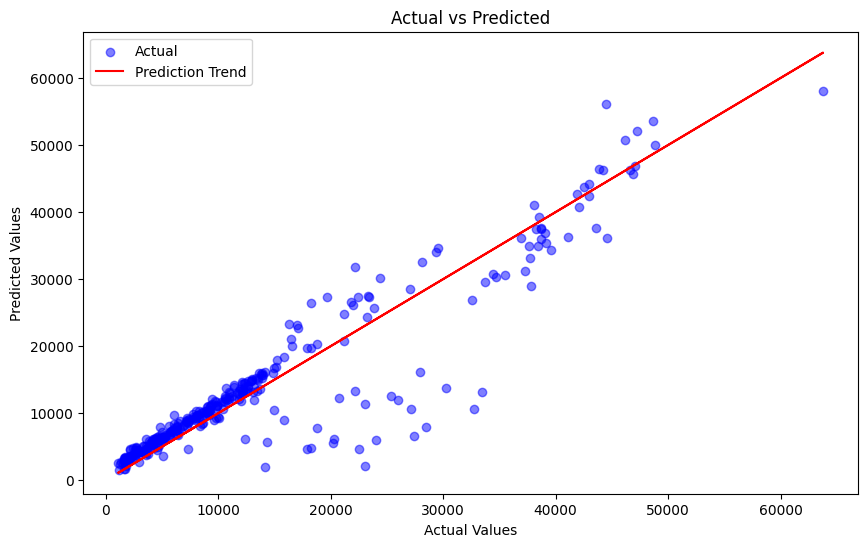

In [ ]:
from sklearn.model_selection import GridSearchCV
# Define the pipeline with PolynomialFeatures and LinearRegression
poly_reg = Pipeline([
    ('scaler', StandardScaler()),  # Optional: Normalize your features if needed
    ('poly', PolynomialFeatures()),  # PolynomialFeatures with default settings
    ('linear_reg', LinearRegression())
])

# Define the parameter grid for GridSearchCV
param_grid = {
    'poly__degree': [2, 3, 4, 5],  # Degrees of polynomial features to try
    'poly__interaction_only': [True, False],  # Whether to include only interaction features
}

# Instantiate GridSearchCV
grid_search = GridSearchCV(estimator=poly_reg, param_grid=param_grid, scoring='neg_mean_squared_error', cv=5)

# Fit GridSearchCV
grid_search.fit(X_train, y_train)

# Get the best model
best_poly_reg = grid_search.best_estimator_

# Predict with best model
y_pred_train = best_poly_reg.predict(X_train)
y_pred_test = best_poly_reg.predict(X_test)

evaluate_model(y_train, y_pred_train, "Polynomial Regression (Train)")
evaluate_model(y_test, y_pred_test, "Polynomial Regression (Test)")

# Print the best parameters found by GridSearchCV
print("Best parameters found by GridSearchCV:")
print(grid_search.best_params_)

# Plotting actual vs predicted values
plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred_test, color='blue', alpha=0.5, label='Actual')
plt.plot(y_test, y_test, color='red', label='Prediction Trend')
plt.title('Actual vs Predicted')
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.legend()
plt.show()

Ridge Regression (Train):
MSE: 37011382.11
RMSE: 6083.70
R2 Score: 0.7449

Ridge Regression (Test):
MSE: 35178920.90
RMSE: 5931.18
R2 Score: 0.7669



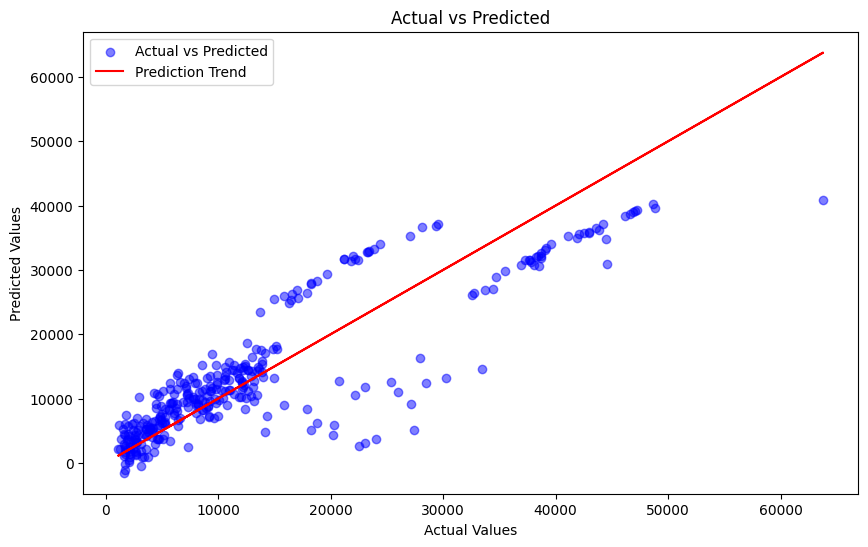

Best parameters found by GridSearchCV:
{'ridge__alpha': 1.0, 'ridge__fit_intercept': True, 'ridge__max_iter': 1000, 'ridge__solver': 'sag'}


In [ ]:
# Define the pipeline with StandardScaler and Ridge regression
ridge_reg = Pipeline([
    ('scaler', StandardScaler()),
    ('ridge', Ridge())
])

# Define the parameter grid for GridSearchCV
param_grid = {
    'ridge__alpha': [0.001, 0.01, 0.1, 1.0, 10.0],  # Regularization strength
    'ridge__fit_intercept': [True, False],  # Whether to fit intercept
    'ridge__solver': ['auto', 'svd', 'cholesky', 'lsqr', 'sparse_cg', 'sag', 'saga'],  # Solver type
    'ridge__max_iter': [None, 100, 1000, 10000],  # Maximum number of iterations
}

# Instantiate GridSearchCV
grid_search = GridSearchCV(estimator=ridge_reg, param_grid=param_grid, scoring='neg_mean_squared_error', cv=5)

# Fit GridSearchCV
grid_search.fit(X_train, y_train)

# Get the best model
best_ridge_reg = grid_search.best_estimator_

# Predict with best model
y_pred_train = best_ridge_reg.predict(X_train)
y_pred_test = best_ridge_reg.predict(X_test)

# Evaluate best model
def evaluate_model(y_true, y_pred, model_name):
    mse = mean_squared_error(y_true, y_pred)
    rmse = np.sqrt(mse)
    r2 = r2_score(y_true, y_pred)
    print(f"{model_name}:")
    print(f"MSE: {mse:.2f}")
    print(f"RMSE: {rmse:.2f}")
    print(f"R2 Score: {r2:.4f}")
    print()

evaluate_model(y_train, y_pred_train, "Ridge Regression (Train)")
evaluate_model(y_test, y_pred_test, "Ridge Regression (Test)")

# Plotting actual vs predicted values
plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred_test, color='blue', alpha=0.5, label='Actual vs Predicted')
plt.plot(y_test, y_test, color='red', label='Prediction Trend')
plt.title('Actual vs Predicted')
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.legend()
plt.show()

# Print the best parameters found by GridSearchCV
print("Best parameters found by GridSearchCV:")
print(grid_search.best_params_)

Lasso Regression (Train):
MSE: 37011877.18
RMSE: 6083.74
R2 Score: 0.7449

Lasso Regression (Test):
MSE: 35177631.13
RMSE: 5931.07
R2 Score: 0.7669



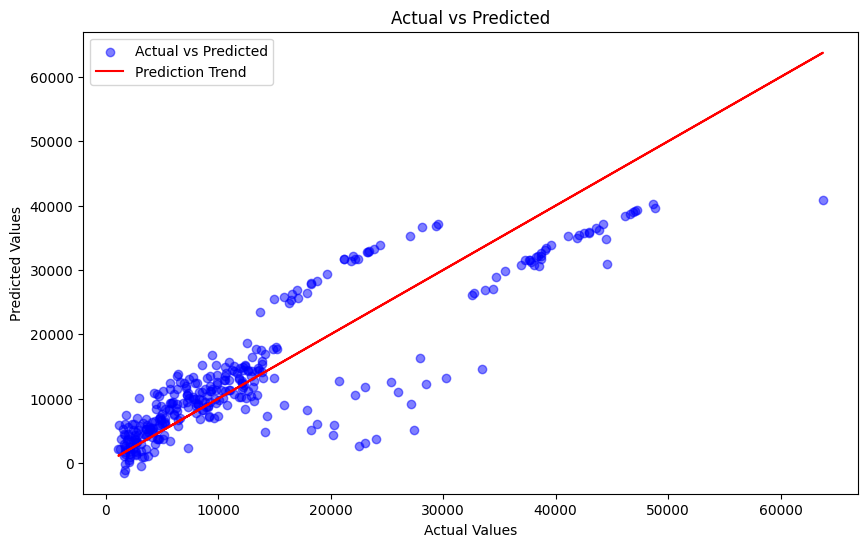

Best parameters found by GridSearchCV:
{'lasso__alpha': 10.0, 'lasso__fit_intercept': True, 'lasso__max_iter': 1000, 'lasso__selection': 'random'}


In [ ]:
# Define the pipeline with StandardScaler and Lasso regression
lasso_reg = Pipeline([
    ('scaler', StandardScaler()),
    ('lasso', Lasso())
])

# Define the parameter grid for GridSearchCV
param_grid = {
    'lasso__alpha': [0.001, 0.01, 0.1, 1.0, 10.0],  # Regularization strength
    'lasso__fit_intercept': [True, False],  # Whether to fit intercept
    'lasso__max_iter': [1000, 2000, 3000],  # Maximum number of iterations
    'lasso__selection': ['cyclic', 'random'],  # Method used to select features
}

# Instantiate GridSearchCV
grid_search = GridSearchCV(estimator=lasso_reg, param_grid=param_grid, scoring='neg_mean_squared_error', cv=5)

# Fit GridSearchCV
grid_search.fit(X_train, y_train)

# Get the best model
best_lasso_reg = grid_search.best_estimator_

# Predict with best model
y_pred_train = best_lasso_reg.predict(X_train)
y_pred_test = best_lasso_reg.predict(X_test)

evaluate_model(y_train, y_pred_train, "Lasso Regression (Train)")
evaluate_model(y_test, y_pred_test, "Lasso Regression (Test)")

# Plotting actual vs predicted values
plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred_test, color='blue', alpha=0.5, label='Actual vs Predicted')
plt.plot(y_test, y_test, color='red', label='Prediction Trend')
plt.title('Actual vs Predicted')
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.legend()
plt.show()

# Print the best parameters found by GridSearchCV
print("Best parameters found by GridSearchCV:")
print(grid_search.best_params_)

From the results, it appears that the metrics (MSE, RMSE, R2 Score) for both training and test sets remain almost identical before and after using GridSearchCV. This suggests that the hyperparameters chosen by GridSearchCV did not significantly alter the model's performance metrics in this particular case.

### Quantile Regression

Quantile Regression Results for Quantile 0.25:
                         QuantReg Regression Results                          
Dep. Variable:                charges   Pseudo R-squared:               0.6019
Model:                       QuantReg   Bandwidth:                       443.3
Method:                 Least Squares   Sparsity:                        1909.
Date:                Thu, 08 Aug 2024   No. Observations:                 1003
Time:                        10:28:46   Df Residuals:                      996
                                        Df Model:                            6
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const      -4679.9889    145.721    -32.116      0.000   -4965.945   -4394.033
age          265.8618      1.361    195.386      0.000     263.192     268.532
bmi           26.7569      4.634      5.774      0.000      17.663      35.851
sex  

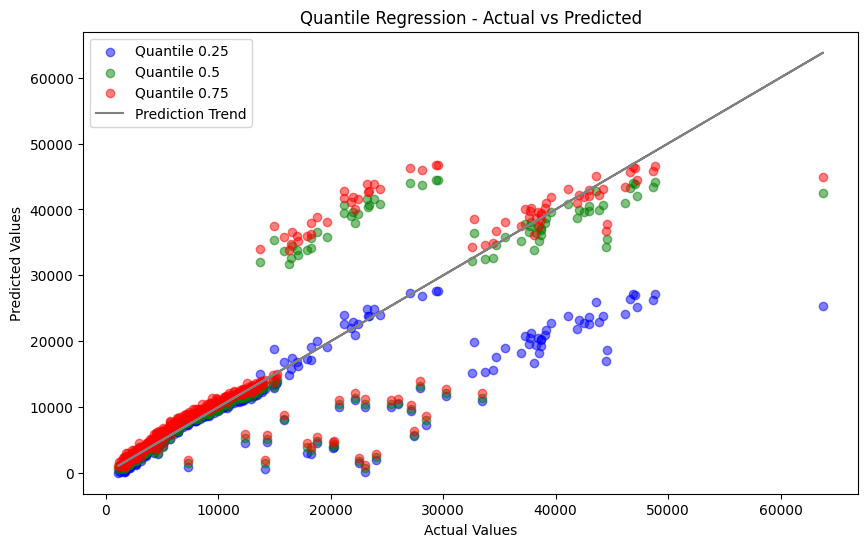

In [ ]:
# Separate predictors (X) and response variable (y)
# Split the data
X = data_numeric[['age', 'bmi', 'sex', 'smoker', 'region', 'children']]
y = data_numeric['charges']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)

# Add constant to X for the intercept term in the model
X_train = sm.add_constant(X_train)
X_test = sm.add_constant(X_test)

# Quantile levels to estimate
quantiles = [0.25, 0.50, 0.75]
max_iter = 10000  # Maximum number of iterations for optimization
# Fit quantile regression models
models = {}
for quantile in quantiles:
    model = sm.QuantReg(y_train, X_train).fit(q=quantile, max_iter=max_iter)
    models[quantile] = model

# Print summary of each model
for quantile, model in models.items():
    print(f"Quantile Regression Results for Quantile {quantile}:")
    print(model.summary())
    print()

# Predictions at different quantiles
quantile_predictions = {}
for quantile, model in models.items():
    y_pred = model.predict(X_test)
    quantile_predictions[quantile] = y_pred

# Plotting actual vs predicted values
plt.figure(figsize=(10, 6))

# Plot each quantile
for quantile, color in zip(quantiles, ['blue', 'green', 'red', 'blue', 'purple']):
    plt.scatter(y_test, quantile_predictions[quantile], color=color, alpha=0.5, label=f'Quantile {quantile}')

plt.plot(y_test, y_test, color='gray', label='Prediction Trend')
plt.title('Quantile Regression - Actual vs Predicted')
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.legend()
plt.show()


Quantile 0.25 (25th percentile):

Pseudo R-squared: 0.6019

Significant Predictors: Age, BMI, Sex, Smoker, Region, Children

Interpretation: Similar significant predictors as quantile 0.1, with slightly different coefficient values indicating their impact on charges at the 25th percentile of the distribution.

Quantile 0.5 (50th percentile - Median):

Pseudo R-squared: 0.5828

Significant Predictors: Age, BMI, Sex, Smoker, Region, Children

Interpretation: Median quantile shows that similar predictors impact charges, but with different coefficient magnitudes compared to lower quantiles, reflecting the middle of the charge distribution.

Quantile 0.75 (75th percentile):

Pseudo R-squared: 0.6465

Significant Predictors: Age, BMI, Sex, Smoker, Region, Children

Interpretation: At the 75th percentile, predictors continue to have significant effects on charges, with higher coefficients for some predictors compared to lower quantiles, indicating a higher charge distribution.

Quantile 0.9 (90th percentile):

Pseudo R-squared: 0.5600

Significant Predictors: Age, BMI, Smoker, Children (Sex and Region are not significant)

Interpretation: At the 90th percentile, age, BMI, smoking status, and number of children remain significant predictors, while sex and region do not significantly affect charges. The model suggests larger coefficients for BMI and smoker status at this higher quantile.

Quantile Regression Results for Quantile 0.1:
                         QuantReg Regression Results                          
Dep. Variable:                charges   Pseudo R-squared:               0.6111
Model:                       QuantReg   Bandwidth:                       461.5
Method:                 Least Squares   Sparsity:                        2084.
Date:                Thu, 08 Aug 2024   No. Observations:                 1003
Time:                        10:28:48   Df Residuals:                      996
                                        Df Model:                            6
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const      -4486.4548    116.877    -38.386      0.000   -4715.809   -4257.100
age          267.9448      0.740    361.963      0.000     266.492     269.397
bmi           10.4891      3.957      2.651      0.008       2.725      18.254
sex   

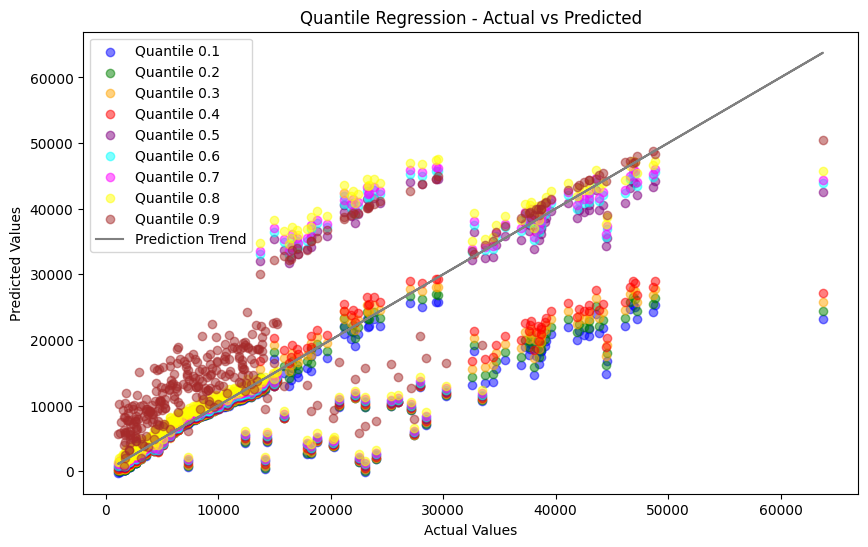

In [ ]:
# Separate predictors (X) and response variable (y)
# Split the data
X = data_numeric[['age', 'bmi', 'sex', 'smoker', 'region', 'children']]
y = data_numeric['charges']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)

# Add constant to X for the intercept term in the model
X_train = sm.add_constant(X_train)
X_test = sm.add_constant(X_test)

# Quantile levels to estimate
quantiles = [0.1, 0.2, 0.3, 0.4, 0.50, 0.6, 0.7, 0.8, 0.9]
max_iter = 10000  # Maximum number of iterations for optimization
# Fit quantile regression models
models = {}
for quantile in quantiles:
    model = sm.QuantReg(y_train, X_train).fit(q=quantile, max_iter=max_iter)
    models[quantile] = model

# Print summary of each model
for quantile, model in models.items():
    print(f"Quantile Regression Results for Quantile {quantile}:")
    print(model.summary())
    print()

# Predictions at different quantiles
quantile_predictions = {}
for quantile, model in models.items():
    y_pred = model.predict(X_test)
    quantile_predictions[quantile] = y_pred

# Plotting actual vs predicted values
plt.figure(figsize=(10, 6))

# Plot each quantile
for quantile, color in zip(quantiles, ['blue', 'green', 'orange', 'red', 'purple', 'cyan', 'magenta', 'yellow', 'brown', 'pink']):
    plt.scatter(y_test, quantile_predictions[quantile], color=color, alpha=0.5, label=f'Quantile {quantile}')

plt.plot(y_test, y_test, color='gray', label='Prediction Trend')
plt.title('Quantile Regression - Actual vs Predicted')
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.legend()
plt.show()

The pseudo R-squared values range between approximately 0.56 to 0.64 across quantiles, indicating that the models explain a substantial portion of the variability in medical charges.

As quantiles increase (moving from lower to higher percentiles), the coefficients generally increase in magnitude, indicating that the effects of age, BMI, smoking, and number of children on medical charges become more pronounced at higher charges.

Age and BMI: Older age and higher BMI consistently lead to higher medical charges.

Smoking: Smoking is a significant predictor of higher medical charges across all quantiles.

Sex and Region: The impact of sex and region on medical charges varies but generally shows smaller effects compared to age, BMI, and smoking.
Children: Having more children is associated with higher medical charges.

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


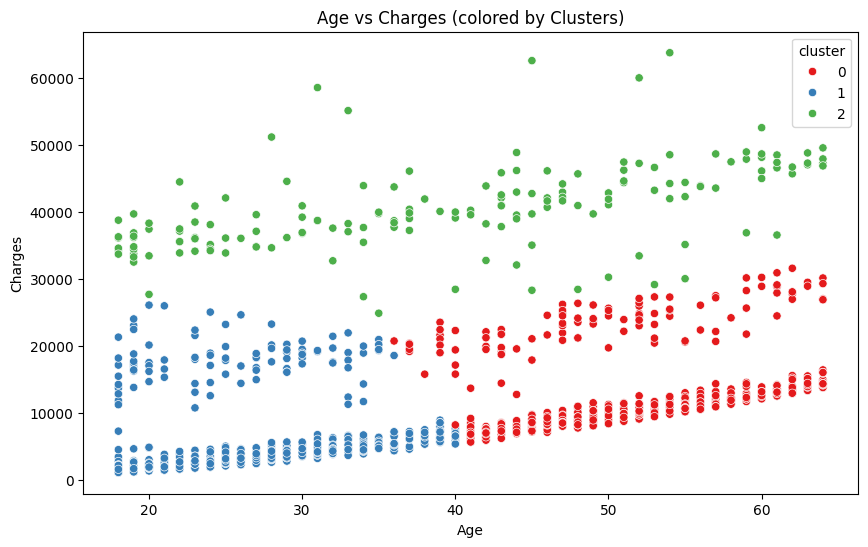

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(


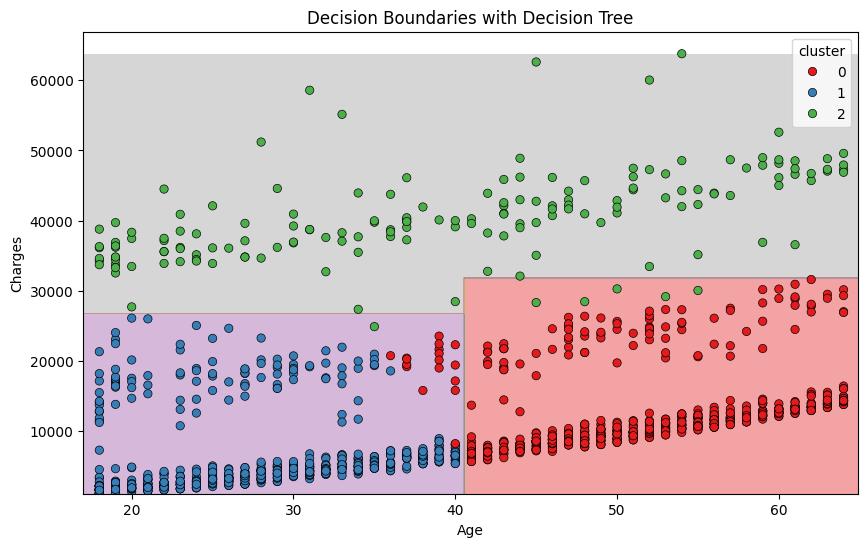

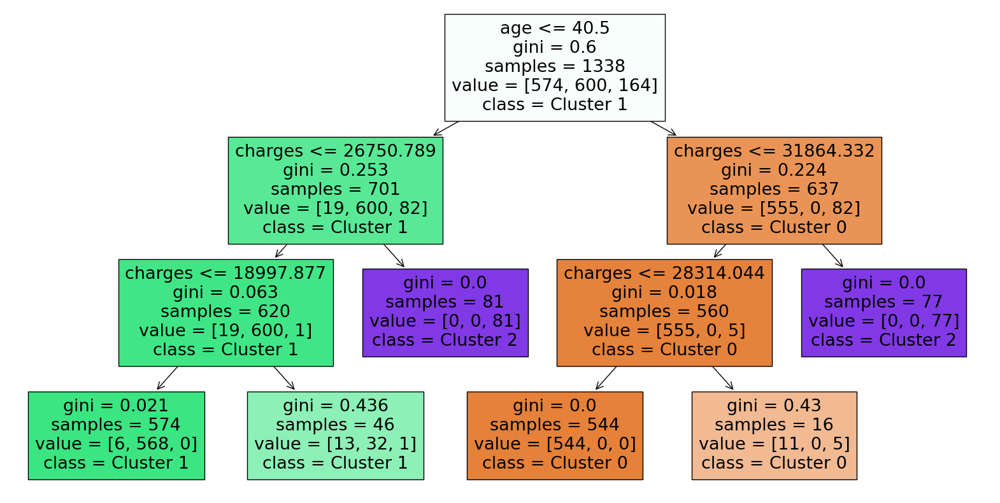

In [ ]:
from sklearn.tree import DecisionTreeClassifier, plot_tree

# Select features for clustering
features = ['age', 'charges']
X = data_numeric[features]

# Standardize the data
scaler = StandardScaler()
scaled_X = scaler.fit_transform(X)

# Apply K-means clustering
kmeans = KMeans(n_clusters=3, random_state=0)
data_numeric['cluster'] = kmeans.fit_predict(scaled_X)

# Plot age vs. charges colored by cluster
plt.figure(figsize=(10, 6))
sns.scatterplot(x='age', y='charges', hue='cluster', palette='Set1', data=data_numeric)
plt.title('Age vs Charges (colored by Clusters)')
plt.xlabel('Age')
plt.ylabel('Charges')
plt.show()

# Train a Decision Tree Classifier
clf = DecisionTreeClassifier(max_depth=3, random_state=0)
clf.fit(X, data_numeric['cluster'])

# Create a mesh grid
x_min, x_max = X['age'].min() - 1, X['age'].max() + 1
y_min, y_max = X['charges'].min() - 1, X['charges'].max() + 1
xx, yy = np.meshgrid(np.arange(x_min, x_max, 0.1),
                     np.arange(y_min, y_max, 100))

# Predict clusters for each point in the mesh grid
Z = clf.predict(np.c_[xx.ravel(), yy.ravel()])
Z = Z.reshape(xx.shape)

# Plot the decision boundaries
plt.figure(figsize=(10, 6))
plt.contourf(xx, yy, Z, alpha=0.4, cmap='Set1')
sns.scatterplot(x='age', y='charges', hue='cluster', data=data_numeric, palette='Set1', edgecolor='k')
plt.title('Decision Boundaries with Decision Tree')
plt.xlabel('Age')
plt.ylabel('Charges')
plt.show()

# Plot the decision tree
plt.figure(figsize=(20,10))
plot_tree(clf, feature_names=features, class_names=['Cluster 0', 'Cluster 1', 'Cluster 2'], filled=True)
plt.show()

well we have observed that there are 3 cluster, also we;ve tried to see if there are another variables helped it to make these clusters

there might be missing variable, these would be in limitations

for regression:
r square method

check the residual after fitting the model
normality assumption
constant variable assumption

For variable selection:
Inference oberservation
cook distance

Refit the Model


If we decide to remove these points, we'll refit the model and compare the results to see if the model's performance improves.

Finding high leverage points and outliers

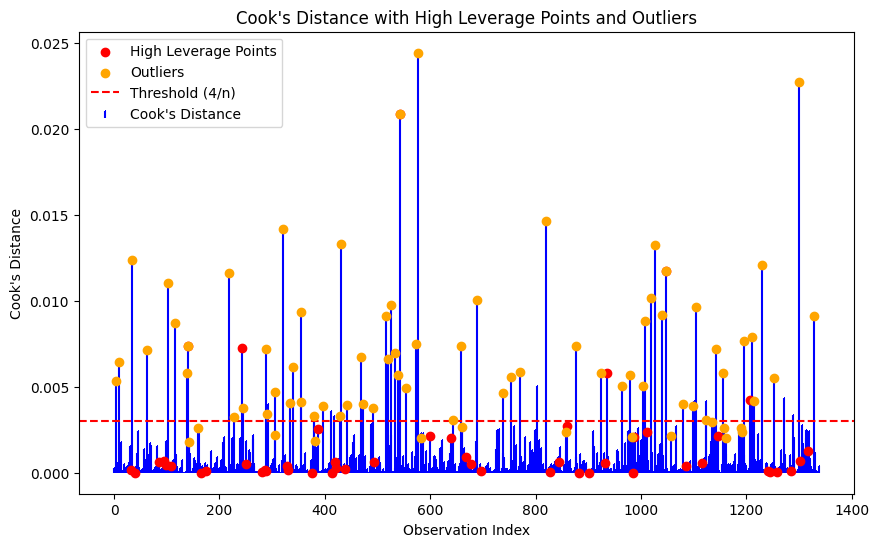

,Index,Leverage,Standardized Residuals,Cook's Distance
0,3,0.004551,3.048754,0.005312
1,9,0.004667,3.313788,0.006436
2,34,0.006686,3.835283,0.012377
3,62,0.005499,3.217910,0.007158
4,102,0.005418,4.027020,0.011043
...,...,...,...,...
64,1215,0.008022,2.029624,0.004164
65,1230,0.010136,3.072245,0.012081
66,1253,0.008399,2.284581,0.005526
67,1300,0.008009,4.741870,0.022693


In [ ]:
target_column = 'charges'
X = data_numeric.drop(columns=[target_column])
y = data_numeric[target_column]

# Add a constant term for the intercept
X = sm.add_constant(X)

# Fit the model
model = sm.OLS(y, X).fit()

# Calculate influence measures
influence = model.get_influence()

# Leverage (hat values)
leverage = influence.hat_matrix_diag

# Standardized residuals
standardized_residuals = influence.resid_studentized_internal #if >3 then standard value, how we defined the outlier, is it absolute value or what

# Cook's distance
cooks_d = influence.cooks_distance[0]

# Identify high leverage points
high_leverage_threshold = 2 * (X.shape[1] / X.shape[0])  # Common threshold
high_leverage_points = np.where(leverage > high_leverage_threshold)[0]

# Identify outliers
outlier_threshold = 2  # Common threshold for standardized residuals
outliers = np.where(np.abs(standardized_residuals) > outlier_threshold)[0]

# Combine influential points, high leverage points, and outliers
combined_indices = np.unique(np.concatenate((high_leverage_points, outliers)))

# Identify points with high Cook's distance
cooks_d_threshold = 4 / len(X)
high_cooks_d_points = np.where(cooks_d > cooks_d_threshold)[0]

# Combine influential points that are also high leverage points or outliers above Cook's distance threshold
combined_indices = np.unique(np.concatenate((
    np.intersect1d(high_leverage_points, high_cooks_d_points),
    np.intersect1d(outliers, high_cooks_d_points)
)))

# Plot Cook's distance
plt.figure(figsize=(10, 6))
plt.stem(np.arange(len(cooks_d)), cooks_d, markerfmt=",", linefmt='b-', basefmt=' ', label='Cook\'s Distance')

# Highlight high leverage points
plt.scatter(high_leverage_points, cooks_d[high_leverage_points], color='red', label='High Leverage Points', zorder=3)

# Highlight outliers
plt.scatter(outliers, cooks_d[outliers], color='orange', label='Outliers', zorder=3)

plt.title("Cook's Distance with High Leverage Points and Outliers")
plt.xlabel("Observation Index")
plt.ylabel("Cook's Distance")
plt.axhline(y=4 / len(X), color='r', linestyle='--', label='Threshold (4/n)')
plt.legend()
plt.show()

# Display influential points summary
influential_points_summary = pd.DataFrame({
    'Index': combined_indices,
    'Leverage': leverage[combined_indices],
    'Standardized Residuals': standardized_residuals[combined_indices],
    'Cook\'s Distance': cooks_d[combined_indices]
})

influential_points_summary

Linear Regression (Train) - Original - Mean Squared Error: 23297917.1715, R2 Score: 0.8386
Linear Regression (Test) - Original - Mean Squared Error: 20574268.2209, R2 Score: 0.8675


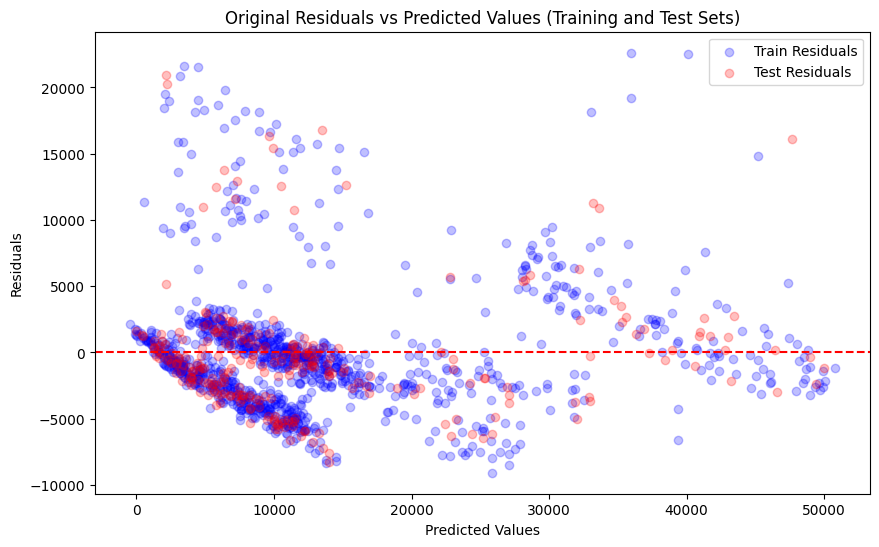

In [ ]:
# Split the cleaned data into training and testing sets
X_train_wo, X_test_wo, y_train_wo, y_test_wo = train_test_split(X, y, test_size=0.2, random_state=42)

# Fit the model again
linear_reg_wo = LinearRegression()
linear_reg_wo.fit(X_train_wo, y_train_wo)

# Predict and evaluate
y_pred_train_wo = linear_reg_wo.predict(X_train_wo)
y_pred_test_wo = linear_reg_wo.predict(X_test_wo)

# Define the evaluate_model function to calculate evaluation metrics
def evaluate_model(y_true, y_pred, model_name):
    from sklearn.metrics import mean_squared_error, r2_score
    mse = mean_squared_error(y_true, y_pred)
    r2 = r2_score(y_true, y_pred)
    print(f'{model_name} - Mean Squared Error: {mse:.4f}, R2 Score: {r2:.4f}')

evaluate_model(y_train_wo, y_pred_train_wo, "Linear Regression (Train) - Original")
evaluate_model(y_test_wo, y_pred_test_wo, "Linear Regression (Test) - Original")

# Calculate residuals for the training set
residuals_train_wo = y_train_wo - y_pred_train_wo

# Calculate residuals for the test set
residuals_test_wo = y_test_wo - y_pred_test_wo

# Plot residuals for the training and test sets together
plt.figure(figsize=(10, 6))
plt.scatter(y_pred_train_wo, residuals_train_wo, color='blue', alpha=0.25, label='Train Residuals')
plt.scatter(y_pred_test_wo, residuals_test_wo, color='red', alpha=0.25, label='Test Residuals')
plt.axhline(y=0, color='red', linestyle='--')
plt.xlabel('Predicted Values')
plt.ylabel('Residuals')
plt.title('Original Residuals vs Predicted Values (Training and Test Sets)')
plt.legend()
plt.show()

remving

In [ ]:
# Remove high leverage points and outliers from the dataset
data_cleaned = data_numeric.drop(index=combined_indices)

# Split the cleaned data into features and target
X_cleaned = data_cleaned.drop(columns=[target_column])
y_cleaned = data_cleaned[target_column]

# Add a constant term for the intercept
X_cleaned = sm.add_constant(X_cleaned)

# Split the cleaned data into training and testing sets
X_train_cleaned, X_test_cleaned, y_train_cleaned, y_test_cleaned = train_test_split(X_cleaned, y_cleaned, test_size=0.2, random_state=42)

# Fit the model again
linear_reg_cleaned = LinearRegression()
linear_reg_cleaned.fit(X_train_cleaned, y_train_cleaned)

# Predict and evaluate
y_pred_train_cleaned = linear_reg_cleaned.predict(X_train_cleaned)
y_pred_test_cleaned = linear_reg_cleaned.predict(X_test_cleaned)

# Define the evaluate_model function to calculate evaluation metrics
def evaluate_model(y_true, y_pred, model_name):
    from sklearn.metrics import mean_squared_error, r2_score
    mse = mean_squared_error(y_true, y_pred)
    r2 = r2_score(y_true, y_pred)
    print(f'{model_name} - Mean Squared Error: {mse:.4f}, R2 Score: {r2:.4f}')

evaluate_model(y_train_cleaned, y_pred_train_cleaned, "Linear Regression (Train) - Cleaned")
evaluate_model(y_test_cleaned, y_pred_test_cleaned, "Linear Regression (Test) - Cleaned")

Linear Regression (Train) - Cleaned - Mean Squared Error: 10288188.6993, R2 Score: 0.9243
Linear Regression (Test) - Cleaned - Mean Squared Error: 9131559.1721, R2 Score: 0.9326


Calculating and visualize the residuals

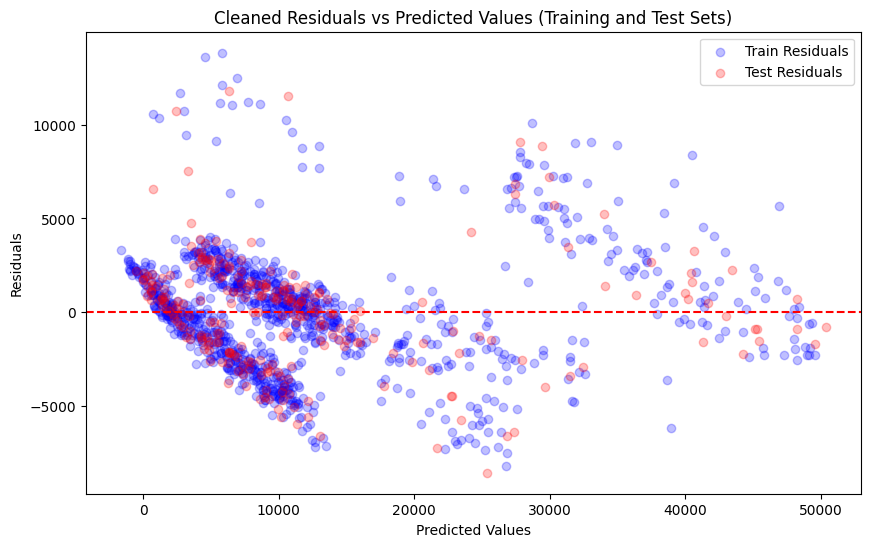

In [ ]:
# Calculate residuals for the training set
residuals_train_cleaned = y_train_cleaned - y_pred_train_cleaned

# Calculate residuals for the test set
residuals_test_cleaned = y_test_cleaned - y_pred_test_cleaned

# Plot residuals for the training and test sets together
plt.figure(figsize=(10, 6))
plt.scatter(y_pred_train_cleaned, residuals_train_cleaned, color='blue', alpha=0.25, label='Train Residuals')
plt.scatter(y_pred_test_cleaned, residuals_test_cleaned, color='red', alpha=0.25, label='Test Residuals')
plt.axhline(y=0, color='red', linestyle='--')
plt.xlabel('Predicted Values')
plt.ylabel('Residuals')
plt.title('Cleaned Residuals vs Predicted Values (Training and Test Sets)')
plt.legend()
plt.show()


XGBoost (Extreme Gradient Boosting)

In [ ]:
# Split the Original data into training and testing sets
X_train_wo, X_test_wo, y_train_wo, y_test_wo = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize the XGBRegressor
xgb_reg = xgb.XGBRegressor(objective='reg:squarederror', n_estimators=100, learning_rate=0.1, max_depth=3, random_state=42)

# Fit the model
xgb_reg.fit(X_train, y_train)

# Predict
y_pred_train = xgb_reg.predict(X_train)
y_pred_test = xgb_reg.predict(X_test)

def evaluate_model(y_true, y_pred, model_name):
    mse = mean_squared_error(y_true, y_pred)
    r2 = r2_score(y_true, y_pred)
    print(f'{model_name} - Mean Squared Error: {mse:.4f}, R2 Score: {r2:.4f}')

evaluate_model(y_train, y_pred_train, "XGBoost Regression (Train)")
evaluate_model(y_test, y_pred_test, "XGBoost Regression (Test)")


XGBoost Regression (Train) - Mean Squared Error: 14854631.6129, R2 Score: 0.8976
XGBoost Regression (Test) - Mean Squared Error: 20214518.9089, R2 Score: 0.8660


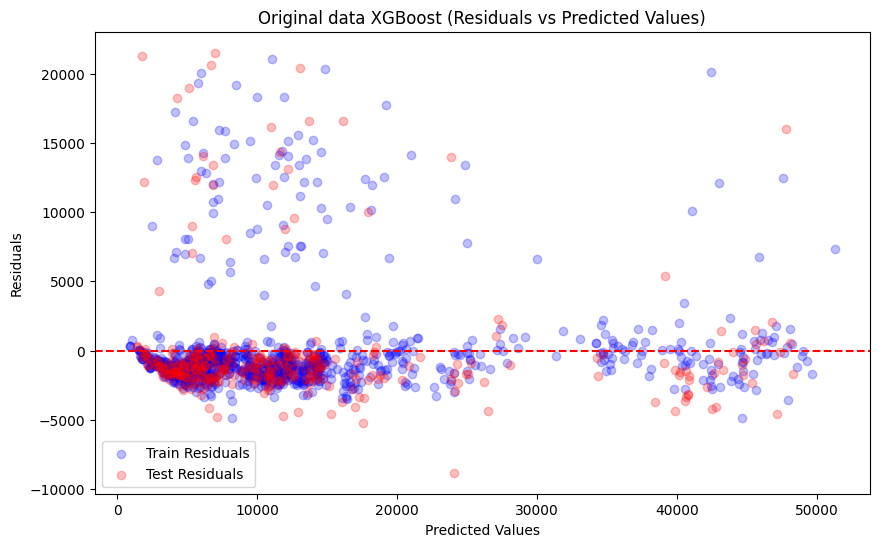

In [ ]:
# Calculate residuals for the training set
residuals_train = y_train - y_pred_train

# Calculate residuals for the test set
residuals_test = y_test - y_pred_test

# Plot residuals for the training and test sets together
plt.figure(figsize=(10, 6))
plt.scatter(y_pred_train, residuals_train, color='blue', alpha=0.25, label='Train Residuals')
plt.scatter(y_pred_test, residuals_test, color='red', alpha=0.25, label='Test Residuals')
plt.axhline(y=0, color='red', linestyle='--')
plt.xlabel('Predicted Values')
plt.ylabel('Residuals')
plt.title('Original data XGBoost (Residuals vs Predicted Values)')
plt.legend()
plt.show()


In [ ]:
# Initialize the XGBRegressor
xgb_reg2 = xgb.XGBRegressor(objective='reg:squarederror', n_estimators=100, learning_rate=0.1, max_depth=3, random_state=42)

# Fit the model
xgb_reg2.fit(X_train_cleaned, y_train_cleaned)

# Predict
y_pred_train_cleaned_xg = xgb_reg2.predict(X_train_cleaned)
y_pred_test_cleaned_xg = xgb_reg2.predict(X_test_cleaned)

def evaluate_model(y_true, y_pred, model_name):
    mse = mean_squared_error(y_true, y_pred)
    r2 = r2_score(y_true, y_pred)
    print(f'{model_name} - Mean Squared Error: {mse:.4f}, R2 Score: {r2:.4f}')

evaluate_model(y_train_cleaned, y_pred_train_cleaned_xg, "XGBoost Regression (Train)")
evaluate_model(y_test_cleaned, y_pred_test_cleaned_xg, "XGBoost Regression (Test)")

XGBoost Regression (Train) - Mean Squared Error: 2394050.7066, R2 Score: 0.9824
XGBoost Regression (Test) - Mean Squared Error: 2356449.5458, R2 Score: 0.9826


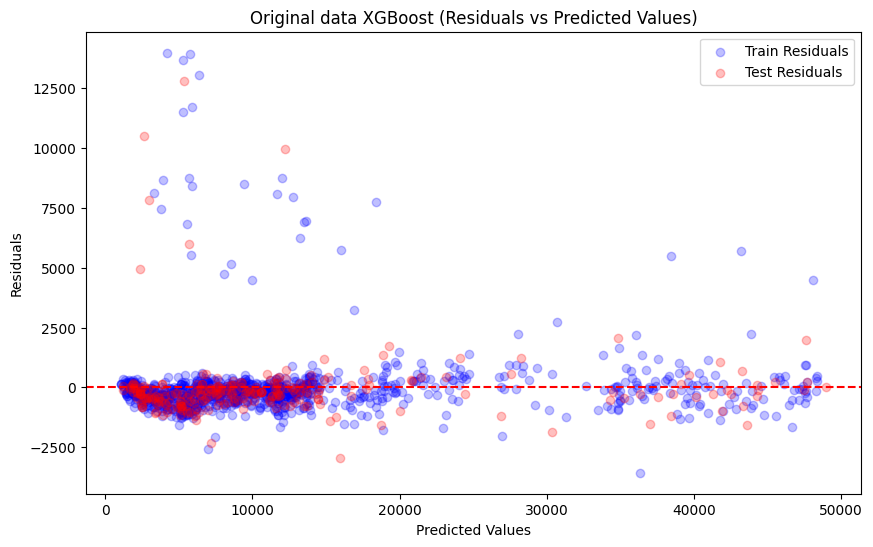

In [ ]:
# Calculate residuals for the training set
residuals_train_xg = y_train_cleaned - y_pred_train_cleaned_xg

# Calculate residuals for the test set
residuals_test_xg = y_test_cleaned - y_pred_test_cleaned_xg

# Plot residuals for the training and test sets together
plt.figure(figsize=(10, 6))
plt.scatter(y_pred_train_cleaned_xg, residuals_train_xg, color='blue', alpha=0.25, label='Train Residuals')
plt.scatter(y_pred_test_cleaned_xg, residuals_test_xg, color='red', alpha=0.25, label='Test Residuals')
plt.axhline(y=0, color='red', linestyle='--')
plt.xlabel('Predicted Values')
plt.ylabel('Residuals')
plt.title('Original data XGBoost (Residuals vs Predicted Values)')
plt.legend()
plt.show()


In [ ]:
def quantile_regression(q, X_train, y_train, X_test, y_test, max_iter=10000):
    # Fit the model with increased maximum iterations
    mod = sm.QuantReg(y_train, X_train)
    res = mod.fit(q=q, max_iter=max_iter)

    # Predict
    y_pred_train = res.predict(X_train)
    y_pred_test = res.predict(X_test)

    # Evaluate
    mse_train = mean_squared_error(y_train, y_pred_train)
    mse_test = mean_squared_error(y_test, y_pred_test)
    r2_train = r2_score(y_train, y_pred_train)
    r2_test = r2_score(y_test, y_pred_test)

    print(f'Quantile {q} - Train MSE: {mse_train:.4f}, R2: {r2_train:.4f}')
    print(f'Quantile {q} - Test MSE: {mse_test:.4f}, R2: {r2_test:.4f}')

    return res, y_pred_train, y_pred_test

In [ ]:
quantiles = [0.25, 0.5, 0.75]
results = {}

for q in quantiles:
    res, y_pred_train_quant, y_pred_test_quant = quantile_regression(q, X_train_wo, y_train_wo, X_test_wo, y_test_wo)
    results[q] = (res, y_pred_train_quant, y_pred_test_quant)

Quantile 0.25 - Train MSE: 55614471.0803, R2: 0.6147
Quantile 0.25 - Test MSE: 52847507.4206, R2: 0.6596
Quantile 0.5 - Train MSE: 24485508.5795, R2: 0.8304
Quantile 0.5 - Test MSE: 20997332.6402, R2: 0.8648
Quantile 0.75 - Train MSE: 34672642.4124, R2: 0.7598
Quantile 0.75 - Test MSE: 30254274.3200, R2: 0.8051


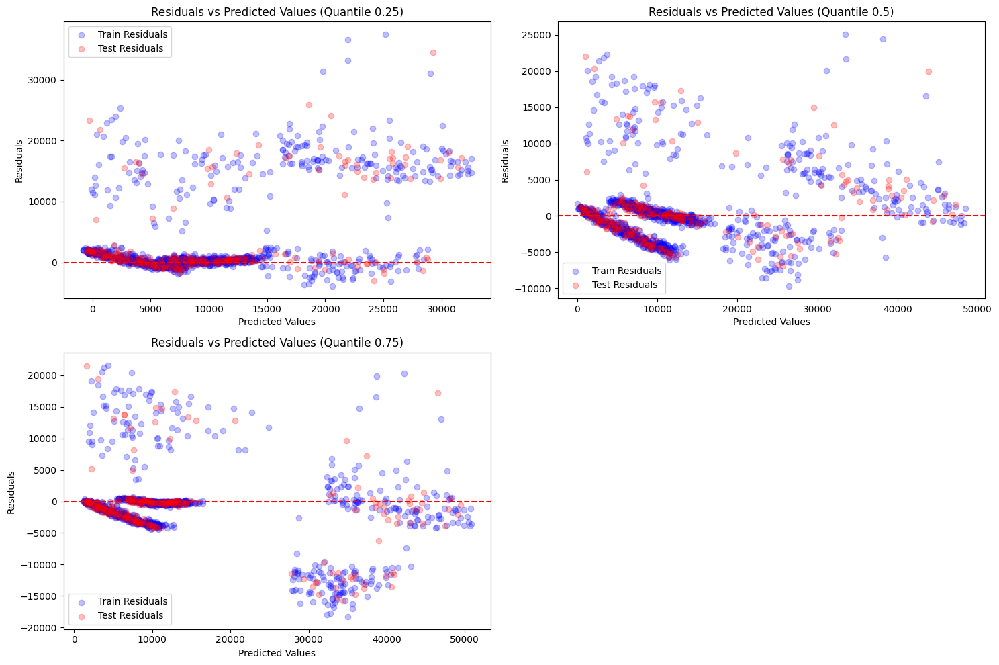

In [ ]:
plt.figure(figsize=(15, 10))

for i, q in enumerate(quantiles):
    res, y_pred_train_quant, y_pred_test_quant = results[q]

    # Calculate residuals for the training set
    residuals_train_quant = y_train_wo - y_pred_train_quant

    # Calculate residuals for the test set
    residuals_test_quant = y_test_wo - y_pred_test_quant

    # Plot residuals for the training and test sets together
    plt.subplot(2, 2, i+1)
    plt.scatter(y_pred_train_quant, residuals_train_quant, color='blue', alpha=0.25, label='Train Residuals')
    plt.scatter(y_pred_test_quant, residuals_test_quant, color='red', alpha=0.25, label='Test Residuals')
    plt.axhline(y=0, color='red', linestyle='--')
    plt.xlabel('Predicted Values')
    plt.ylabel('Residuals')
    plt.title(f'Residuals vs Predicted Values (Quantile {q})')
    plt.legend()

plt.tight_layout()
plt.show()


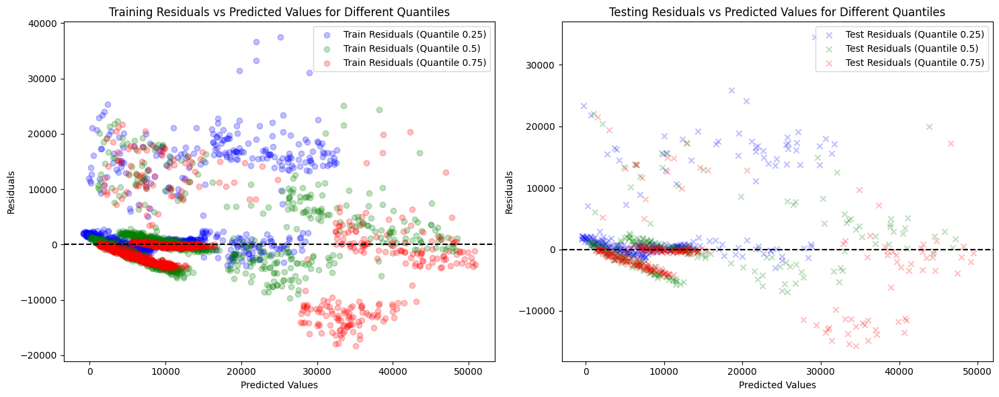

In [ ]:
# Plot residuals for each quantile in separate subplots for training and testing data
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))

colors = ['blue', 'green', 'red']
labels = ['Quantile 0.25', 'Quantile 0.5', 'Quantile 0.75']

for i, q in enumerate(quantiles):
    res, y_pred_train_quant, y_pred_test_quant = results[q]

    # Calculate residuals for the training set
    residuals_train_quant = y_train_wo - y_pred_train_quant

    # Calculate residuals for the test set
    residuals_test_quant = y_test_wo - y_pred_test_quant

    # Plot residuals for the training set
    ax1.scatter(y_pred_train_quant, residuals_train_quant, color=colors[i], alpha=0.25, label=f'Train Residuals ({labels[i]})')

    # Plot residuals for the test set
    ax2.scatter(y_pred_test_quant, residuals_test_quant, color=colors[i], alpha=0.25, label=f'Test Residuals ({labels[i]})', marker='x')

# Customize the training residuals plot
ax1.axhline(y=0, color='black', linestyle='--')
ax1.set_xlabel('Predicted Values')
ax1.set_ylabel('Residuals')
ax1.set_title('Training Residuals vs Predicted Values for Different Quantiles')
ax1.legend()

# Customize the testing residuals plot
ax2.axhline(y=0, color='black', linestyle='--')
ax2.set_xlabel('Predicted Values')
ax2.set_ylabel('Residuals')
ax2.set_title('Testing Residuals vs Predicted Values for Different Quantiles')
ax2.legend()

plt.tight_layout()
plt.show()

For cleaned data

In [ ]:
quantiles = [0.25, 0.5, 0.75]
results = {}

for q in quantiles:
    res, y_pred_train_cq, y_pred_test_cq = quantile_regression(q, X_train_cleaned, y_train_cleaned, X_test_cleaned, y_test_cleaned)
    results[q] = (res, y_pred_train_cq, y_pred_test_cq)

Quantile 0.25 - Train MSE: 38378566.6108, R2: 0.7174
Quantile 0.25 - Test MSE: 34976433.4764, R2: 0.7420
Quantile 0.5 - Train MSE: 11067281.3736, R2: 0.9185
Quantile 0.5 - Test MSE: 9406477.5755, R2: 0.9306
Quantile 0.75 - Train MSE: 23862719.3191, R2: 0.8243
Quantile 0.75 - Test MSE: 20260792.6142, R2: 0.8505


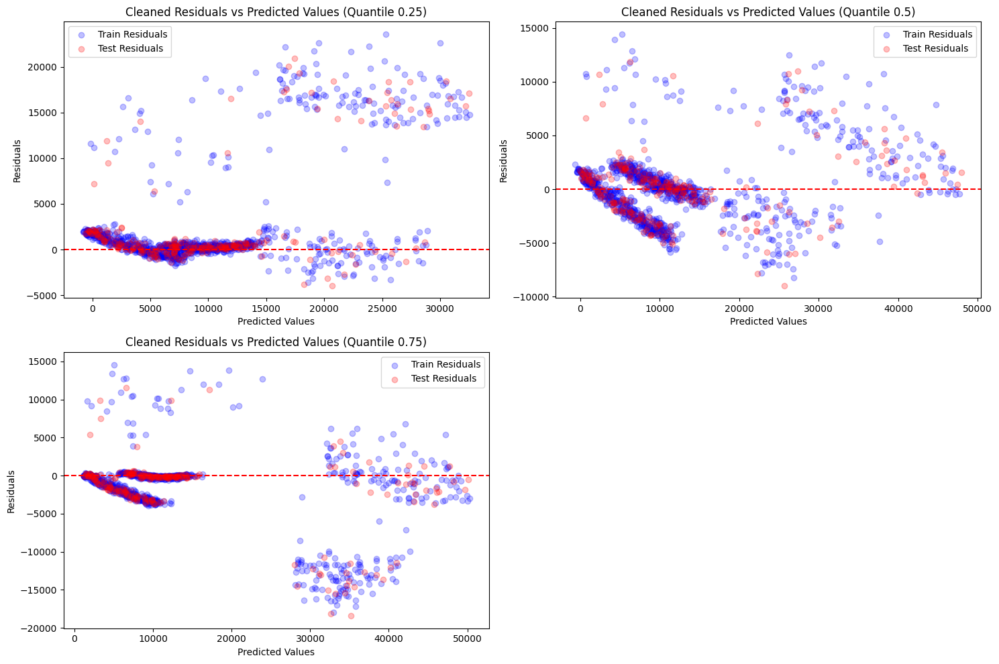

In [ ]:
plt.figure(figsize=(15, 10))

for i, q in enumerate(quantiles):
    res, y_pred_train_cq, y_pred_test_cq = results[q]

    # Calculate residuals for the training set
    residuals_train_cq = y_train_cleaned - y_pred_train_cq

    # Calculate residuals for the test set
    residuals_test_cq = y_test_cleaned - y_pred_test_cq

    # Plot residuals for the training and test sets together
    plt.subplot(2, 2, i+1)
    plt.scatter(y_pred_train_cq, residuals_train_cq, color='blue', alpha=0.25, label='Train Residuals')
    plt.scatter(y_pred_test_cq, residuals_test_cq, color='red', alpha=0.25, label='Test Residuals')
    plt.axhline(y=0, color='red', linestyle='--')
    plt.xlabel('Predicted Values')
    plt.ylabel('Residuals')
    plt.title(f'Cleaned Residuals vs Predicted Values (Quantile {q})')
    plt.legend()

plt.tight_layout()
plt.show()


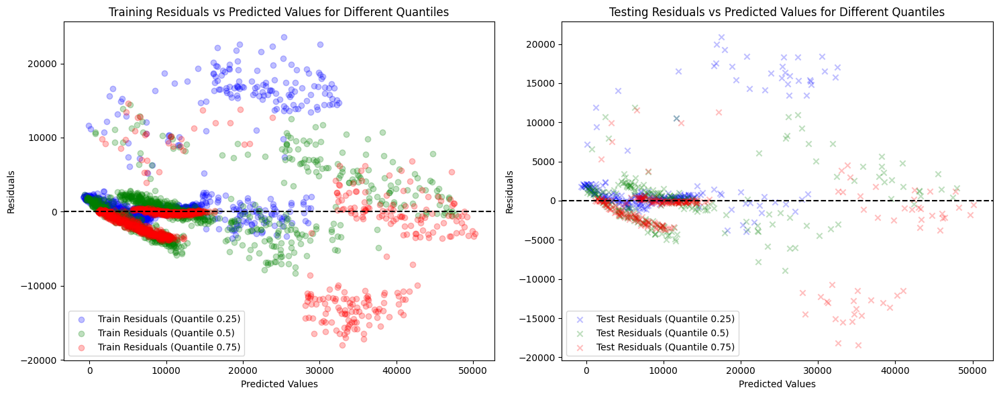

In [ ]:
# Plot residuals for each quantile in separate subplots for training and testing data
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))

colors = ['blue', 'green', 'red']
labels = ['Quantile 0.25', 'Quantile 0.5', 'Quantile 0.75']

for i, q in enumerate(quantiles):
    res, y_pred_train_cq, y_pred_test_cq = results[q]

    # Calculate residuals for the training set
    residuals_train_cq = y_train_cleaned - y_pred_train_cq

    # Calculate residuals for the test set
    residuals_test_cq= y_test_cleaned - y_pred_test_cq

    # Plot residuals for the training set
    ax1.scatter(y_pred_train_cq, residuals_train_cq, color=colors[i], alpha=0.25, label=f'Train Residuals ({labels[i]})')

    # Plot residuals for the test set
    ax2.scatter(y_pred_test_cq, residuals_test_cq, color=colors[i], alpha=0.25, label=f'Test Residuals ({labels[i]})', marker='x')

# Customize the training residuals plot
ax1.axhline(y=0, color='black', linestyle='--')
ax1.set_xlabel('Predicted Values')
ax1.set_ylabel('Residuals')
ax1.set_title('Training Residuals vs Predicted Values for Different Quantiles')
ax1.legend()

# Customize the testing residuals plot
ax2.axhline(y=0, color='black', linestyle='--')
ax2.set_xlabel('Predicted Values')
ax2.set_ylabel('Residuals')
ax2.set_title('Testing Residuals vs Predicted Values for Different Quantiles')
ax2.legend()

plt.tight_layout()
plt.show()

Using XGBoost (Extreme Gradient Boosting)

In [ ]:


# Define a function to fit and predict using XGBoost for quantile regression
def xgboost_quantile_regression(q, X_train, y_train, X_test, y_test):
    # Custom objective function for quantile regression
    def quantile_obj(y_true, y_pred):
        e = y_true - y_pred
        grad = np.where(e > 0, -q, 1 - q)
        hess = np.ones_like(y_true)
        return grad, hess

    dtrain = xgb.DMatrix(X_train, label=y_train)
    dtest = xgb.DMatrix(X_test, label=y_test)

    params = {
        'eta': 0.1,
        'max_depth': 3,
        'objective': quantile_obj
    }

    num_boost_round = 100
    model = xgb.train(params, dtrain, num_boost_round)

    y_pred_train = model.predict(dtrain)
    y_pred_test = model.predict(dtest)

    # Evaluate
    mse_train = mean_squared_error(y_train, y_pred_train)
    mse_test = mean_squared_error(y_test, y_pred_test)
    r2_train = r2_score(y_train, y_pred_train)
    r2_test = r2_score(y_test, y_pred_test)

    print(f'Quantile {q} - Train MSE: {mse_train:.4f}, R2: {r2_train:.4f}')
    print(f'Quantile {q} - Test MSE: {mse_test:.4f}, R2: {r2_test:.4f}')

    return model, y_pred_train, y_pred_test


In [ ]:
# Define a function for the quantile loss
def quantile_loss(q, y_true, y_pred):
    e = y_true - y_pred
    return np.mean(np.maximum(q * e, (q - 1) * e))

# Define a function to fit and predict using XGBoost for quantile regression
def xgboost_quantile_regression(q, X_train, y_train, X_test, y_test):
    dtrain = xgb.DMatrix(X_train, label=y_train)
    dtest = xgb.DMatrix(X_test, label=y_test)

    params = {
        'eta': 0.1,
        'max_depth': 3,
        'objective': 'reg:absoluteerror',
        'alpha': q
    }

    num_boost_round = 100
    model = xgb.train(params, dtrain, num_boost_round)

    y_pred_train = model.predict(dtrain)
    y_pred_test = model.predict(dtest)

    # Evaluate
    mse_train = mean_squared_error(y_train, y_pred_train)
    mse_test = mean_squared_error(y_test, y_pred_test)
    r2_train = r2_score(y_train, y_pred_train)
    r2_test = r2_score(y_test, y_pred_test)

    print(f'Quantile {q} - Train MSE: {mse_train:.4f}, R2: {r2_train:.4f}')
    print(f'Quantile {q} - Test MSE: {mse_test:.4f}, R2: {r2_test:.4f}')

    return model, y_pred_train, y_pred_test


In [ ]:
# Perform XGBoost quantile regression for 0.25, 0.5, and 0.75 quantiles
quantiles = [0.25, 0.5, 0.75]
results = {}

for q in quantiles:
    model, y_pred_train_quant, y_pred_test_quant = xgboost_quantile_regression(q, X_train_wo, y_train_wo, X_test_wo, y_test_wo)
    results[q] = (model, y_pred_train_quant, y_pred_test_quant)


Quantile 0.25 - Train MSE: 15975575.3047, R2: 0.8893
Quantile 0.25 - Test MSE: 14492562.7661, R2: 0.9066
Quantile 0.5 - Train MSE: 16032100.1949, R2: 0.8889
Quantile 0.5 - Test MSE: 15175601.7705, R2: 0.9022
Quantile 0.75 - Train MSE: 15895139.5736, R2: 0.8899
Quantile 0.75 - Test MSE: 14311042.3992, R2: 0.9078


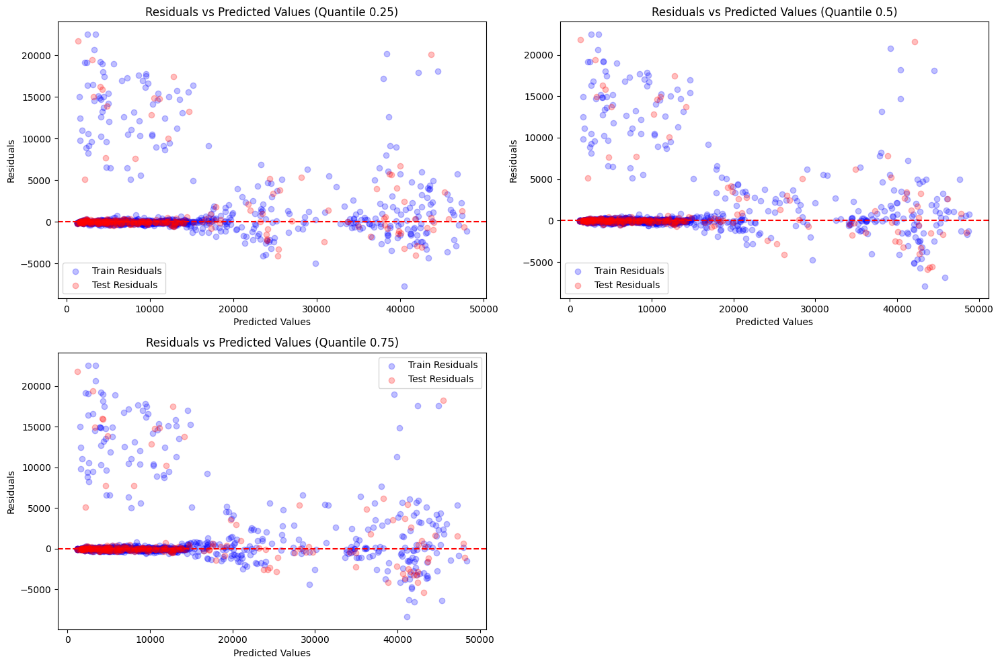

In [ ]:
plt.figure(figsize=(15, 10))

for i, q in enumerate(quantiles):
    res, y_pred_train_qxg, y_pred_test_qxg = results[q]

    # Calculate residuals for the training set
    residuals_train_qxg = y_train_wo - y_pred_train_qxg

    # Calculate residuals for the test set
    residuals_test_qxg = y_test_wo - y_pred_test_qxg

    # Plot residuals for the training and test sets together
    plt.subplot(2, 2, i+1)
    plt.scatter(y_pred_train_qxg, residuals_train_qxg, color='blue', alpha=0.25, label='Train Residuals')
    plt.scatter(y_pred_test_qxg, residuals_test_qxg, color='red', alpha=0.25, label='Test Residuals')
    plt.axhline(y=0, color='red', linestyle='--')
    plt.xlabel('Predicted Values')
    plt.ylabel('Residuals')
    plt.title(f'Residuals vs Predicted Values (Quantile {q})')
    plt.legend()

plt.tight_layout()
plt.show()


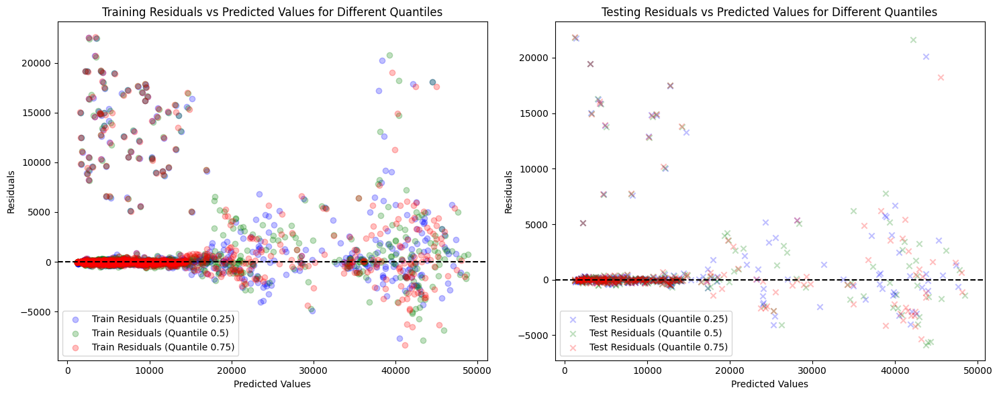

In [ ]:
# Plot residuals for each quantile in separate subplots for training and testing data
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))

colors = ['blue', 'green', 'red']
labels = ['Quantile 0.25', 'Quantile 0.5', 'Quantile 0.75']

for i, q in enumerate(quantiles):
    res, y_pred_train_qxg, y_pred_test_qxg = results[q]

    # Calculate residuals for the training set
    residuals_train_qxg = y_train_wo - y_pred_train_qxg

    # Calculate residuals for the test set
    residuals_test_qxg = y_test_wo - y_pred_test_qxg

    # Plot residuals for the training set
    ax1.scatter(y_pred_train_qxg, residuals_train_qxg, color=colors[i], alpha=0.25, label=f'Train Residuals ({labels[i]})')

    # Plot residuals for the test set
    ax2.scatter(y_pred_test_qxg, residuals_test_qxg, color=colors[i], alpha=0.25, label=f'Test Residuals ({labels[i]})', marker='x')

# Customize the training residuals plot
ax1.axhline(y=0, color='black', linestyle='--')
ax1.set_xlabel('Predicted Values')
ax1.set_ylabel('Residuals')
ax1.set_title('Training Residuals vs Predicted Values for Different Quantiles')
ax1.legend()

# Customize the testing residuals plot
ax2.axhline(y=0, color='black', linestyle='--')
ax2.set_xlabel('Predicted Values')
ax2.set_ylabel('Residuals')
ax2.set_title('Testing Residuals vs Predicted Values for Different Quantiles')
ax2.legend()

plt.tight_layout()
plt.show()

On cleaned data

In [ ]:
# Perform XGBoost quantile regression for 0.25, 0.5, and 0.75 quantiles
quantiles = [0.25, 0.5, 0.75]
results = {}

for q in quantiles:
    model, y_pred_train_qxgc, y_pred_test_qxgc = xgboost_quantile_regression(q, X_train_cleaned, y_train_cleaned, X_test_cleaned, y_test_cleaned)
    results[q] = (model, y_pred_train_qxgc, y_pred_test_qxgc)


Quantile 0.25 - Train MSE: 3982745.3105, R2: 0.9707
Quantile 0.25 - Test MSE: 3031166.4481, R2: 0.9776
Quantile 0.5 - Train MSE: 4934954.2970, R2: 0.9637
Quantile 0.5 - Test MSE: 3063235.6350, R2: 0.9774
Quantile 0.75 - Train MSE: 5965886.7093, R2: 0.9561
Quantile 0.75 - Test MSE: 3715030.6187, R2: 0.9726


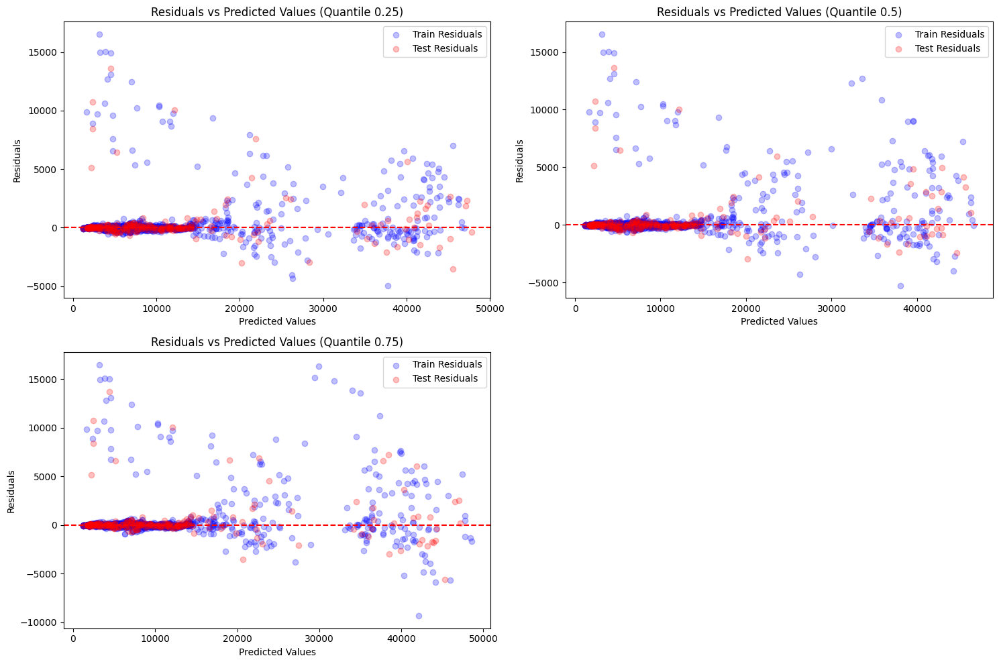

In [ ]:
plt.figure(figsize=(15, 10))

for i, q in enumerate(quantiles):
    res, y_pred_train_qxgc, y_pred_test_qxgc = results[q]

    # Calculate residuals for the training set
    residuals_train_qxgc = y_train_cleaned - y_pred_train_qxgc

    # Calculate residuals for the test set
    residuals_test_qxgc = y_test_cleaned - y_pred_test_qxgc

    # Plot residuals for the training and test sets together
    plt.subplot(2, 2, i+1)
    plt.scatter(y_pred_train_qxgc, residuals_train_qxgc, color='blue', alpha=0.25, label='Train Residuals')
    plt.scatter(y_pred_test_qxgc, residuals_test_qxgc, color='red', alpha=0.25, label='Test Residuals')
    plt.axhline(y=0, color='red', linestyle='--')
    plt.xlabel('Predicted Values')
    plt.ylabel('Residuals')
    plt.title(f'Residuals vs Predicted Values (Quantile {q})')
    plt.legend()

plt.tight_layout()
plt.show()


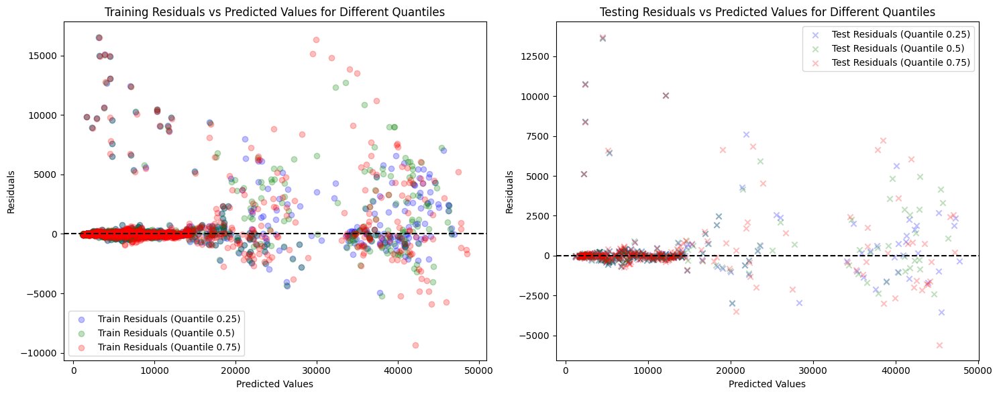

In [ ]:
# Plot residuals for each quantile in separate subplots for training and testing data
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))

colors = ['blue', 'green', 'red']
labels = ['Quantile 0.25', 'Quantile 0.5', 'Quantile 0.75']

for i, q in enumerate(quantiles):
    res, y_pred_train_qxgc, y_pred_test_qxgc = results[q]

    # Calculate residuals for the training set
    residuals_train_qxgc = y_train_cleaned - y_pred_train_qxgc

    # Calculate residuals for the test set
    residuals_test_qxgc = y_test_cleaned - y_pred_test_qxgc

    # Plot residuals for the training set
    ax1.scatter(y_pred_train_qxgc, residuals_train_qxgc, color=colors[i], alpha=0.25, label=f'Train Residuals ({labels[i]})')

    # Plot residuals for the test set
    ax2.scatter(y_pred_test_qxgc, residuals_test_qxgc, color=colors[i], alpha=0.25, label=f'Test Residuals ({labels[i]})', marker='x')

# Customize the training residuals plot
ax1.axhline(y=0, color='black', linestyle='--')
ax1.set_xlabel('Predicted Values')
ax1.set_ylabel('Residuals')
ax1.set_title('Training Residuals vs Predicted Values for Different Quantiles')
ax1.legend()

# Customize the testing residuals plot
ax2.axhline(y=0, color='black', linestyle='--')
ax2.set_xlabel('Predicted Values')
ax2.set_ylabel('Residuals')
ax2.set_title('Testing Residuals vs Predicted Values for Different Quantiles')
ax2.legend()

plt.tight_layout()
plt.show()

After Feature selection
Most significant features are:

1. Smoker

2. BMI

3. Age

Lets select only these feature and find outliers and high leverege points and again

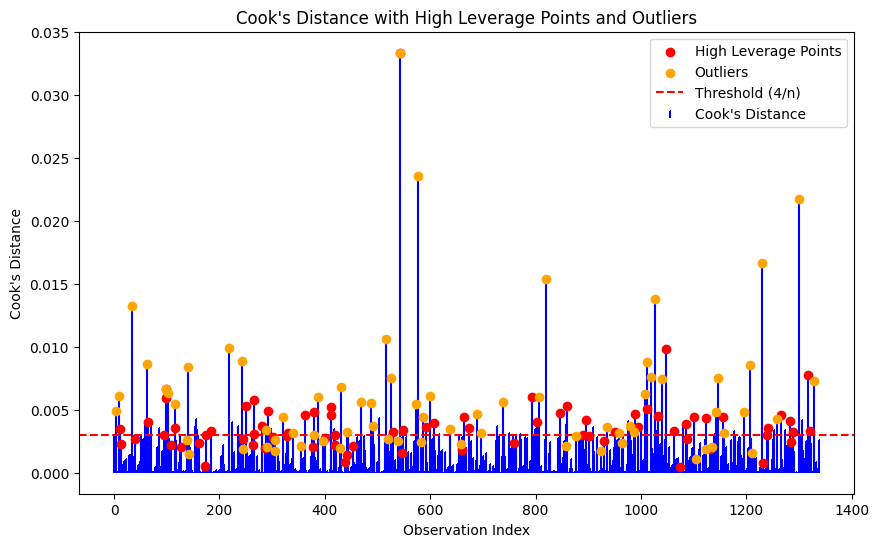

,Index,Leverage,Standardized Residuals,Cook's Distance
0,3,0.002284,2.920330,0.004880
1,9,0.003234,2.744077,0.006107
2,11,0.006364,-1.467441,0.003448
3,14,0.007068,1.130889,0.002276
4,34,0.004849,3.296929,0.013241
...,...,...,...,...
142,1288,0.006814,1.366333,0.003202
143,1300,0.003818,4.764565,0.021750
144,1317,0.013910,-1.483042,0.007756
145,1321,0.006276,-1.440710,0.003277


In [ ]:
target_column = 'charges'
selected_features = ['smoker', 'bmi', 'age']
X = data_numeric[selected_features]
y = data_numeric[target_column]

# Add a constant term for the intercept
X = sm.add_constant(X)

# Fit the model
model = sm.OLS(y, X).fit()

# Calculate influence measures
influence = model.get_influence()

# Leverage (hat values)
leverage = influence.hat_matrix_diag

# Standardized residuals
standardized_residuals = influence.resid_studentized_internal

# Cook's distance
cooks_d = influence.cooks_distance[0]

# Identify high leverage points
high_leverage_threshold = 2 * (X.shape[1] / X.shape[0])  # Common threshold
high_leverage_points = np.where(leverage > high_leverage_threshold)[0]

# Identify outliers
outlier_threshold = 2  # Common threshold for standardized residuals
outliers = np.where(np.abs(standardized_residuals) > outlier_threshold)[0]

# Combine influential points, high leverage points, and outliers
combined_indices = np.unique(np.concatenate((high_leverage_points, outliers)))

# Plot Cook's distance
plt.figure(figsize=(10, 6))
plt.stem(np.arange(len(cooks_d)), cooks_d, markerfmt=",", linefmt='b-', basefmt=' ', label='Cook\'s Distance')

# Highlight high leverage points
plt.scatter(high_leverage_points, cooks_d[high_leverage_points], color='red', label='High Leverage Points', zorder=3)

# Highlight outliers
plt.scatter(outliers, cooks_d[outliers], color='orange', label='Outliers', zorder=3)

plt.title("Cook's Distance with High Leverage Points and Outliers")
plt.xlabel("Observation Index")
plt.ylabel("Cook's Distance")
plt.axhline(y=4 / len(X), color='r', linestyle='--', label='Threshold (4/n)')
plt.legend()
plt.show()

# Display influential points summary
influential_points_summary = pd.DataFrame({
    'Index': combined_indices,
    'Leverage': leverage[combined_indices],
    'Standardized Residuals': standardized_residuals[combined_indices],
    'Cook\'s Distance': cooks_d[combined_indices]
})

influential_points_summary

In [ ]:
X

,const,smoker,bmi,age
0,1.0,1,27.900,19
1,1.0,0,33.770,18
2,1.0,0,33.000,28
3,1.0,0,22.705,33
4,1.0,0,28.880,32
...,...,...,...,...
1333,1.0,0,30.970,50
1334,1.0,0,31.920,18
1335,1.0,0,36.850,18
1336,1.0,0,25.800,21


In [ ]:
y

,charges
0,16884.92400
1,1725.55230
2,4449.46200
3,21984.47061
4,3866.85520
...,...
1333,10600.54830
1334,2205.98080
1335,1629.83350
1336,2007.94500


Fitting linear regression model without removing these outliers and high levereage poings

Linear Regression (Train) - Original - Mean Squared Error: 37638069.1703, R2 Score: 0.7392
Linear Regression (Test) - Original - Mean Squared Error: 34512843.8802, R2 Score: 0.7777


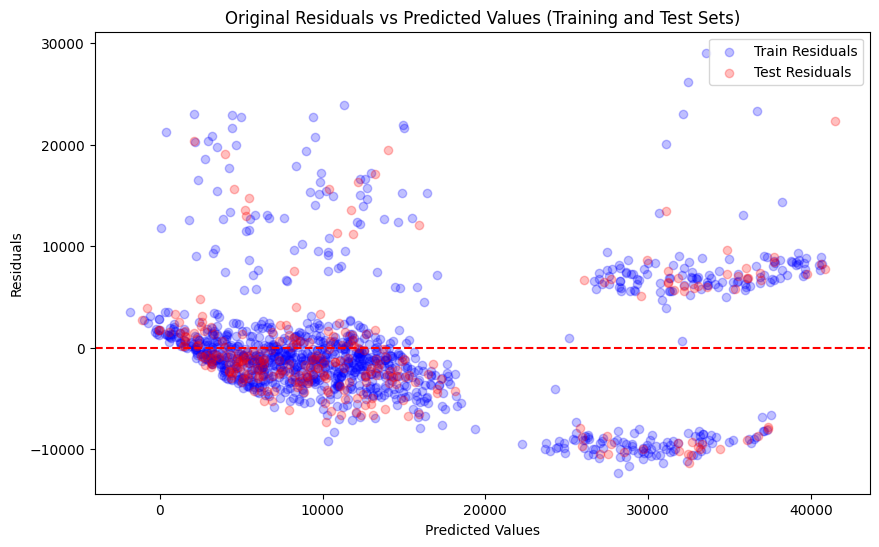

In [ ]:
# Split the cleaned data into training and testing sets
X_train_wo, X_test_wo, y_train_wo, y_test_wo = train_test_split(X, y, test_size=0.2, random_state=42)

# Fit the model again
linear_reg_wo = LinearRegression()
linear_reg_wo.fit(X_train_wo, y_train_wo)

# Predict and evaluate
y_pred_train_wo = linear_reg_wo.predict(X_train_wo)
y_pred_test_wo = linear_reg_wo.predict(X_test_wo)

# Define the evaluate_model function to calculate evaluation metrics
def evaluate_model(y_true, y_pred, model_name):
    from sklearn.metrics import mean_squared_error, r2_score
    mse = mean_squared_error(y_true, y_pred)
    r2 = r2_score(y_true, y_pred)
    print(f'{model_name} - Mean Squared Error: {mse:.4f}, R2 Score: {r2:.4f}')

evaluate_model(y_train_wo, y_pred_train_wo, "Linear Regression (Train) - Original")
evaluate_model(y_test_wo, y_pred_test_wo, "Linear Regression (Test) - Original")

# Calculate residuals for the training set
residuals_train_wo = y_train_wo - y_pred_train_wo

# Calculate residuals for the test set
residuals_test_wo = y_test_wo - y_pred_test_wo

# Plot residuals for the training and test sets together
plt.figure(figsize=(10, 6))
plt.scatter(y_pred_train_wo, residuals_train_wo, color='blue', alpha=0.25, label='Train Residuals')
plt.scatter(y_pred_test_wo, residuals_test_wo, color='red', alpha=0.25, label='Test Residuals')
plt.axhline(y=0, color='red', linestyle='--')
plt.xlabel('Predicted Values')
plt.ylabel('Residuals')
plt.title('Original Residuals vs Predicted Values (Training and Test Sets)')
plt.legend()
plt.show()

After removing high leverage points and outliers

In [ ]:
# Remove high leverage points and outliers from the dataset
data_cleaned = data_numeric.drop(index=combined_indices)

# Split the cleaned data into features and target
X_cleaned = data_cleaned[selected_features]
y_cleaned = data_cleaned[target_column]

# Add a constant term for the intercept
X_cleaned = sm.add_constant(X_cleaned)

# Split the cleaned data into training and testing sets
X_train_cleaned, X_test_cleaned, y_train_cleaned, y_test_cleaned = train_test_split(X_cleaned, y_cleaned, test_size=0.2, random_state=42)

# Fit the model again
linear_reg_cleaned = LinearRegression()
linear_reg_cleaned.fit(X_train_cleaned, y_train_cleaned)

# Predict and evaluate
y_pred_train_cleaned = linear_reg_cleaned.predict(X_train_cleaned)
y_pred_test_cleaned = linear_reg_cleaned.predict(X_test_cleaned)

# Define the evaluate_model function to calculate evaluation metrics
def evaluate_model(y_true, y_pred, model_name):
    from sklearn.metrics import mean_squared_error, r2_score
    mse = mean_squared_error(y_true, y_pred)
    r2 = r2_score(y_true, y_pred)
    print(f'{model_name} - Mean Squared Error: {mse:.4f}, R2 Score: {r2:.4f}')

evaluate_model(y_train_cleaned, y_pred_train_cleaned, "Linear Regression (Train) - Cleaned")
evaluate_model(y_test_cleaned, y_pred_test_cleaned, "Linear Regression (Test) - Cleaned")

Linear Regression (Train) - Cleaned - Mean Squared Error: 17223404.2413, R2 Score: 0.8326
Linear Regression (Test) - Cleaned - Mean Squared Error: 17390249.2428, R2 Score: 0.8706


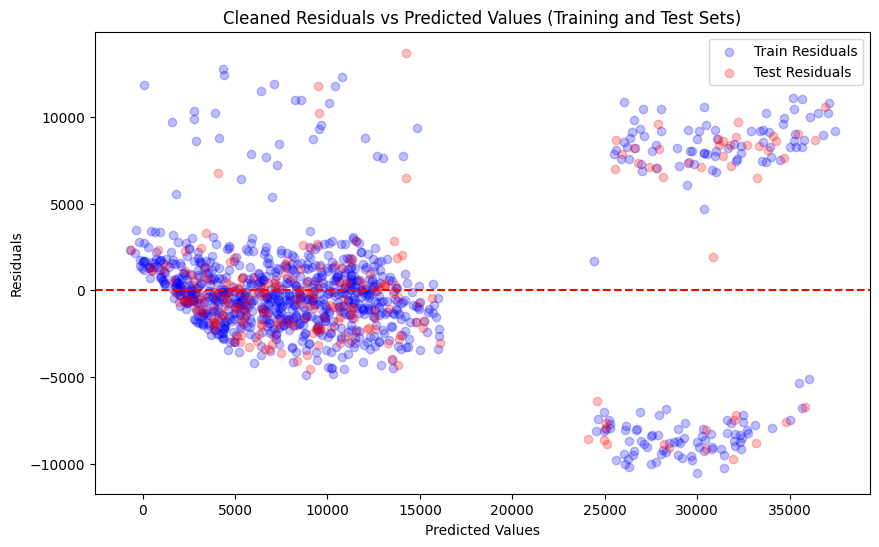

In [ ]:
# Calculate residuals for the training set
residuals_train_cleaned = y_train_cleaned - y_pred_train_cleaned

# Calculate residuals for the test set
residuals_test_cleaned = y_test_cleaned - y_pred_test_cleaned

# Plot residuals for the training and test sets together
plt.figure(figsize=(10, 6))
plt.scatter(y_pred_train_cleaned, residuals_train_cleaned, color='blue', alpha=0.25, label='Train Residuals')
plt.scatter(y_pred_test_cleaned, residuals_test_cleaned, color='red', alpha=0.25, label='Test Residuals')
plt.axhline(y=0, color='red', linestyle='--')
plt.xlabel('Predicted Values')
plt.ylabel('Residuals')
plt.title('Cleaned Residuals vs Predicted Values (Training and Test Sets)')
plt.legend()
plt.show()


In [ ]:
# Split the Original data into training and testing sets
X_train_wo, X_test_wo, y_train_wo, y_test_wo = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize the XGBRegressor
xgb_reg = xgb.XGBRegressor(objective='reg:squarederror', n_estimators=100, learning_rate=0.1, max_depth=3, random_state=42)

# Fit the model
xgb_reg.fit(X_train, y_train)

# Predict
y_pred_train = xgb_reg.predict(X_train)
y_pred_test = xgb_reg.predict(X_test)

def evaluate_model(y_true, y_pred, model_name):
    mse = mean_squared_error(y_true, y_pred)
    r2 = r2_score(y_true, y_pred)
    print(f'{model_name} - Mean Squared Error: {mse:.4f}, R2 Score: {r2:.4f}')

evaluate_model(y_train, y_pred_train, "XGBoost Regression (Train)")
evaluate_model(y_test, y_pred_test, "XGBoost Regression (Test)")


XGBoost Regression (Train) - Mean Squared Error: 14854631.6129, R2 Score: 0.8976
XGBoost Regression (Test) - Mean Squared Error: 20214518.9089, R2 Score: 0.8660


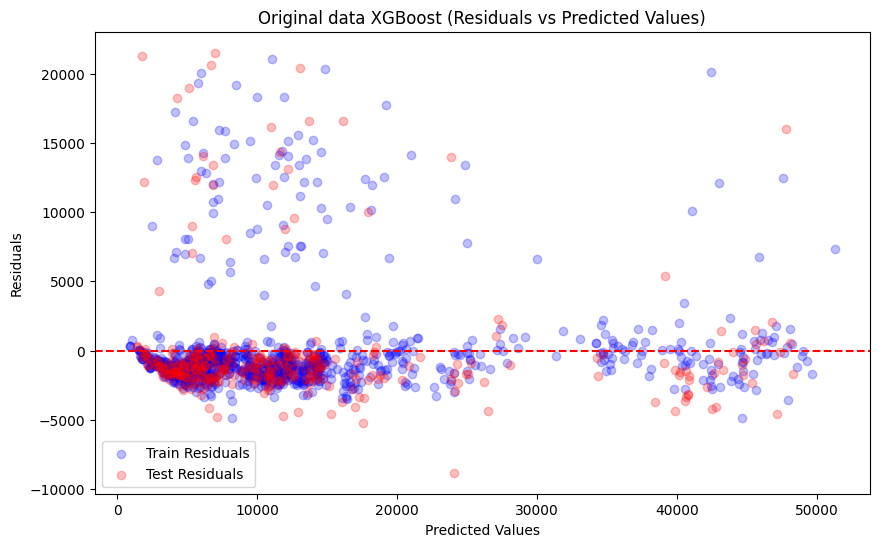

In [ ]:
# Calculate residuals for the training set
residuals_train = y_train - y_pred_train

# Calculate residuals for the test set
residuals_test = y_test - y_pred_test

# Plot residuals for the training and test sets together
plt.figure(figsize=(10, 6))
plt.scatter(y_pred_train, residuals_train, color='blue', alpha=0.25, label='Train Residuals')
plt.scatter(y_pred_test, residuals_test, color='red', alpha=0.25, label='Test Residuals')
plt.axhline(y=0, color='red', linestyle='--')
plt.xlabel('Predicted Values')
plt.ylabel('Residuals')
plt.title('Original data XGBoost (Residuals vs Predicted Values)')
plt.legend()
plt.show()


In [ ]:
# Initialize the XGBRegressor
xgb_reg2 = xgb.XGBRegressor(objective='reg:squarederror', n_estimators=100, learning_rate=0.1, max_depth=3, random_state=42)

# Fit the model
xgb_reg2.fit(X_train_cleaned, y_train_cleaned)

# Predict
y_pred_train_cleaned_xg = xgb_reg2.predict(X_train_cleaned)
y_pred_test_cleaned_xg = xgb_reg2.predict(X_test_cleaned)

def evaluate_model(y_true, y_pred, model_name):
    mse = mean_squared_error(y_true, y_pred)
    r2 = r2_score(y_true, y_pred)
    print(f'{model_name} - Mean Squared Error: {mse:.4f}, R2 Score: {r2:.4f}')

evaluate_model(y_train_cleaned, y_pred_train_cleaned_xg, "XGBoost Regression (Train)")
evaluate_model(y_test_cleaned, y_pred_test_cleaned_xg, "XGBoost Regression (Test)")

XGBoost Regression (Train) - Mean Squared Error: 4272318.2048, R2 Score: 0.9585
XGBoost Regression (Test) - Mean Squared Error: 4025027.4682, R2 Score: 0.9701


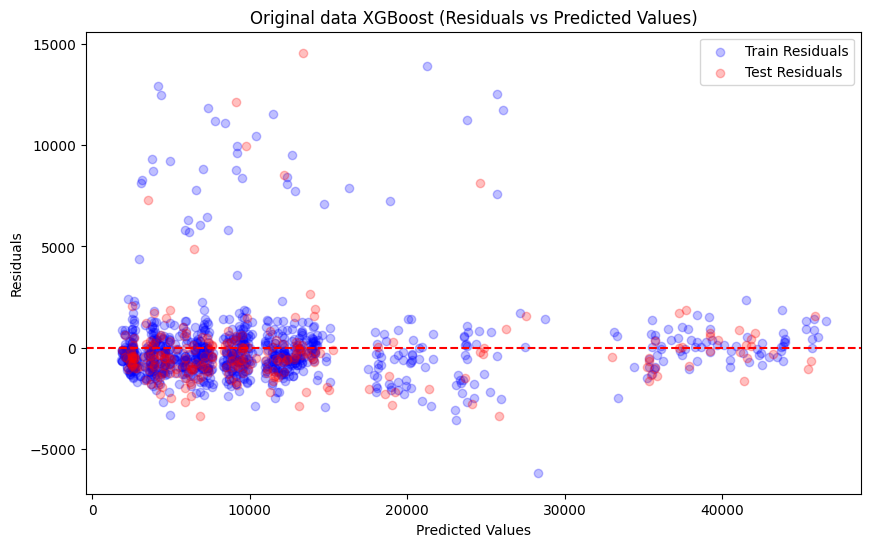

In [ ]:
# Calculate residuals for the training set
residuals_train_xg = y_train_cleaned - y_pred_train_cleaned_xg

# Calculate residuals for the test set
residuals_test_xg = y_test_cleaned - y_pred_test_cleaned_xg

# Plot residuals for the training and test sets together
plt.figure(figsize=(10, 6))
plt.scatter(y_pred_train_cleaned_xg, residuals_train_xg, color='blue', alpha=0.25, label='Train Residuals')
plt.scatter(y_pred_test_cleaned_xg, residuals_test_xg, color='red', alpha=0.25, label='Test Residuals')
plt.axhline(y=0, color='red', linestyle='--')
plt.xlabel('Predicted Values')
plt.ylabel('Residuals')
plt.title('Original data XGBoost (Residuals vs Predicted Values)')
plt.legend()
plt.show()


Quantile regression after feature selection

In [ ]:
quantiles = [0.25, 0.5, 0.75]
results = {}

for q in quantiles:
    res, y_pred_train_quant, y_pred_test_quant = quantile_regression(q, X_train_wo, y_train_wo, X_test_wo, y_test_wo)
    results[q] = (res, y_pred_train_quant, y_pred_test_quant)

Quantile 0.25 - Train MSE: 67238592.9645, R2: 0.5341
Quantile 0.25 - Test MSE: 65279359.1635, R2: 0.5795
Quantile 0.5 - Train MSE: 49285618.5110, R2: 0.6585
Quantile 0.5 - Test MSE: 43900311.2510, R2: 0.7172
Quantile 0.75 - Train MSE: 54736221.3347, R2: 0.6208
Quantile 0.75 - Test MSE: 49053563.9458, R2: 0.6840


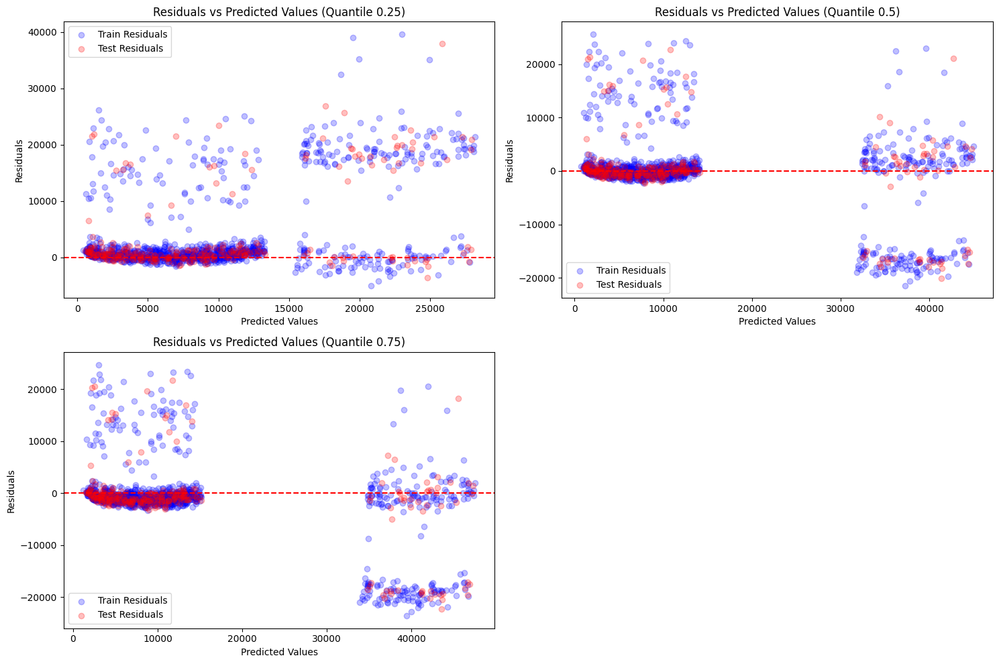

In [ ]:
plt.figure(figsize=(15, 10))

for i, q in enumerate(quantiles):
    res, y_pred_train_quant, y_pred_test_quant = results[q]

    # Calculate residuals for the training set
    residuals_train_quant = y_train_wo - y_pred_train_quant

    # Calculate residuals for the test set
    residuals_test_quant = y_test_wo - y_pred_test_quant

    # Plot residuals for the training and test sets together
    plt.subplot(2, 2, i+1)
    plt.scatter(y_pred_train_quant, residuals_train_quant, color='blue', alpha=0.25, label='Train Residuals')
    plt.scatter(y_pred_test_quant, residuals_test_quant, color='red', alpha=0.25, label='Test Residuals')
    plt.axhline(y=0, color='red', linestyle='--')
    plt.xlabel('Predicted Values')
    plt.ylabel('Residuals')
    plt.title(f'Residuals vs Predicted Values (Quantile {q})')
    plt.legend()

plt.tight_layout()
plt.show()


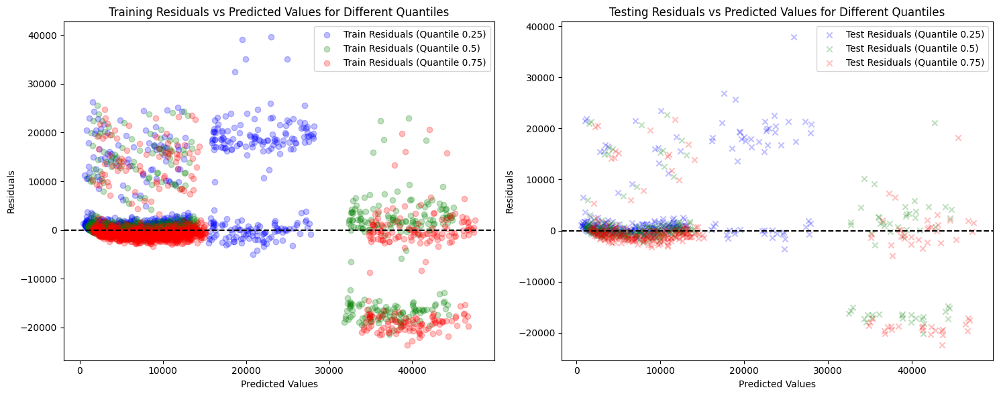

In [ ]:
# Plot residuals for each quantile in separate subplots for training and testing data
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))

colors = ['blue', 'green', 'red']
labels = ['Quantile 0.25', 'Quantile 0.5', 'Quantile 0.75']

for i, q in enumerate(quantiles):
    res, y_pred_train_quant, y_pred_test_quant = results[q]

    # Calculate residuals for the training set
    residuals_train_quant = y_train_wo - y_pred_train_quant

    # Calculate residuals for the test set
    residuals_test_quant = y_test_wo - y_pred_test_quant

    # Plot residuals for the training set
    ax1.scatter(y_pred_train_quant, residuals_train_quant, color=colors[i], alpha=0.25, label=f'Train Residuals ({labels[i]})')

    # Plot residuals for the test set
    ax2.scatter(y_pred_test_quant, residuals_test_quant, color=colors[i], alpha=0.25, label=f'Test Residuals ({labels[i]})', marker='x')

# Customize the training residuals plot
ax1.axhline(y=0, color='black', linestyle='--')
ax1.set_xlabel('Predicted Values')
ax1.set_ylabel('Residuals')
ax1.set_title('Training Residuals vs Predicted Values for Different Quantiles')
ax1.legend()

# Customize the testing residuals plot
ax2.axhline(y=0, color='black', linestyle='--')
ax2.set_xlabel('Predicted Values')
ax2.set_ylabel('Residuals')
ax2.set_title('Testing Residuals vs Predicted Values for Different Quantiles')
ax2.legend()

plt.tight_layout()
plt.show()

For cleaned data

Quantile 0.25 - Train MSE: 33384639.7899, R2: 0.6755
Quantile 0.25 - Test MSE: 45526883.8233, R2: 0.6613


/usr/local/lib/python3.10/dist-packages/statsmodels/regression/quantile_regression.py:191: IterationLimitWarning: Maximum number of iterations (10000) reached.
  warnings.warn("Maximum number of iterations (" + str(max_iter) +


Quantile 0.5 - Train MSE: 18880521.2374, R2: 0.8165
Quantile 0.5 - Test MSE: 18599118.2671, R2: 0.8616
Quantile 0.75 - Train MSE: 32648197.9749, R2: 0.6827
Quantile 0.75 - Test MSE: 25483532.5150, R2: 0.8104


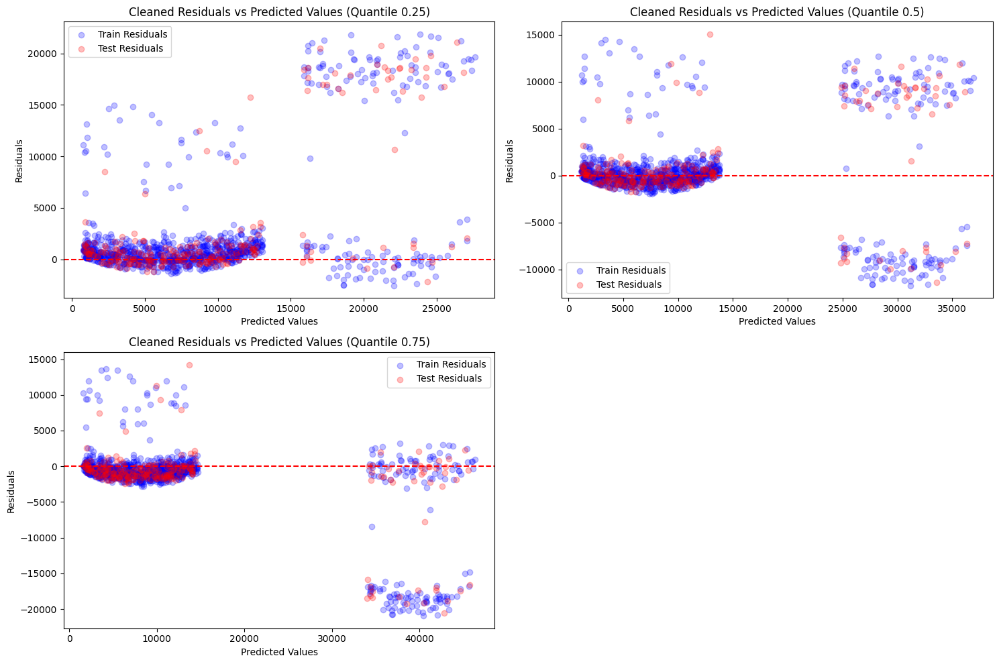

In [ ]:
quantiles = [0.25, 0.5, 0.75]
results = {}

for q in quantiles:
    res, y_pred_train_cq, y_pred_test_cq = quantile_regression(q, X_train_cleaned, y_train_cleaned, X_test_cleaned, y_test_cleaned)
    results[q] = (res, y_pred_train_cq, y_pred_test_cq)

plt.figure(figsize=(15, 10))

for i, q in enumerate(quantiles):
    res, y_pred_train_cq, y_pred_test_cq = results[q]

    # Calculate residuals for the training set
    residuals_train_cq = y_train_cleaned - y_pred_train_cq

    # Calculate residuals for the test set
    residuals_test_cq = y_test_cleaned - y_pred_test_cq

    # Plot residuals for the training and test sets together
    plt.subplot(2, 2, i+1)
    plt.scatter(y_pred_train_cq, residuals_train_cq, color='blue', alpha=0.25, label='Train Residuals')
    plt.scatter(y_pred_test_cq, residuals_test_cq, color='red', alpha=0.25, label='Test Residuals')
    plt.axhline(y=0, color='red', linestyle='--')
    plt.xlabel('Predicted Values')
    plt.ylabel('Residuals')
    plt.title(f'Cleaned Residuals vs Predicted Values (Quantile {q})')
    plt.legend()

plt.tight_layout()
plt.show()


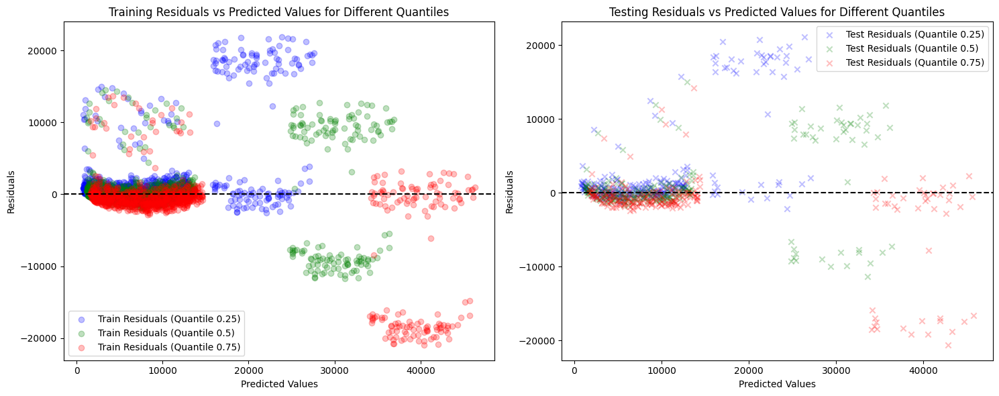

In [ ]:
# Plot residuals for each quantile in separate subplots for training and testing data
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))

colors = ['blue', 'green', 'red']
labels = ['Quantile 0.25', 'Quantile 0.5', 'Quantile 0.75']

for i, q in enumerate(quantiles):
    res, y_pred_train_cq, y_pred_test_cq = results[q]

    # Calculate residuals for the training set
    residuals_train_cq = y_train_cleaned - y_pred_train_cq

    # Calculate residuals for the test set
    residuals_test_cq= y_test_cleaned - y_pred_test_cq

    # Plot residuals for the training set
    ax1.scatter(y_pred_train_cq, residuals_train_cq, color=colors[i], alpha=0.25, label=f'Train Residuals ({labels[i]})')

    # Plot residuals for the test set
    ax2.scatter(y_pred_test_cq, residuals_test_cq, color=colors[i], alpha=0.25, label=f'Test Residuals ({labels[i]})', marker='x')

# Customize the training residuals plot
ax1.axhline(y=0, color='black', linestyle='--')
ax1.set_xlabel('Predicted Values')
ax1.set_ylabel('Residuals')
ax1.set_title('Training Residuals vs Predicted Values for Different Quantiles')
ax1.legend()

# Customize the testing residuals plot
ax2.axhline(y=0, color='black', linestyle='--')
ax2.set_xlabel('Predicted Values')
ax2.set_ylabel('Residuals')
ax2.set_title('Testing Residuals vs Predicted Values for Different Quantiles')
ax2.legend()

plt.tight_layout()
plt.show()

XGboost

In [ ]:
# Perform XGBoost quantile regression for 0.25, 0.5, and 0.75 quantiles
quantiles = [0.25, 0.5, 0.75]
results = {}

for q in quantiles:
    model, y_pred_train_quant, y_pred_test_quant = xgboost_quantile_regression(q, X_train_wo, y_train_wo, X_test_wo, y_test_wo)
    results[q] = (model, y_pred_train_quant, y_pred_test_quant)


Quantile 0.25 - Train MSE: 22121068.3138, R2: 0.8467
Quantile 0.25 - Test MSE: 21090354.7442, R2: 0.8642
Quantile 0.5 - Train MSE: 21889866.1398, R2: 0.8483
Quantile 0.5 - Test MSE: 21122081.6132, R2: 0.8639
Quantile 0.75 - Train MSE: 21961609.7667, R2: 0.8478
Quantile 0.75 - Test MSE: 21659843.4360, R2: 0.8605


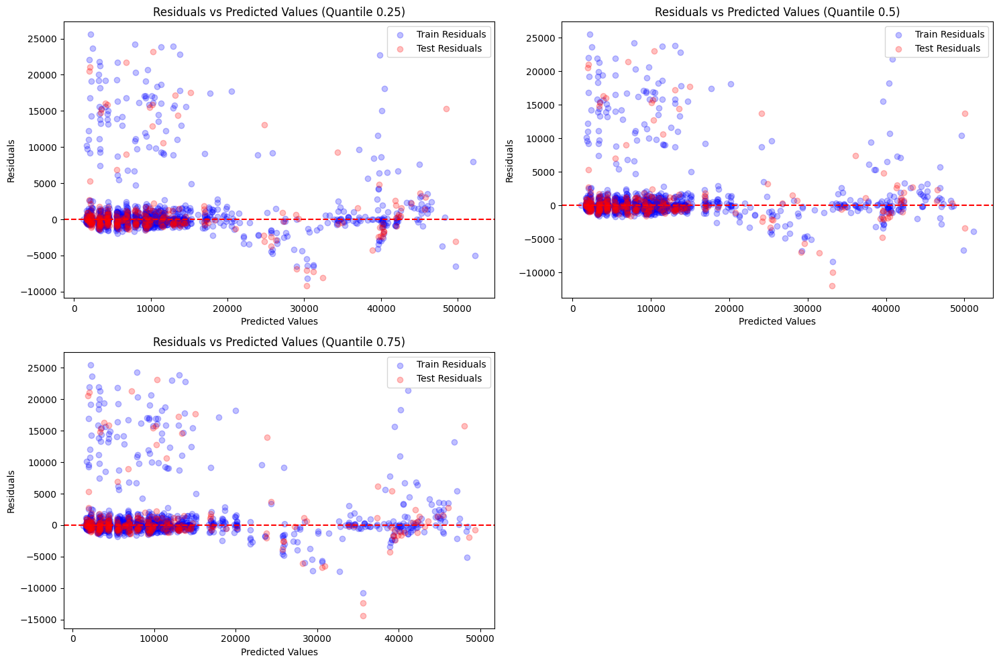

In [ ]:
plt.figure(figsize=(15, 10))

for i, q in enumerate(quantiles):
    res, y_pred_train_qxg, y_pred_test_qxg = results[q]

    # Calculate residuals for the training set
    residuals_train_qxg = y_train_wo - y_pred_train_qxg

    # Calculate residuals for the test set
    residuals_test_qxg = y_test_wo - y_pred_test_qxg

    # Plot residuals for the training and test sets together
    plt.subplot(2, 2, i+1)
    plt.scatter(y_pred_train_qxg, residuals_train_qxg, color='blue', alpha=0.25, label='Train Residuals')
    plt.scatter(y_pred_test_qxg, residuals_test_qxg, color='red', alpha=0.25, label='Test Residuals')
    plt.axhline(y=0, color='red', linestyle='--')
    plt.xlabel('Predicted Values')
    plt.ylabel('Residuals')
    plt.title(f'Residuals vs Predicted Values (Quantile {q})')
    plt.legend()

plt.tight_layout()
plt.show()


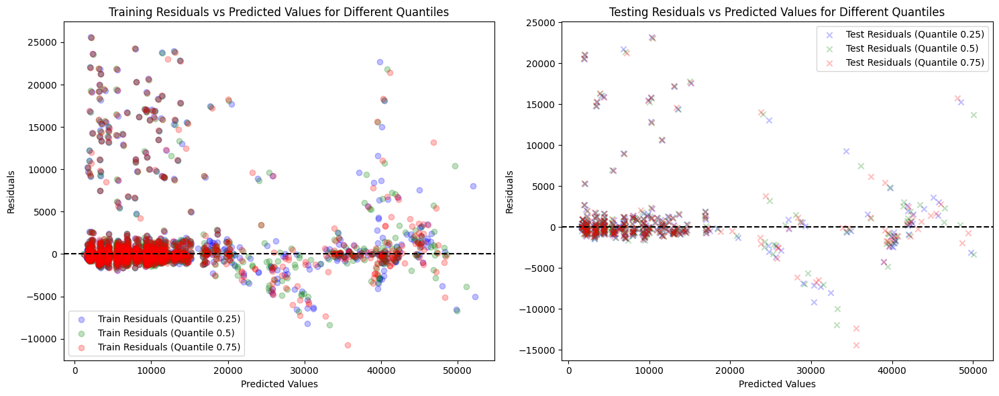

In [ ]:
# Plot residuals for each quantile in separate subplots for training and testing data
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))

colors = ['blue', 'green', 'red']
labels = ['Quantile 0.25', 'Quantile 0.5', 'Quantile 0.75']

for i, q in enumerate(quantiles):
    res, y_pred_train_qxg, y_pred_test_qxg = results[q]

    # Calculate residuals for the training set
    residuals_train_qxg = y_train_wo - y_pred_train_qxg

    # Calculate residuals for the test set
    residuals_test_qxg = y_test_wo - y_pred_test_qxg

    # Plot residuals for the training set
    ax1.scatter(y_pred_train_qxg, residuals_train_qxg, color=colors[i], alpha=0.25, label=f'Train Residuals ({labels[i]})')

    # Plot residuals for the test set
    ax2.scatter(y_pred_test_qxg, residuals_test_qxg, color=colors[i], alpha=0.25, label=f'Test Residuals ({labels[i]})', marker='x')

# Customize the training residuals plot
ax1.axhline(y=0, color='black', linestyle='--')
ax1.set_xlabel('Predicted Values')
ax1.set_ylabel('Residuals')
ax1.set_title('Training Residuals vs Predicted Values for Different Quantiles')
ax1.legend()

# Customize the testing residuals plot
ax2.axhline(y=0, color='black', linestyle='--')
ax2.set_xlabel('Predicted Values')
ax2.set_ylabel('Residuals')
ax2.set_title('Testing Residuals vs Predicted Values for Different Quantiles')
ax2.legend()

plt.tight_layout()
plt.show()

XGboost on clean data

In [ ]:
# Perform XGBoost quantile regression for 0.25, 0.5, and 0.75 quantiles
quantiles = [0.25, 0.5, 0.75]
results = {}

for q in quantiles:
    model, y_pred_train_qxgc, y_pred_test_qxgc = xgboost_quantile_regression(q, X_train_cleaned, y_train_cleaned, X_test_cleaned, y_test_cleaned)
    results[q] = (model, y_pred_train_qxgc, y_pred_test_qxgc)


Quantile 0.25 - Train MSE: 7283892.2628, R2: 0.9292
Quantile 0.25 - Test MSE: 6189905.8884, R2: 0.9540
Quantile 0.5 - Train MSE: 6506688.3092, R2: 0.9368
Quantile 0.5 - Test MSE: 5227699.1840, R2: 0.9611
Quantile 0.75 - Train MSE: 6572648.4739, R2: 0.9361
Quantile 0.75 - Test MSE: 5210260.0338, R2: 0.9612


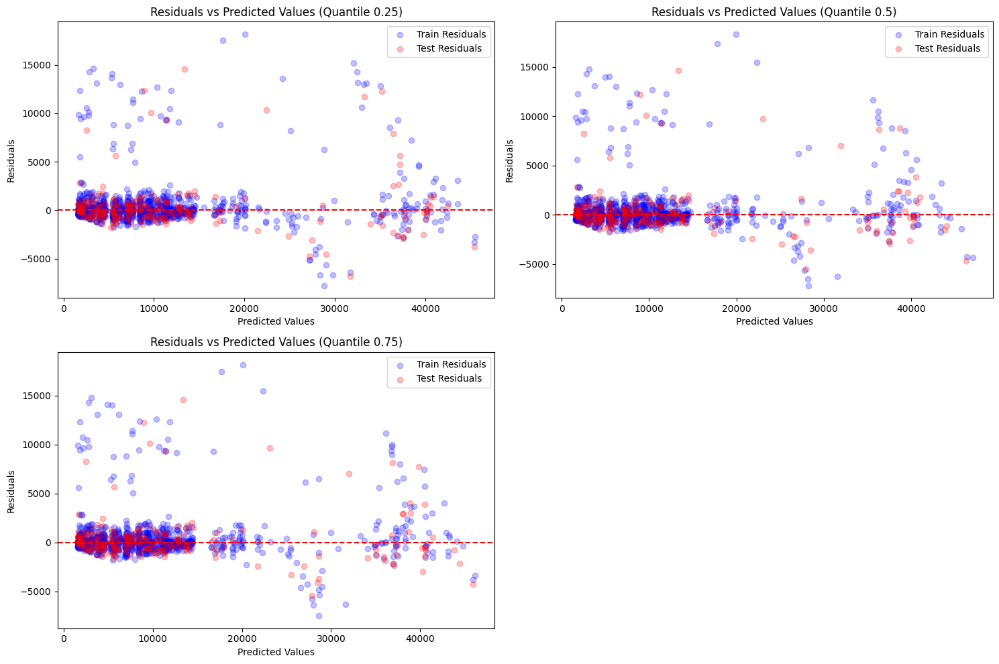

In [ ]:
plt.figure(figsize=(15, 10))

for i, q in enumerate(quantiles):
    res, y_pred_train_qxgc, y_pred_test_qxgc = results[q]

    # Calculate residuals for the training set
    residuals_train_qxgc = y_train_cleaned - y_pred_train_qxgc

    # Calculate residuals for the test set
    residuals_test_qxgc = y_test_cleaned - y_pred_test_qxgc

    # Plot residuals for the training and test sets together
    plt.subplot(2, 2, i+1)
    plt.scatter(y_pred_train_qxgc, residuals_train_qxgc, color='blue', alpha=0.25, label='Train Residuals')
    plt.scatter(y_pred_test_qxgc, residuals_test_qxgc, color='red', alpha=0.25, label='Test Residuals')
    plt.axhline(y=0, color='red', linestyle='--')
    plt.xlabel('Predicted Values')
    plt.ylabel('Residuals')
    plt.title(f'Residuals vs Predicted Values (Quantile {q})')
    plt.legend()

plt.tight_layout()
plt.show()


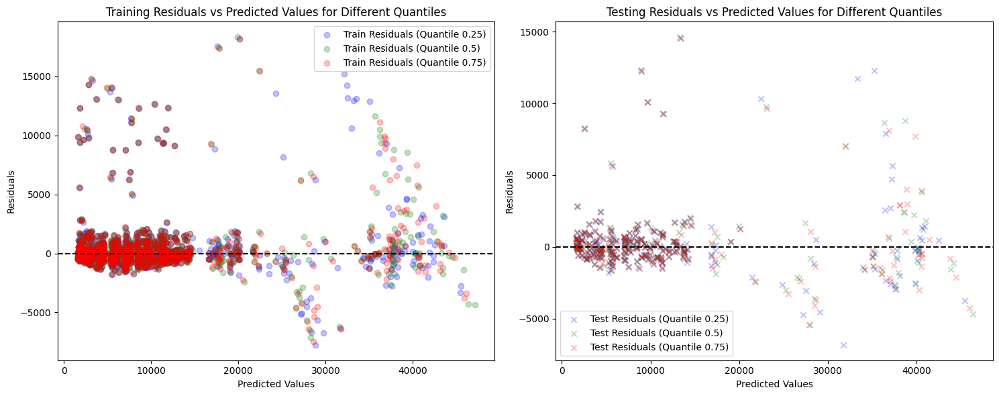

In [ ]:
# Plot residuals for each quantile in separate subplots for training and testing data
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))

colors = ['blue', 'green', 'red']
labels = ['Quantile 0.25', 'Quantile 0.5', 'Quantile 0.75']

for i, q in enumerate(quantiles):
    res, y_pred_train_qxgc, y_pred_test_qxgc = results[q]

    # Calculate residuals for the training set
    residuals_train_qxgc = y_train_cleaned - y_pred_train_qxgc

    # Calculate residuals for the test set
    residuals_test_qxgc = y_test_cleaned - y_pred_test_qxgc

    # Plot residuals for the training set
    ax1.scatter(y_pred_train_qxgc, residuals_train_qxgc, color=colors[i], alpha=0.25, label=f'Train Residuals ({labels[i]})')

    # Plot residuals for the test set
    ax2.scatter(y_pred_test_qxgc, residuals_test_qxgc, color=colors[i], alpha=0.25, label=f'Test Residuals ({labels[i]})', marker='x')

# Customize the training residuals plot
ax1.axhline(y=0, color='black', linestyle='--')
ax1.set_xlabel('Predicted Values')
ax1.set_ylabel('Residuals')
ax1.set_title('Training Residuals vs Predicted Values for Different Quantiles')
ax1.legend()

# Customize the testing residuals plot
ax2.axhline(y=0, color='black', linestyle='--')
ax2.set_xlabel('Predicted Values')
ax2.set_ylabel('Residuals')
ax2.set_title('Testing Residuals vs Predicted Values for Different Quantiles')
ax2.legend()

plt.tight_layout()
plt.show()

Doing same on Log prices after feature selection

In [ ]:
data.head()

,age,sex,bmi,children,smoker,region,charges,log_charges,age_group,cluster
0,19,female,27.900,0,yes,southwest,16884.92400,9.734176,18-24,1
1,18,male,33.770,1,no,southeast,1725.55230,7.453302,18-24,0
2,28,male,33.000,3,no,southeast,4449.46200,8.400538,25-34,0
3,33,male,22.705,0,no,northwest,21984.47061,9.998092,25-34,1
4,32,male,28.880,0,no,northwest,3866.85520,8.260197,25-34,0


In [ ]:
data_log_fs = pd.concat([data_numeric[selected_features], data[['charges', 'log_charges']]], axis=1)
data_log_fs.head()

,smoker,bmi,age,charges,log_charges
0,1,27.900,19,16884.92400,9.734176
1,0,33.770,18,1725.55230,7.453302
2,0,33.000,28,4449.46200,8.400538
3,0,22.705,33,21984.47061,9.998092
4,0,28.880,32,3866.85520,8.260197


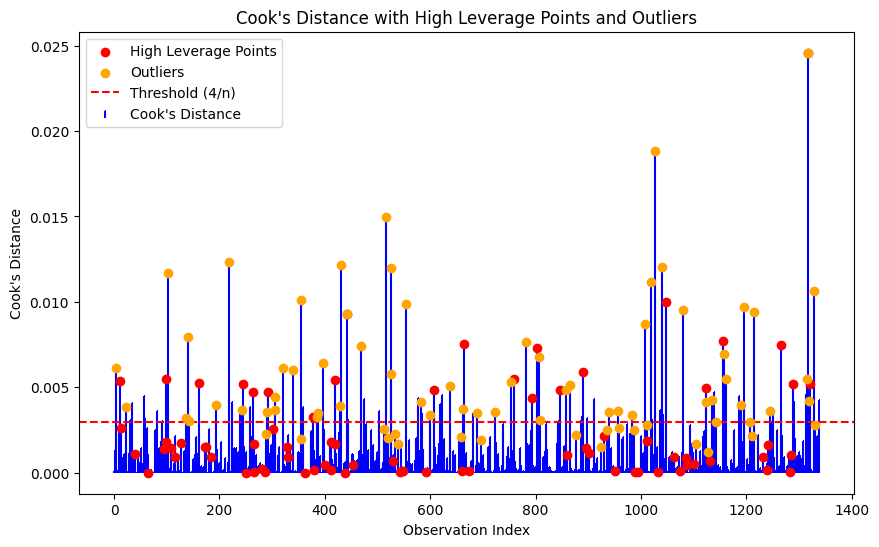

    Index  Leverage  Standardized Residuals  Cook's Distance
0       3  0.002284                3.270661         0.006121
1      11  0.006364               -1.830313         0.005364
2      22  0.003079               -2.233768         0.003853
3      98  0.007543               -1.694503         0.005456
4     102  0.002678                4.170618         0.011678
..    ...       ...                     ...              ...
75   1315  0.002710                2.838333         0.005472
76   1317  0.013910               -2.639974         0.024578
77   1318  0.002761                2.467352         0.004213
78   1321  0.006276               -1.817070         0.005213
79   1328  0.002607                4.032263         0.010626

[80 rows x 4 columns]


In [ ]:
# Assuming 'data_numeric' is your initial DataFrame and 'target_column' is defined as 'charges'
target_column = 'log_charges'
X = data_log_fs.drop(columns=[target_column, 'charges'])
y = data_log_fs[target_column]

# Add a constant term for the intercept
X = sm.add_constant(X)

# Fit the model
model = sm.OLS(y, X).fit()

# Calculate influence measures
influence = model.get_influence()

# Leverage (hat values)
leverage = influence.hat_matrix_diag

# Standardized residuals
standardized_residuals = influence.resid_studentized_internal

# Cook's distance
cooks_d = influence.cooks_distance[0]

# Identify high leverage points
high_leverage_threshold = 2 * (X.shape[1] / X.shape[0])  # Common threshold
high_leverage_points = np.where(leverage > high_leverage_threshold)[0]

# Identify outliers
outlier_threshold = 2  # Common threshold for standardized residuals
outliers = np.where(np.abs(standardized_residuals) > outlier_threshold)[0]

# Identify points with high Cook's distance
cooks_d_threshold = 4 / len(X)
high_cooks_d_points = np.where(cooks_d > cooks_d_threshold)[0]

# Combine influential points that are also high leverage points or outliers above Cook's distance threshold
combined_indices = np.unique(np.concatenate((
    np.intersect1d(high_leverage_points, high_cooks_d_points),
    np.intersect1d(outliers, high_cooks_d_points)
)))

# Plot Cook's distance
plt.figure(figsize=(10, 6))
plt.stem(np.arange(len(cooks_d)), cooks_d, markerfmt=",", linefmt='b-', basefmt=' ', label='Cook\'s Distance')

# Highlight high leverage points
plt.scatter(high_leverage_points, cooks_d[high_leverage_points], color='red', label='High Leverage Points', zorder=3)

# Highlight outliers
plt.scatter(outliers, cooks_d[outliers], color='orange', label='Outliers', zorder=3)

plt.title("Cook's Distance with High Leverage Points and Outliers")
plt.xlabel("Observation Index")
plt.ylabel("Cook's Distance")
plt.axhline(y=cooks_d_threshold, color='r', linestyle='--', label='Threshold (4/n)')
plt.legend()
plt.show()

# Display influential points summary
influential_points_summary = pd.DataFrame({
    'Index': combined_indices,
    'Leverage': leverage[combined_indices],
    'Standardized Residuals': standardized_residuals[combined_indices],
    'Cook\'s Distance': cooks_d[combined_indices]
})

# Print influential points summary
print(influential_points_summary)


Analysing high leverage points and outliers

Summary Statistics for High Leverage Points and Outliers:
             age        sex        bmi   children     smoker     region  \
count  80.000000  80.000000  80.000000  80.000000  80.000000  80.000000   
mean   29.562500   0.562500  32.164687   0.850000   0.250000   1.425000   
std    14.851879   0.499208   7.606306   1.080319   0.435745   1.003475   
min    18.000000   0.000000  18.715000   0.000000   0.000000   0.000000   
25%    19.000000   0.000000  26.766250   0.000000   0.000000   1.000000   
50%    24.000000   1.000000  31.625000   0.000000   0.000000   2.000000   
75%    32.250000   1.000000  37.348750   2.000000   0.250000   2.000000   
max    64.000000   1.000000  53.130000   4.000000   1.000000   3.000000   

            charges    cluster  
count     80.000000  80.000000  
mean   20541.736818   1.087500  
std    11708.352167   0.599446  
min     1121.873900   0.000000  
25%    13881.447675   1.000000  
50%    21270.332350   1.000000  
75%    27745.397838   1.000000  
ma

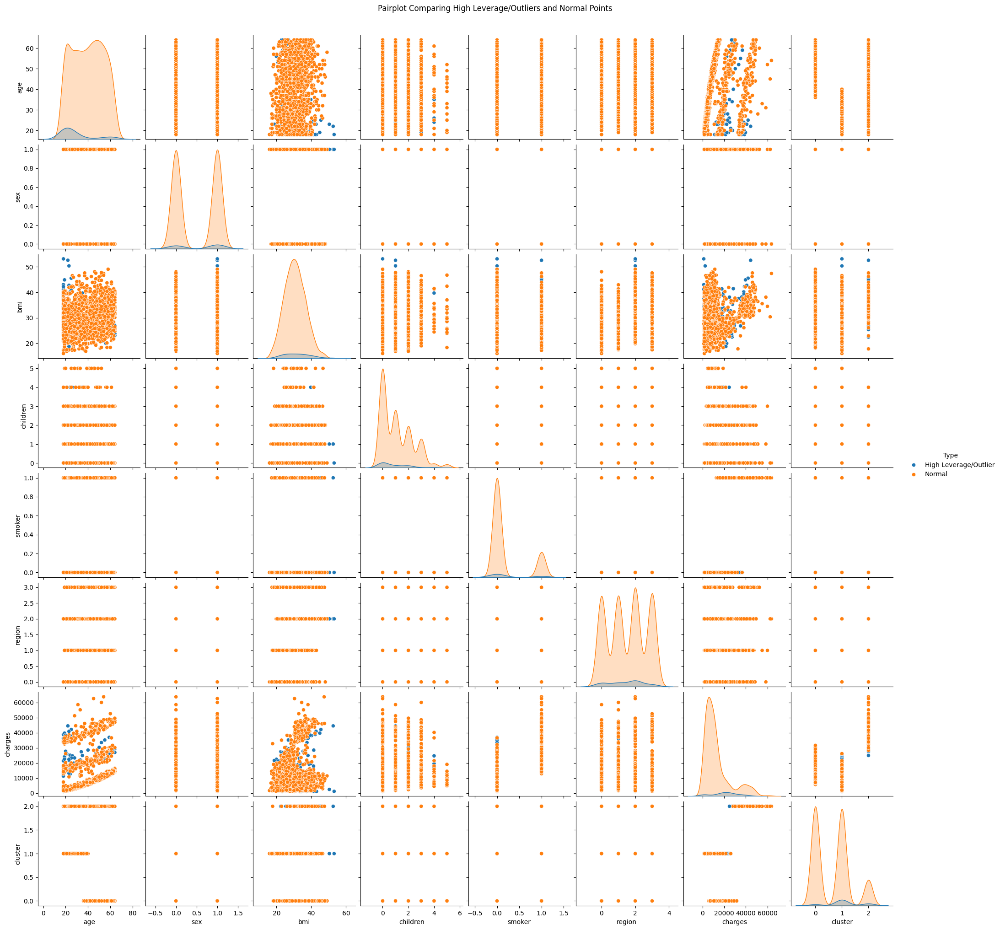

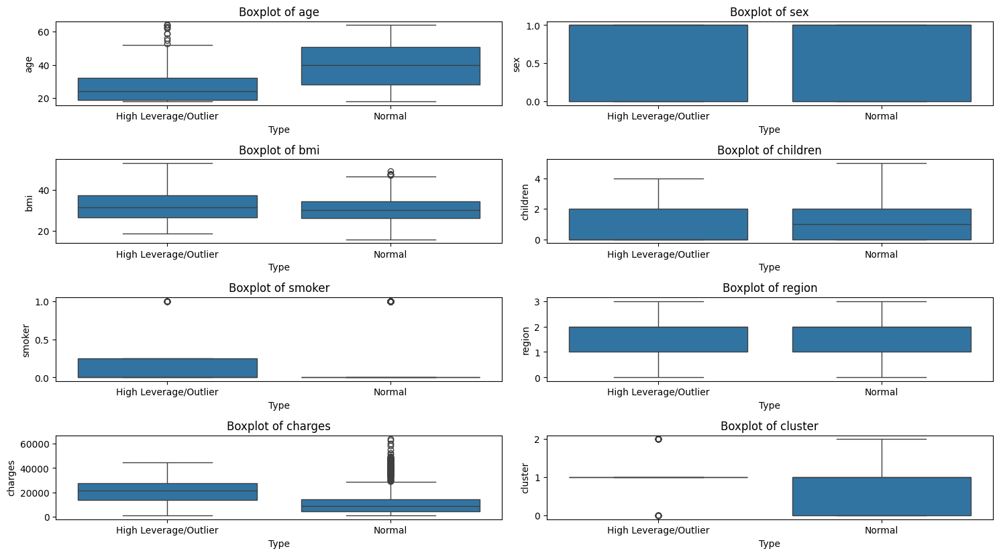

In [ ]:
# Extract high leverage points and outliers from the original dataset
high_leverage_outliers = data_numeric.loc[combined_indices]

# Compare high leverage points and outliers to the rest of the dataset
non_high_leverage_outliers = data_numeric.drop(index=combined_indices)

# Summary statistics for high leverage points and outliers
high_leverage_outliers_summary = high_leverage_outliers.describe()

# Summary statistics for the rest of the dataset
non_high_leverage_outliers_summary = non_high_leverage_outliers.describe()

# Display the summaries
print("Summary Statistics for High Leverage Points and Outliers:")
print(high_leverage_outliers_summary)
print("\nSummary Statistics for the Rest of the Dataset:")
print(non_high_leverage_outliers_summary)

# Visualize the high leverage points and outliers in the context of the dataset
# Pairplot can help to see the distribution and relationships between variables

# Combine the datasets with a new column to indicate if they are outliers/high leverage
high_leverage_outliers['Type'] = 'High Leverage/Outlier'
non_high_leverage_outliers['Type'] = 'Normal'

combined_data = pd.concat([high_leverage_outliers, non_high_leverage_outliers])

# Create pairplot
sns.pairplot(combined_data, hue='Type', diag_kind='kde')
plt.suptitle("Pairplot Comparing High Leverage/Outliers and Normal Points", y=1.02)
plt.show()

# Visualize distribution of each variable with boxplots
plt.figure(figsize=(15, 10))
for i, column in enumerate(data_numeric.columns):
    plt.subplot(len(data_numeric.columns) // 2 + 1, 2, i + 1)
    sns.boxplot(x='Type', y=column, data=combined_data)
    plt.title(f'Boxplot of {column}')
plt.tight_layout()
plt.show()

In [ ]:
# Remove outliers and high leverage points above the Cook's distance threshold
data_log_fs_cleaned = data_log_fs.drop(index=combined_indices)

# reset the index of the cleaned DataFrame
data_log_fs_cleaned = data_log_fs_cleaned.reset_index(drop=True)

data_log_fs_cleaned.head()

,smoker,bmi,age,charges,log_charges
0,1,27.90,19,16884.9240,9.734176
1,0,33.77,18,1725.5523,7.453302
2,0,33.00,28,4449.4620,8.400538
3,0,28.88,32,3866.8552,8.260197
4,0,25.74,31,3756.6216,8.231275


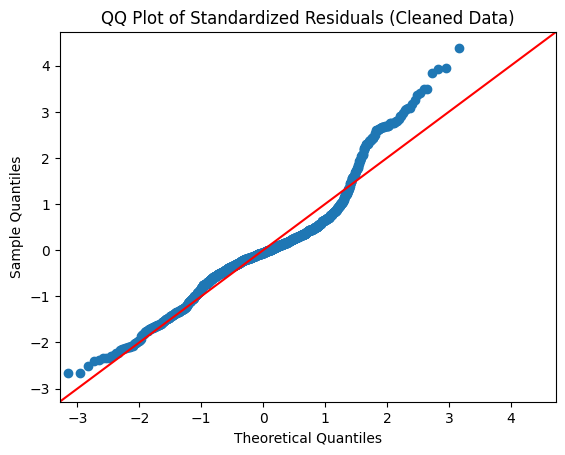

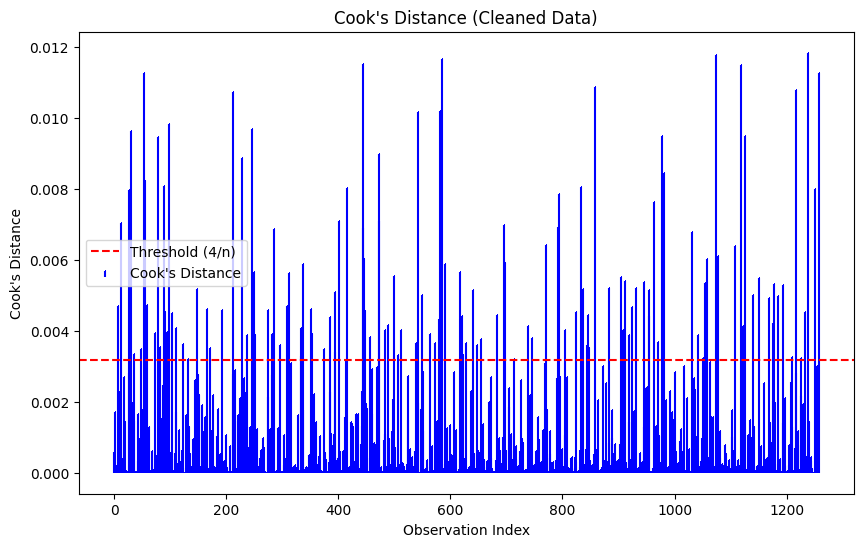

In [ ]:
# 'data_log_fs_cleaned' is cleaned DataFrame and 'target_column' is still 'charges'
target_column = 'log_charges'
X_cleaned = data_log_fs_cleaned.drop(columns=[target_column, 'charges'])
y_cleaned = data_log_fs_cleaned[target_column]

# Add a constant term for the intercept
X_cleaned = sm.add_constant(X_cleaned)

# Fit the model on the cleaned data
model_cleaned = sm.OLS(y_cleaned, X_cleaned).fit()

# Calculate influence measures
influence_cleaned = model_cleaned.get_influence()

# Standardized residuals for QQ plot
standardized_residuals_cleaned = influence_cleaned.resid_studentized_internal

# Cook's distance for Cook's distance plot
cooks_d_cleaned = influence_cleaned.cooks_distance[0]

# Plot QQ plot
sm.qqplot(standardized_residuals_cleaned, line='45')
plt.title("QQ Plot of Standardized Residuals (Cleaned Data)")
plt.show()

# Plot Cook's distance
plt.figure(figsize=(10, 6))
plt.stem(np.arange(len(cooks_d_cleaned)), cooks_d_cleaned, markerfmt=",", linefmt='b-', basefmt=' ', label='Cook\'s Distance')
plt.title("Cook's Distance (Cleaned Data)")
plt.xlabel("Observation Index")
plt.ylabel("Cook's Distance")
plt.axhline(y=4 / len(X_cleaned), color='r', linestyle='--', label='Threshold (4/n)')
plt.legend()
plt.show()

Linear Regression

In [ ]:
# Add a constant term for the intercept
X_cleaned = sm.add_constant(X_cleaned)

# Split the cleaned data into training and testing sets
X_train_cleaned, X_test_cleaned, y_train_cleaned, y_test_cleaned = train_test_split(X_cleaned, y_cleaned, test_size=0.2, random_state=42)

# Fit the model again
linear_reg_cleaned = LinearRegression()
linear_reg_cleaned.fit(X_train_cleaned, y_train_cleaned)

# Predict and evaluate
y_pred_train_cleaned = linear_reg_cleaned.predict(X_train_cleaned)
y_pred_test_cleaned = linear_reg_cleaned.predict(X_test_cleaned)

evaluate_model(y_train_cleaned, y_pred_train_cleaned, "Linear Regression (Train) - Cleaned")
evaluate_model(y_test_cleaned, y_pred_test_cleaned, "Linear Regression (Test) - Cleaned")

Linear Regression (Train) - Cleaned - Mean Squared Error: 0.1147, R2 Score: 0.8572
Linear Regression (Test) - Cleaned - Mean Squared Error: 0.1086, R2 Score: 0.8589


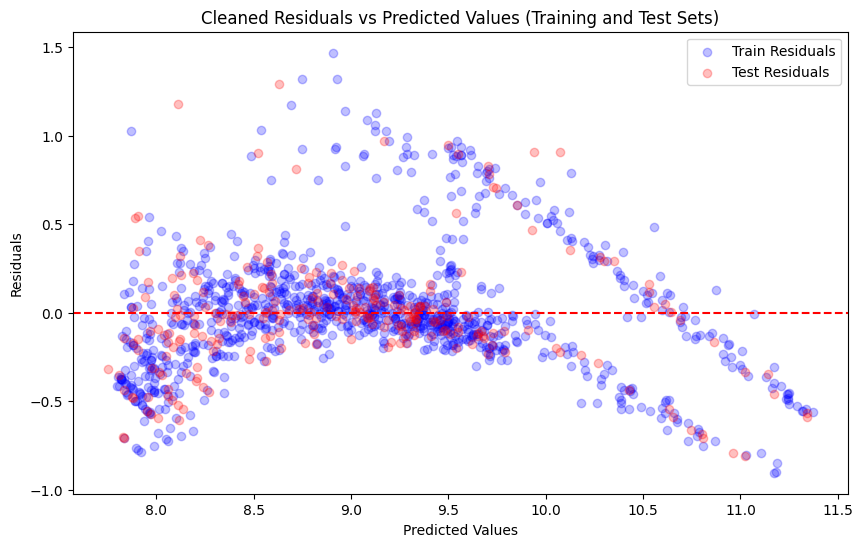

In [ ]:
# Calculate residuals for the training set
residuals_train_cleaned = y_train_cleaned - y_pred_train_cleaned

# Calculate residuals for the test set
residuals_test_cleaned = y_test_cleaned - y_pred_test_cleaned

# Plot residuals for the training and test sets together
plt.figure(figsize=(10, 6))
plt.scatter(y_pred_train_cleaned, residuals_train_cleaned, color='blue', alpha=0.25, label='Train Residuals')
plt.scatter(y_pred_test_cleaned, residuals_test_cleaned, color='red', alpha=0.25, label='Test Residuals')
plt.axhline(y=0, color='red', linestyle='--')
plt.xlabel('Predicted Values')
plt.ylabel('Residuals')
plt.title('Cleaned Residuals vs Predicted Values (Training and Test Sets)')
plt.legend()
plt.show()


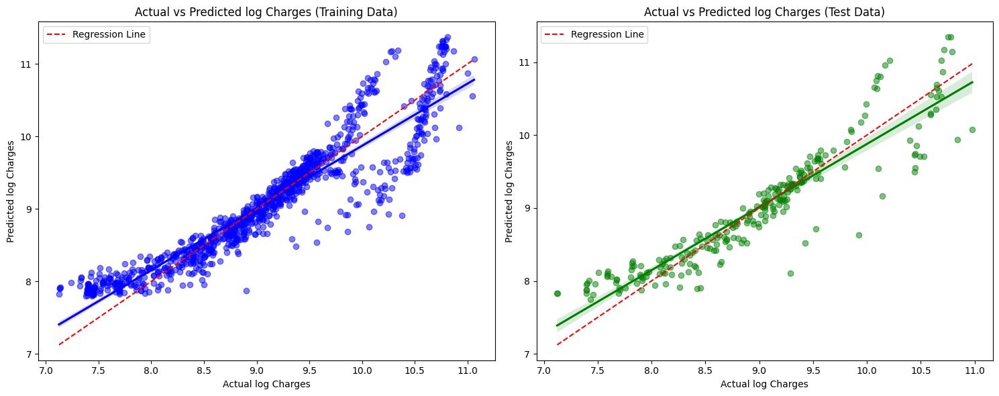

In [ ]:
# Create subplots
fig, axes = plt.subplots(1, 2, figsize=(15, 6))

# Plot for the training set
sns.regplot(ax=axes[0],
            x=y_train_cleaned,
            y=y_pred_train_cleaned,
            scatter_kws={'color': 'blue', 'alpha': 0.5},
            line_kws={'color': 'blue'},
            ci=95)
axes[0].plot([y_train_cleaned.min(), y_train_cleaned.max()],
             [y_train_cleaned.min(), y_train_cleaned.max()],
             '--', color='red', label='Regression Line')
axes[0].set_xlabel('Actual log Charges')
axes[0].set_ylabel('Predicted log Charges')
axes[0].set_title('Actual vs Predicted log Charges (Training Data)')
axes[0].legend()

# Plot for the test set
sns.regplot(ax=axes[1],
            x=y_test_cleaned,
            y=y_pred_test_cleaned,
            scatter_kws={'color': 'green', 'alpha': 0.5},
            line_kws={'color': 'green'},
            ci=95)
axes[1].plot([y_test_cleaned.min(), y_test_cleaned.max()],
             [y_test_cleaned.min(), y_test_cleaned.max()],
             '--', color='red', label='Regression Line')
axes[1].set_xlabel('Actual log Charges')
axes[1].set_ylabel('Predicted log Charges')
axes[1].set_title('Actual vs Predicted log Charges (Test Data)')
axes[1].legend()

# Adjust layout
plt.tight_layout()
plt.show()

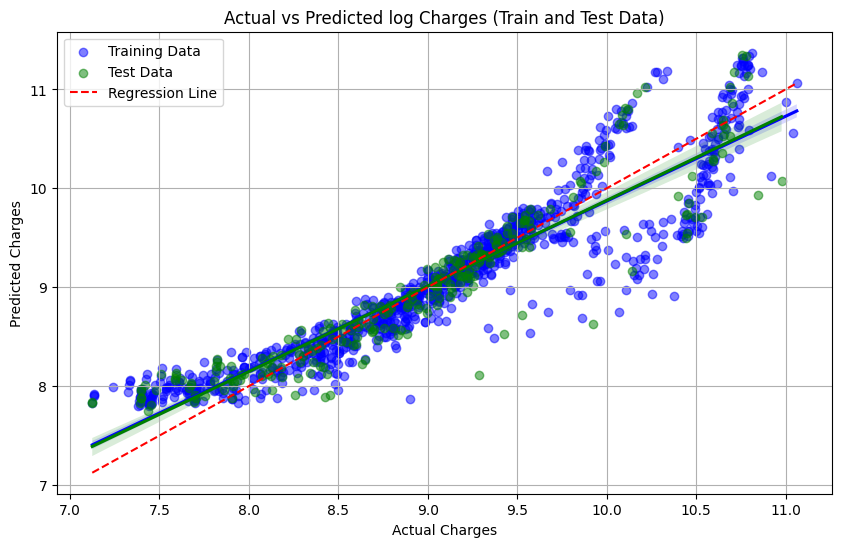

In [ ]:
# Create a combined DataFrame for easier plotting
combined_df = pd.DataFrame({
    'Actual': pd.concat([pd.Series(y_train_cleaned).reset_index(drop=True),
                         pd.Series(y_test_cleaned).reset_index(drop=True)]),
    'Predicted': pd.concat([pd.Series(y_pred_train_cleaned).reset_index(drop=True),
                            pd.Series(y_pred_test_cleaned).reset_index(drop=True)]),
    'Dataset': ['Train'] * len(y_train_cleaned) + ['Test'] * len(y_test_cleaned)
})

# Create the plot
plt.figure(figsize=(10, 6))

# Plot the training data with regression line and confidence interval
sns.regplot(data=combined_df[combined_df['Dataset'] == 'Train'],
            x='Actual',
            y='Predicted',
            scatter_kws={'color': 'blue', 'alpha': 0.5},
            line_kws={'color': 'blue'},
            label='Training Data',
            ci=95)

# Plot the test data with regression line and confidence interval
sns.regplot(data=combined_df[combined_df['Dataset'] == 'Test'],
            x='Actual',
            y='Predicted',
            scatter_kws={'color': 'green', 'alpha': 0.5},
            line_kws={'color': 'green'},
            label='Test Data',
            ci=95)

# Add a line for perfect prediction
plt.plot([combined_df['Actual'].min(), combined_df['Actual'].max()],
         [combined_df['Actual'].min(), combined_df['Actual'].max()],
         '--', color='red', label='Regression Line')

# Customize the plot
plt.xlabel('Actual Charges')
plt.ylabel('Predicted Charges')
plt.title('Actual vs Predicted log Charges (Train and Test Data)')
plt.legend()
plt.grid()
plt.show()

Quantile 0.25 - Train MSE: 0.1739, R2: 0.7836
Quantile 0.25 - Test MSE: 0.1631, R2: 0.7881
Quantile 0.5 - Train MSE: 0.1171, R2: 0.8543
Quantile 0.5 - Test MSE: 0.1099, R2: 0.8572
Quantile 0.75 - Train MSE: 0.1465, R2: 0.8178
Quantile 0.75 - Test MSE: 0.1363, R2: 0.8229


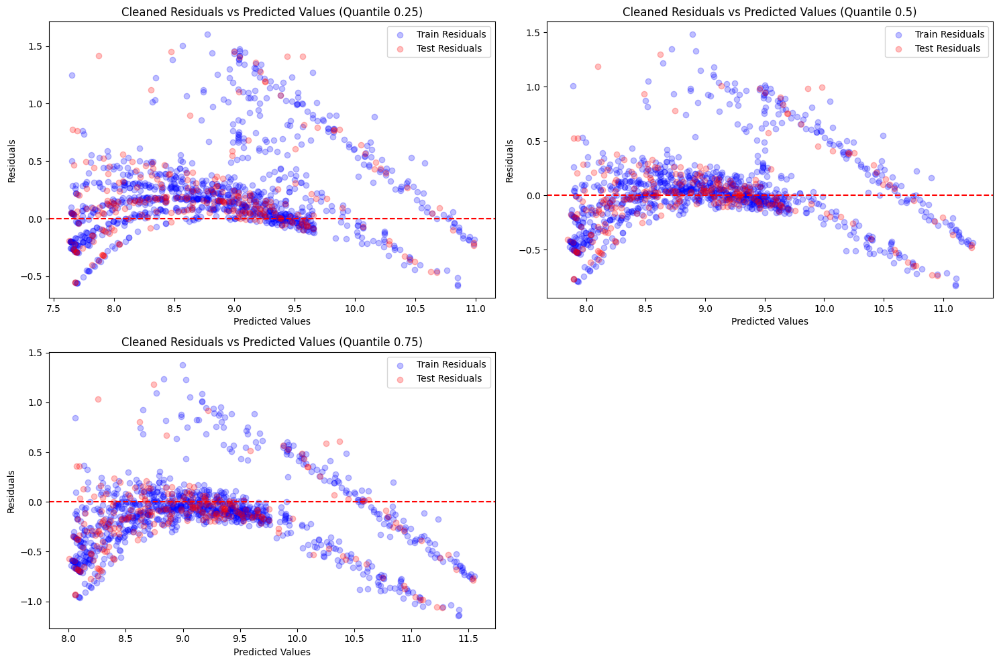

In [ ]:
X_cleaned = data_log_fs_cleaned.drop(columns=[target_column, 'charges'])
y_cleaned = data_log_fs_cleaned[target_column]

# Add a constant term for the intercept
X_cleaned = sm.add_constant(X_cleaned)

# Split the cleaned data into training and testing sets
X_train_cleaned, X_test_cleaned, y_train_cleaned, y_test_cleaned = train_test_split(X_cleaned, y_cleaned, test_size=0.2, random_state=42)

quantiles = [0.25, 0.5, 0.75]
results = {}

for q in quantiles:
    res, y_pred_train_cq, y_pred_test_cq = quantile_regression(q, X_train_cleaned, y_train_cleaned, X_test_cleaned, y_test_cleaned)
    results[q] = (res, y_pred_train_cq, y_pred_test_cq)

plt.figure(figsize=(15, 10))

for i, q in enumerate(quantiles):
    res, y_pred_train_cq, y_pred_test_cq = results[q]

    # Calculate residuals for the training set
    residuals_train_cq = y_train_cleaned - y_pred_train_cq

    # Calculate residuals for the test set
    residuals_test_cq = y_test_cleaned - y_pred_test_cq

    # Plot residuals for the training and test sets together
    plt.subplot(2, 2, i+1)
    plt.scatter(y_pred_train_cq, residuals_train_cq, color='blue', alpha=0.25, label='Train Residuals')
    plt.scatter(y_pred_test_cq, residuals_test_cq, color='red', alpha=0.25, label='Test Residuals')
    plt.axhline(y=0, color='red', linestyle='--')
    plt.xlabel('Predicted Values')
    plt.ylabel('Residuals')
    plt.title(f'Cleaned Residuals vs Predicted Values (Quantile {q})')
    plt.legend()

plt.tight_layout()
plt.show()


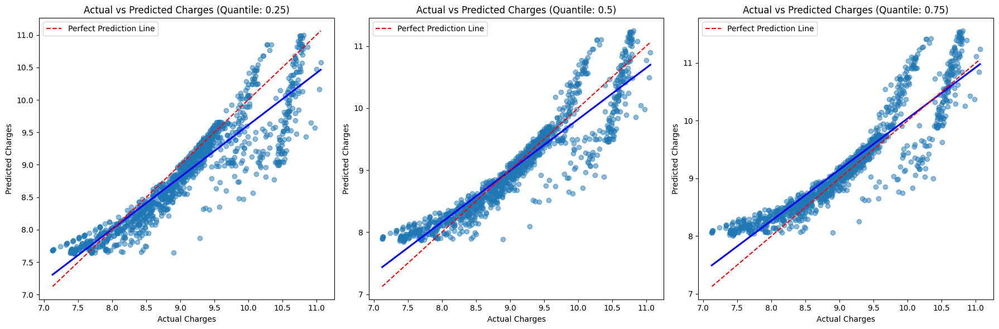

In [ ]:
# Create subplots for each quantile
fig, axes = plt.subplots(1, len(quantiles), figsize=(18, 6))

for i, q in enumerate(quantiles):
    # Unpack the results
    res, y_pred_train_cq, y_pred_test_cq = results[q]

    # Create a combined DataFrame for easier plotting
    combined_df = pd.DataFrame({
        'Actual': pd.concat([y_train_cleaned.reset_index(drop=True), y_test_cleaned.reset_index(drop=True)]),
        'Predicted': pd.concat([pd.Series(y_pred_train_cq).reset_index(drop=True),
                                pd.Series(y_pred_test_cq).reset_index(drop=True)]),
        'Dataset': ['Train'] * len(y_train_cleaned) + ['Test'] * len(y_test_cleaned)
    })

    # Plot for the current quantile
    sns.regplot(ax=axes[i],
                data=combined_df,
                x='Actual',
                y='Predicted',
                scatter_kws={'alpha': 0.5},
                line_kws={'color': 'blue'},
                ci=None)

    # Add a line for perfect prediction
    axes[i].plot([combined_df['Actual'].min(), combined_df['Actual'].max()],
                  [combined_df['Actual'].min(), combined_df['Actual'].max()],
                  '--', color='red', label='Perfect Prediction Line')

    # Customize the plot
    axes[i].set_title(f'Actual vs Predicted Charges (Quantile: {q})')
    axes[i].set_xlabel('Actual Charges')
    axes[i].set_ylabel('Predicted Charges')
    axes[i].legend()

# Adjust layout
plt.tight_layout()
plt.show()

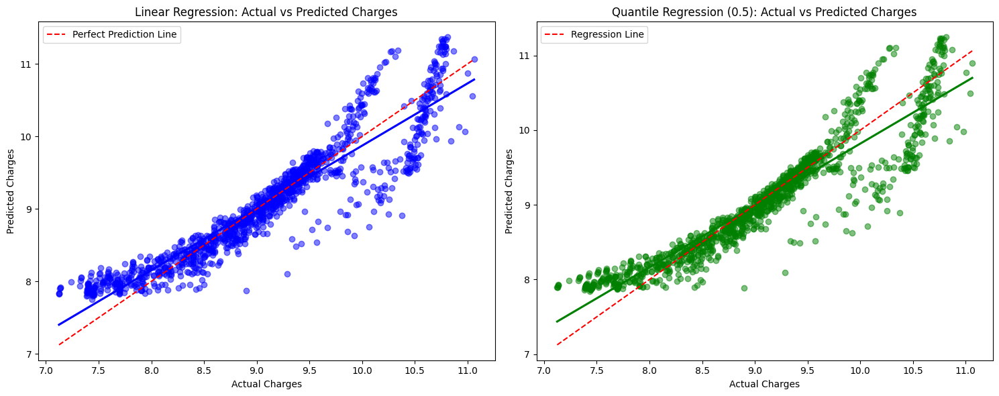

In [ ]:
# Create subplots: 1 row, 2 columns
fig, axes = plt.subplots(1, 2, figsize=(15, 6))

# Linear Regression Plot
# Combine actual and predicted values for linear regression
actual_linear = pd.concat([y_train_cleaned, y_test_cleaned]).reset_index(drop=True)
predicted_linear = pd.concat([pd.Series(y_pred_train_cleaned), pd.Series(y_pred_test_cleaned)]).reset_index(drop=True)

sns.regplot(ax=axes[0],
            x=actual_linear,
            y=predicted_linear,
            scatter_kws={'color': 'blue', 'alpha': 0.5},
            line_kws={'color': 'blue'},
            ci=None)
axes[0].plot([actual_linear.min(), actual_linear.max()],
              [actual_linear.min(), actual_linear.max()],
              '--', color='red', label='Perfect Prediction Line')
axes[0].set_xlabel('Actual Charges')
axes[0].set_ylabel('Predicted Charges')
axes[0].set_title('Linear Regression: Actual vs Predicted Charges')
axes[0].legend()

# Quantile Regression Plot for 0.5 Quantile
q = 0.5
res, y_pred_train_cq, y_pred_test_cq = results[q]

# Create a combined DataFrame for the quantile regression plot
combined_df_q5 = pd.DataFrame({
    'Actual': pd.concat([y_train_cleaned.reset_index(drop=True), y_test_cleaned.reset_index(drop=True)]),
    'Predicted': pd.concat([pd.Series(y_pred_train_cq).reset_index(drop=True),
                            pd.Series(y_pred_test_cq).reset_index(drop=True)]),
    'Dataset': ['Train'] * len(y_train_cleaned) + ['Test'] * len(y_test_cleaned)
})

sns.regplot(ax=axes[1],
            data=combined_df_q5,
            x='Actual',
            y='Predicted',
            scatter_kws={'color': 'green', 'alpha': 0.5},
            line_kws={'color': 'green'},
            ci=None)
axes[1].plot([combined_df_q5['Actual'].min(), combined_df_q5['Actual'].max()],
              [combined_df_q5['Actual'].min(), combined_df_q5['Actual'].max()],
              '--', color='red', label='Regression Line')
axes[1].set_xlabel('Actual Charges')
axes[1].set_ylabel('Predicted Charges')
axes[1].set_title('Quantile Regression (0.5): Actual vs Predicted Charges')
axes[1].legend()

# Adjust layout
plt.tight_layout()
plt.show()

XG Boost

Linear Regression

In [ ]:
# Split the Original data into training and testing sets
X_train_wo, X_test_wo, y_train_wo, y_test_wo = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize the XGBRegressor
xgb_reg = xgb.XGBRegressor(objective='reg:squarederror', n_estimators=100, learning_rate=0.1, max_depth=3, random_state=42)

# Fit the model
xgb_reg.fit(X_train, y_train)

# Predict
y_pred_train = xgb_reg.predict(X_train)
y_pred_test = xgb_reg.predict(X_test)

def evaluate_model(y_true, y_pred, model_name):
    mse = mean_squared_error(y_true, y_pred)
    r2 = r2_score(y_true, y_pred)
    print(f'{model_name} - Mean Squared Error: {mse:.4f}, R2 Score: {r2:.4f}')

evaluate_model(y_train, y_pred_train, "XGBoost Regression (Train)")
evaluate_model(y_test, y_pred_test, "XGBoost Regression (Test)")


XGBoost Regression (Train) - Mean Squared Error: 14854631.6129, R2 Score: 0.8976
XGBoost Regression (Test) - Mean Squared Error: 20214518.9089, R2 Score: 0.8660


Quantile 0.25 - Train MSE: 0.0565, R2: 0.9297
Quantile 0.25 - Test MSE: 0.0566, R2: 0.9265
Quantile 0.5 - Train MSE: 0.0562, R2: 0.9301
Quantile 0.5 - Test MSE: 0.0554, R2: 0.9280
Quantile 0.75 - Train MSE: 0.0556, R2: 0.9309
Quantile 0.75 - Test MSE: 0.0556, R2: 0.9278


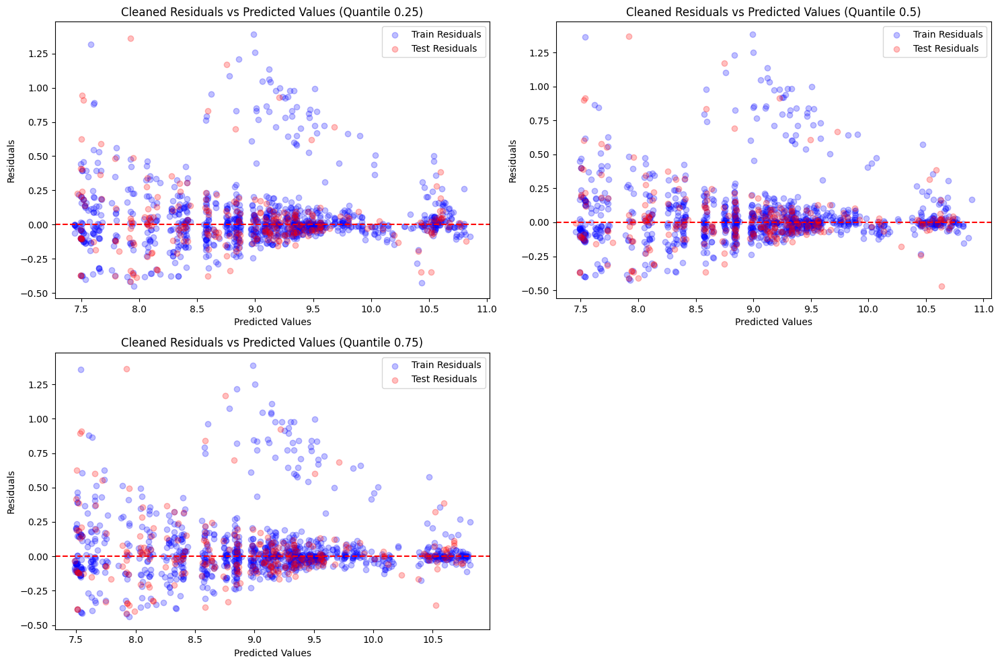

In [ ]:
X_cleaned = data_log_fs_cleaned.drop(columns=[target_column, 'charges'])
y_cleaned = data_log_fs_cleaned[target_column]

# Add a constant term for the intercept
X_cleaned = sm.add_constant(X_cleaned)

# Split the cleaned data into training and testing sets
X_train_cleaned, X_test_cleaned, y_train_cleaned, y_test_cleaned = train_test_split(X_cleaned, y_cleaned, test_size=0.2, random_state=42)

quantiles = [0.25, 0.5, 0.75]
results = {}

for q in quantiles:
    #res, y_pred_train_cq, y_pred_test_cq = quantile_regression(q, X_train_cleaned, y_train_cleaned, X_test_cleaned, y_test_cleaned)
    res, y_pred_train_cq, y_pred_test_cq = xgboost_quantile_regression(q, X_train_cleaned, y_train_cleaned, X_test_cleaned, y_test_cleaned)
    results[q] = (res, y_pred_train_cq, y_pred_test_cq)

plt.figure(figsize=(15, 10))

for i, q in enumerate(quantiles):
    res, y_pred_train_cq, y_pred_test_cq = results[q]

    # Calculate residuals for the training set
    residuals_train_cq = y_train_cleaned - y_pred_train_cq

    # Calculate residuals for the test set
    residuals_test_cq = y_test_cleaned - y_pred_test_cq

    # Plot residuals for the training and test sets together
    plt.subplot(2, 2, i+1)
    plt.scatter(y_pred_train_cq, residuals_train_cq, color='blue', alpha=0.25, label='Train Residuals')
    plt.scatter(y_pred_test_cq, residuals_test_cq, color='red', alpha=0.25, label='Test Residuals')
    plt.axhline(y=0, color='red', linestyle='--')
    plt.xlabel('Predicted Values')
    plt.ylabel('Residuals')
    plt.title(f'Cleaned Residuals vs Predicted Values (Quantile {q})')
    plt.legend()

plt.tight_layout()
plt.show()
